In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
%qtconsole

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
from os.path import join, abspath, dirname, pardir

from loren_frank_data_processing import Animal

# LFP sampling frequency
SAMPLING_FREQUENCY = 1500

# Data directories and definitions
ROOT_DIR = '../'
RAW_DATA_DIR = join(ROOT_DIR, 'Raw-Data')
PROCESSED_DATA_DIR = join(ROOT_DIR, 'Processed-Data')

ANIMALS = {
    'bon': Animal(directory=join(RAW_DATA_DIR, 'Bond'),
                  short_name='bon'),
}

In [90]:
from loren_frank_data_processing import (get_interpolated_position_dataframe,
                                         get_LFPs,
                                         get_multiunit_indicator_dataframe,
                                         get_all_spike_indicators,
                                         get_trial_time,
                                         make_tetrode_dataframe,
                                         reshape_to_segments, save_xarray,
                                        make_neuron_dataframe)
from replay_classification import ClusterlessDecoder, SortedSpikeDecoder
from ripple_detection import Kay_ripple_detector, multiunit_HSE_detector


_BRAIN_AREAS = ['CA1', 'CA3']
_MARKS = ['channel_1_max', 'channel_2_max', 'channel_3_max',
          'channel_4_max']

def _get_ripple_marks(marks, ripple_times, sampling_frequency):
    mark_ripples = [reshape_to_segments(
        tetrode_marks, ripple_times, sampling_frequency=sampling_frequency,
        axis=0)
        for tetrode_marks in marks]

    return [(np.stack([df.loc[ripple_number, :].values
                       for df in mark_ripples], axis=0),
             mark_ripples[0].loc[ripple_number, :]
             .index.get_level_values('time'))
            for ripple_number in ripple_times.index]

def _get_ripple_spikes(spikes, ripple_times, sampling_frequency):
    '''Given the ripple times, extract the spikes within the ripple
    '''
    ripple_spikes = reshape_to_segments(spikes, ripple_times, sampling_frequency=sampling_frequency)
    return [(ripple_spikes.loc[ripple_number, :].values.T,
             ripple_spikes.loc[ripple_number, :].index)
            for ripple_number in ripple_times.index]


def decode_ripple_clusterless(epoch_key, animals,
                              model, model_kwargs,
                              position_info=None,
                              sampling_frequency=1500,
                              n_position_bins=61,
                              confidence_threshold=0.8,
                              mark_names=_MARKS,
                              brain_areas=_BRAIN_AREAS,
                              include_correct=True):
    tetrode_info = make_tetrode_dataframe(animals).xs(
        epoch_key, drop_level=False)
    brain_areas = [brain_areas] if isinstance(
        brain_areas, str) else brain_areas
    is_brain_areas = tetrode_info.area.isin(brain_areas)
    brain_areas_tetrodes = tetrode_info[
        is_brain_areas &
        tetrode_info.numcells > 0]

    if mark_names is None:
        # Use all available mark dimensions
        mark_names = get_multiunit_indicator_dataframe(
            brain_areas_tetrodes.nchans.argmax(), animals).columns.tolist()
        mark_names = [mark_name for mark_name in mark_names
                      if mark_name not in ['x_position', 'y_position']]

    marks = []
    for tetrode_key in brain_areas_tetrodes.index:
        multiunit_df = get_multiunit_indicator_dataframe(tetrode_key, animals)
        if multiunit_df is not None:
            marks.append(multiunit_df.loc[:, mark_names])

    if position_info is None:
        position_info = get_interpolated_position_dataframe(epoch_key, animals)
    else:
        position_info = position_info.copy()

    position_info['lagged_linear_distance'] = (
        position_info.linear_distance.shift(1))
    position_info['lagged_linear_position'] = (
        position_info.linear_position.shift(1))
    KEEP_COLUMNS = ['linear_distance', 'lagged_linear_distance', 'task',
                    'is_correct', 'turn', 'speed', 'head_direction',
                    'linear_position', 'lagged_linear_position']

    is_correct = (position_info.is_correct if include_correct
                  else np.ones_like(position_info.is_correct))
    is_moving = (position_info.speed > 4).values
    train_position_info = position_info[KEEP_COLUMNS].loc[
        is_moving & is_correct].dropna()

    training_marks = np.stack([
        tetrode_marks.loc[train_position_info.index, mark_names]
        for tetrode_marks in marks], axis=0)
    
    decoder = ClusterlessDecoder(
        position=train_position_info.linear_position.values,
        lagged_position=train_position_info.lagged_linear_position.values,
        trajectory_direction=train_position_info.task.values,
        spike_marks=training_marks,
        n_position_bins=n_position_bins,
        replay_speedup_factor=33,
        model=model,
        model_kwargs=model_kwargs,

        confidence_threshold=confidence_threshold,
    ).fit()
    
    ripple_times = np.array([[2790.730, 2791.069],
                             [2570.073, 2570.246],
                             [2947.943, 2948.179],
                             [2585.179, 2585.421]])
    ripple_times = pd.DataFrame({'start_time': pd.to_timedelta(ripple_times[:, 0], unit='s'),
                                 'end_time': pd.to_timedelta(ripple_times[:, 1], unit='s')},
                               index=pd.Index(np.arange(4) + 1, name='ripple_number'))
    ripple_times = ripple_times.reindex_axis(['start_time', 'end_time'], axis=1)
    test_marks = _get_ripple_marks(marks, ripple_times, sampling_frequency)
    results = [decoder.predict(ripple_marks, time.total_seconds())
               for ripple_marks, time in test_marks]

    return results



def decode_ripple_spikes(epoch_key, animals,
                         position_info=None,
                         sampling_frequency=1500,
                         n_position_bins=61,
                         confidence_threshold=0.8,
                         brain_areas=_BRAIN_AREAS,
                         include_correct=True):
    neuron_info = make_neuron_dataframe(animals).xs(
        epoch_key, drop_level=False)
    brain_areas = [brain_areas] if isinstance(
        brain_areas, str) else brain_areas
    is_brain_areas = neuron_info.area.isin(brain_areas)
    neuron_info = neuron_info[is_brain_areas & neuron_info.numspikes > 0]
    spikes = get_all_spike_indicators(neuron_info.index, animals)

    if position_info is None:
        position_info = get_interpolated_position_dataframe(epoch_key, animals)
    else:
        position_info = position_info.copy()

    position_info['lagged_linear_distance'] = (
        position_info.linear_distance.shift(1))
    position_info['lagged_linear_position'] = (
        position_info.linear_position.shift(1))
    KEEP_COLUMNS = ['linear_distance', 'lagged_linear_distance', 'task',
                    'is_correct', 'turn', 'speed', 'head_direction',
                    'linear_position', 'lagged_linear_position']

    is_correct = (position_info.is_correct if include_correct
                  else np.ones_like(position_info.is_correct))
    is_moving = (position_info.speed > 4).values
    train_position_info = position_info[KEEP_COLUMNS].loc[
        is_moving & is_correct].dropna()

    training_spikes = spikes.loc[train_position_info.index].values.T
    
    decoder = SortedSpikeDecoder(
        position=train_position_info.linear_distance.values,
        lagged_position=train_position_info.lagged_linear_distance.values,
        spikes=training_spikes,
        n_position_bins=n_position_bins,
        replay_speedup_factor=16,
        trajectory_direction=train_position_info.task.values,
        confidence_threshold=confidence_threshold,
    ).fit()
    
    ripple_times = np.array([[2790.730, 2791.069],
                             [2570.073, 2570.246],
                             [2947.943, 2948.179],
                             [2585.179, 2585.421]])
    ripple_times = pd.DataFrame({'start_time': pd.to_timedelta(ripple_times[:, 0], unit='s'),
                                 'end_time': pd.to_timedelta(ripple_times[:, 1], unit='s')},
                               index=pd.Index(np.arange(4) + 1, name='ripple_number'))
    ripple_times = ripple_times.reindex_axis(['start_time', 'end_time'], axis=1)
    test_spikes = _get_ripple_spikes(spikes, ripple_times, sampling_frequency)
    results = [decoder.predict(ripple_spikes, time.total_seconds())
               for ripple_spikes, time in test_spikes]

    return results

In [27]:
epoch_key = ('bon', 4, 2)

position_info = get_interpolated_position_dataframe(epoch_key, ANIMALS)

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:49<00:00,  2.76s/it]


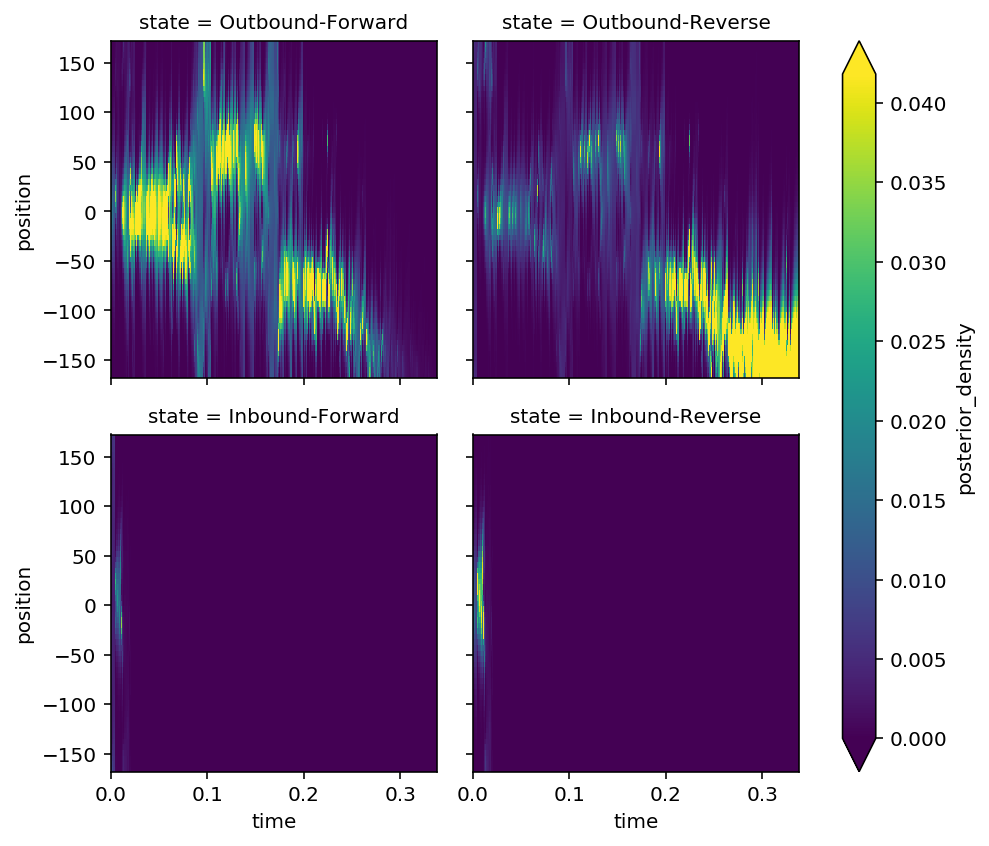

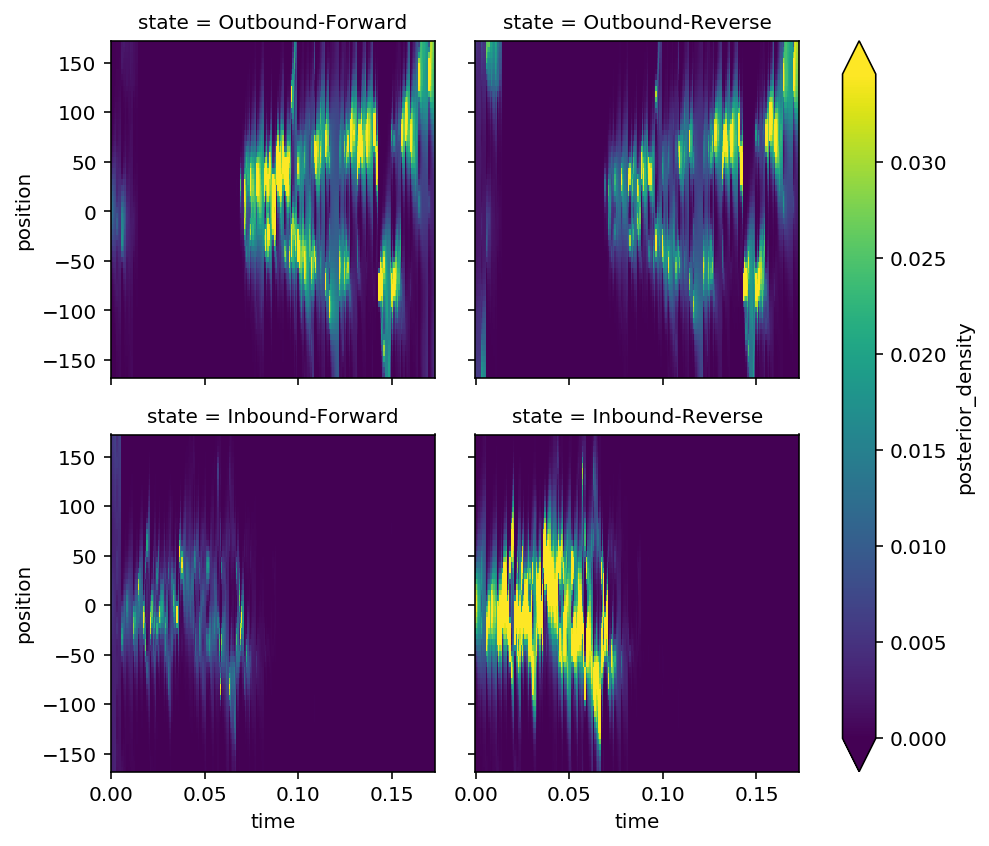

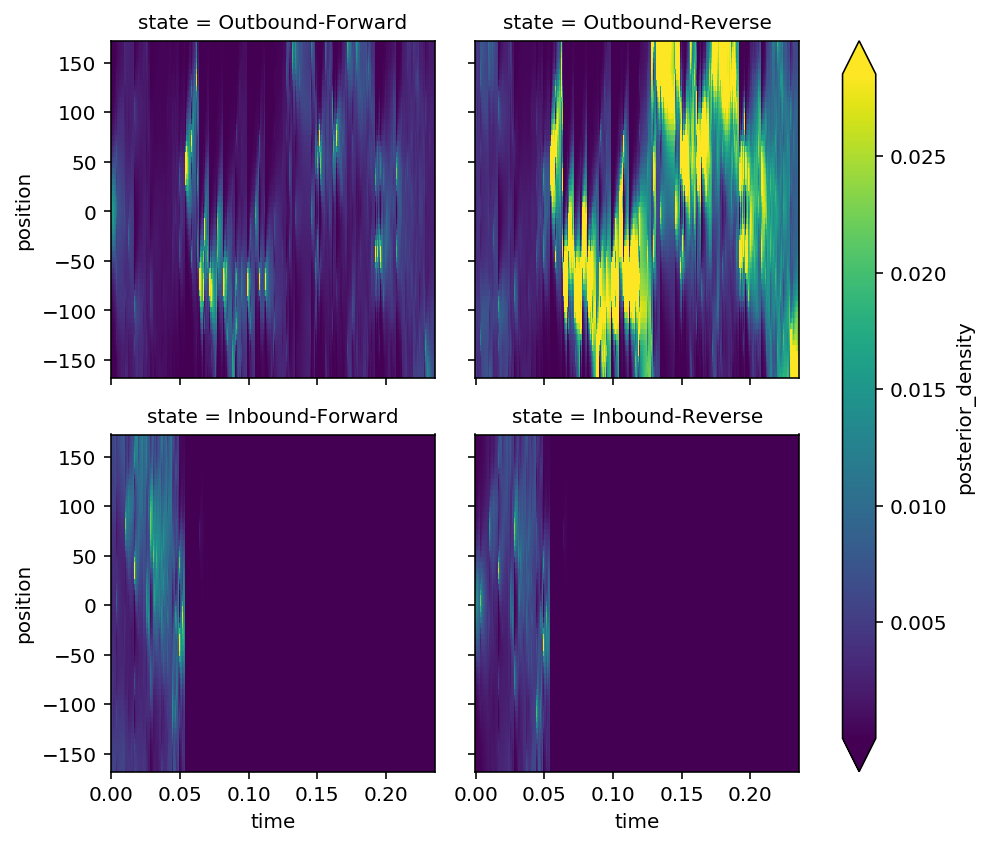

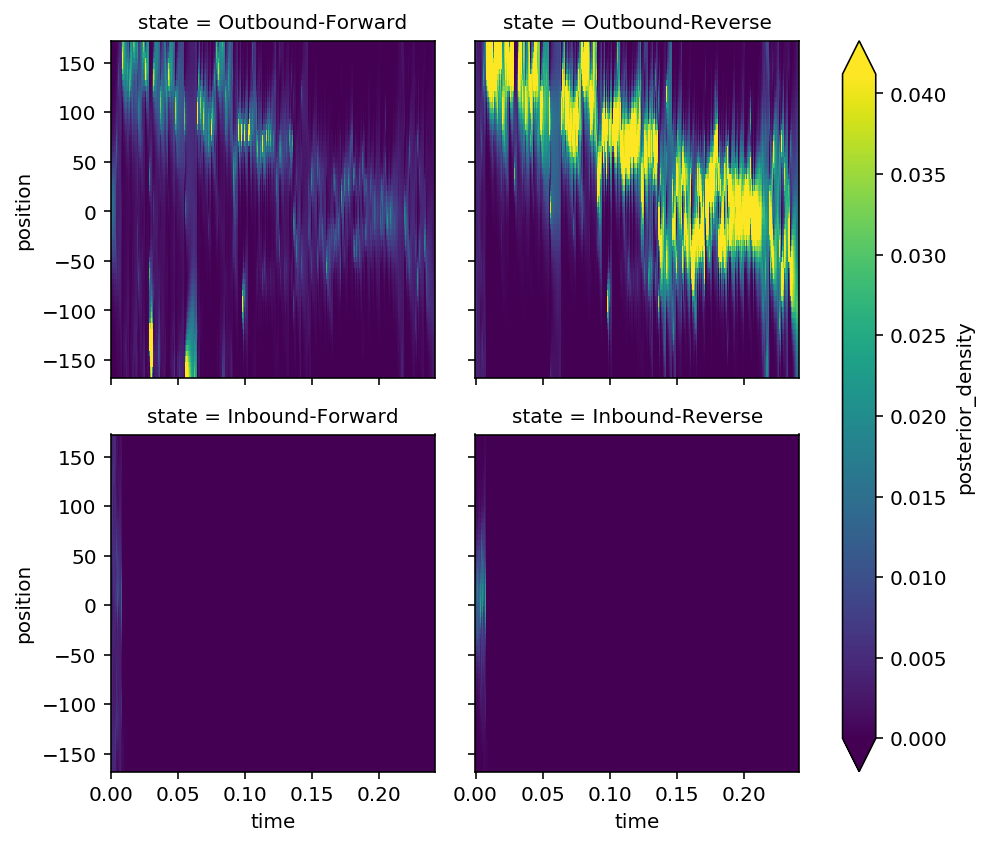

In [28]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=10)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:33<00:00,  1.86s/it]


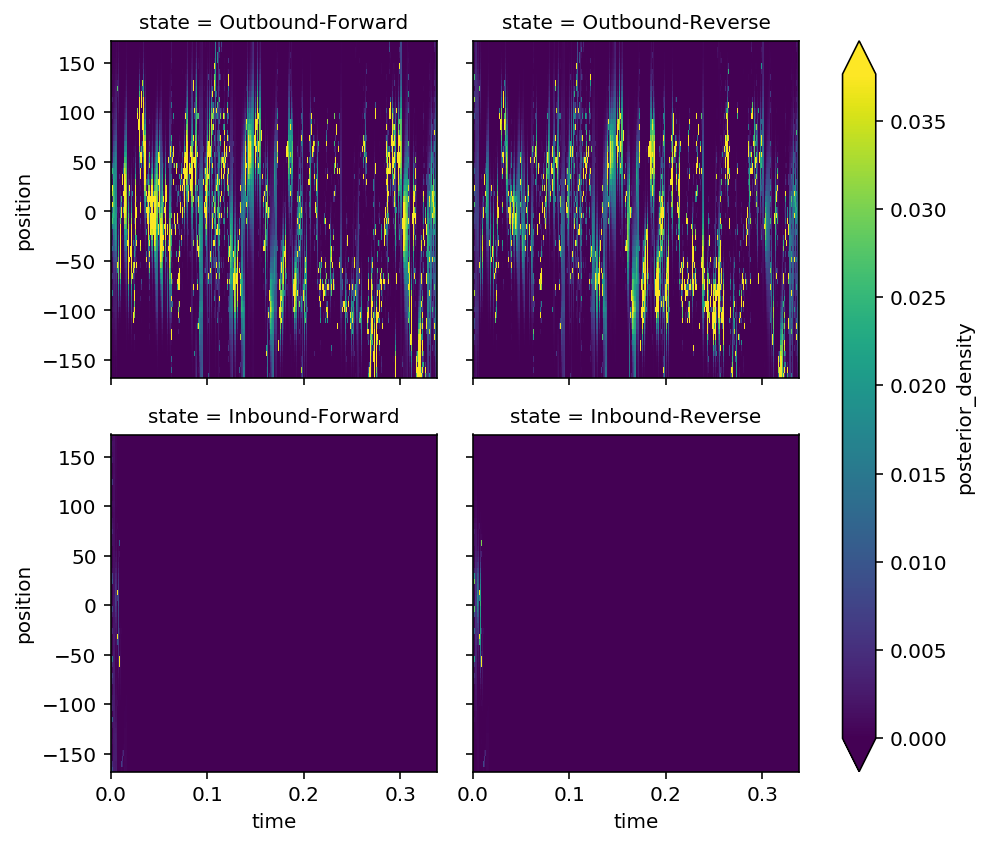

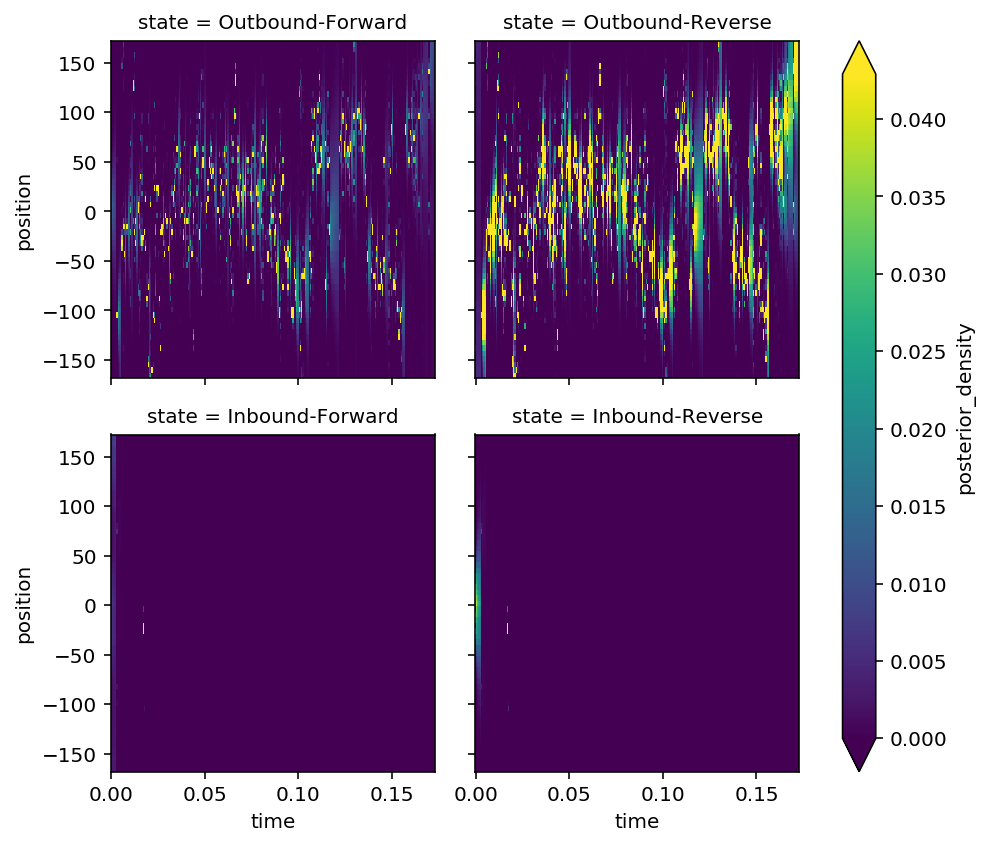

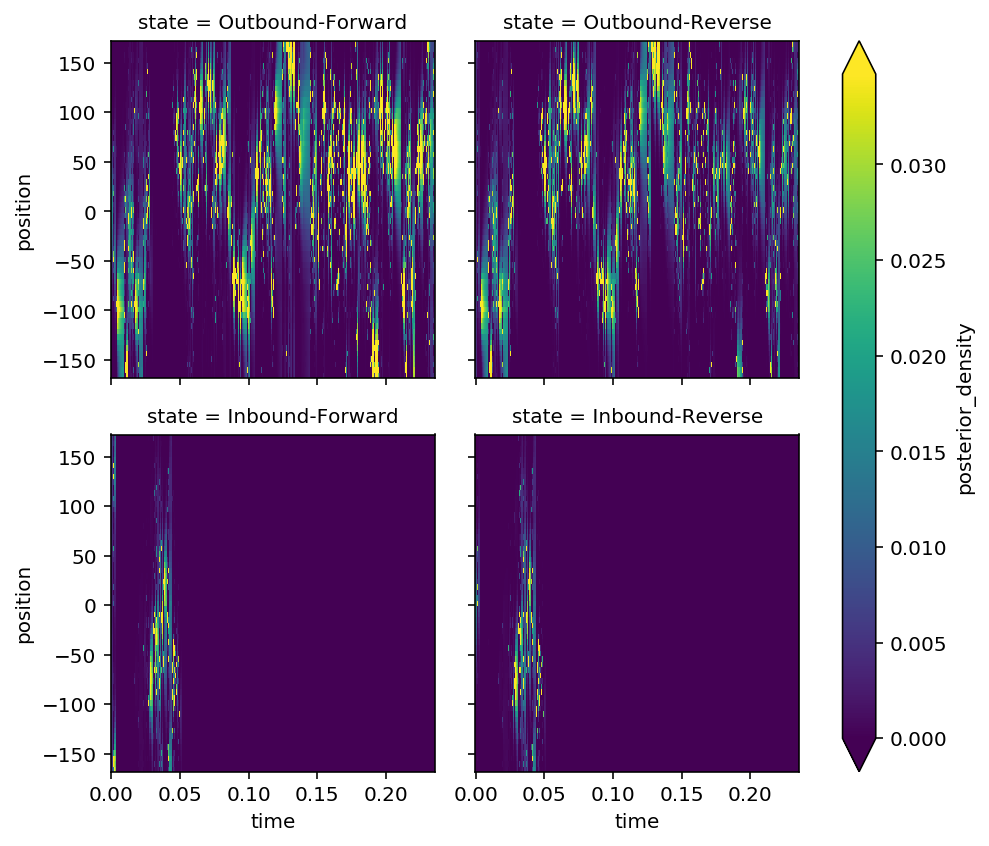

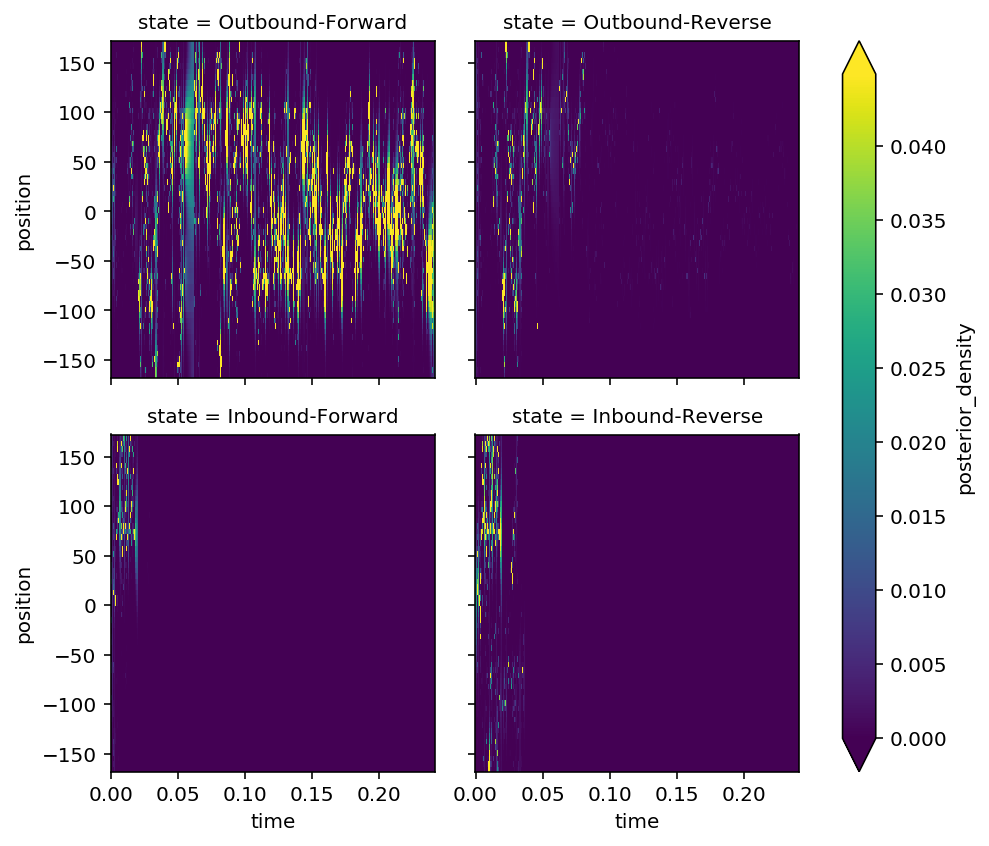

In [29]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=2)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [01:12<00:00,  4.02s/it]


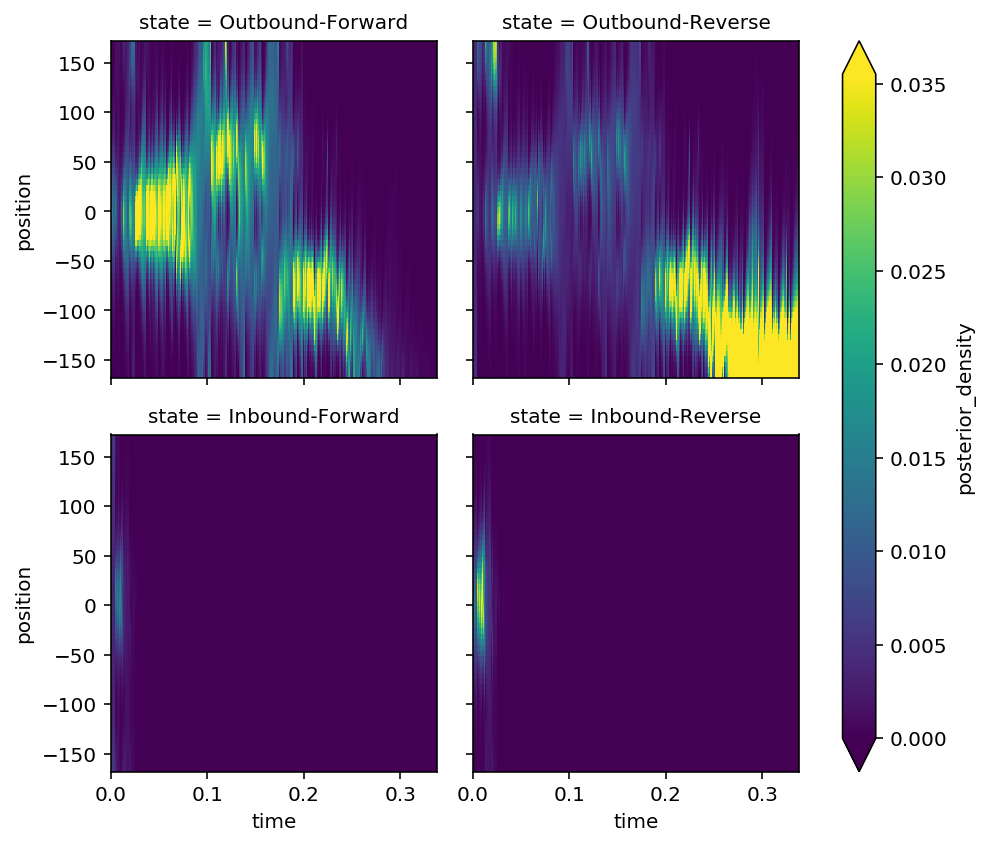

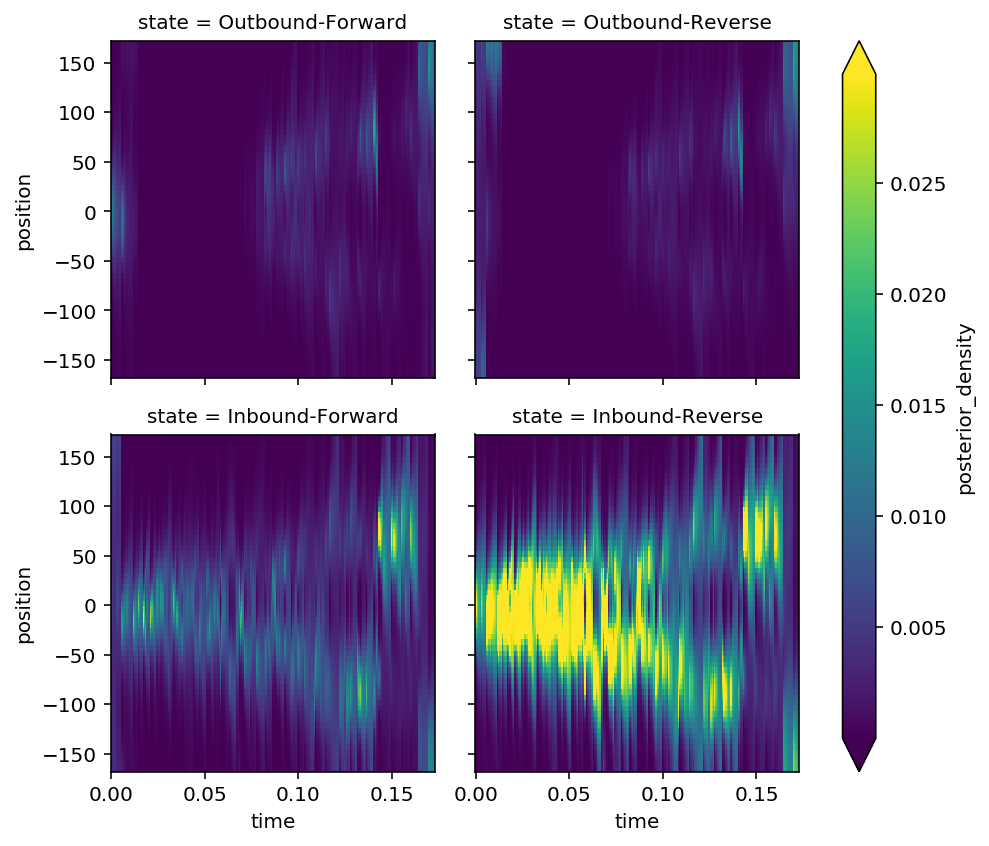

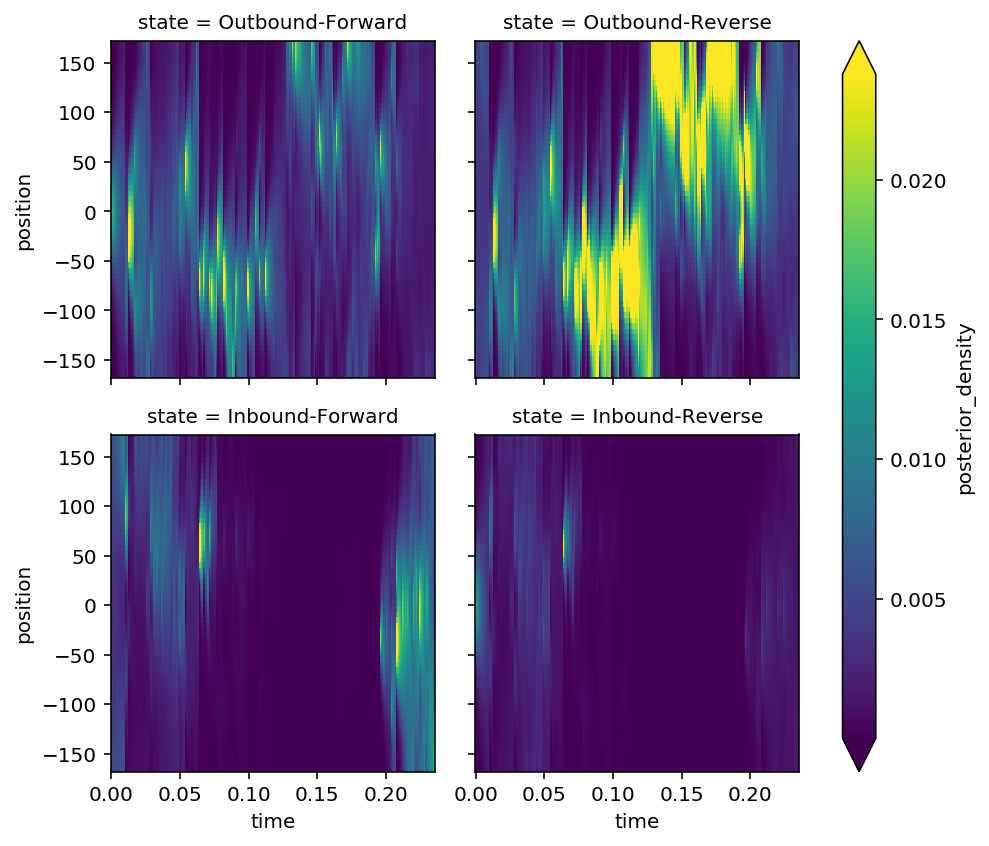

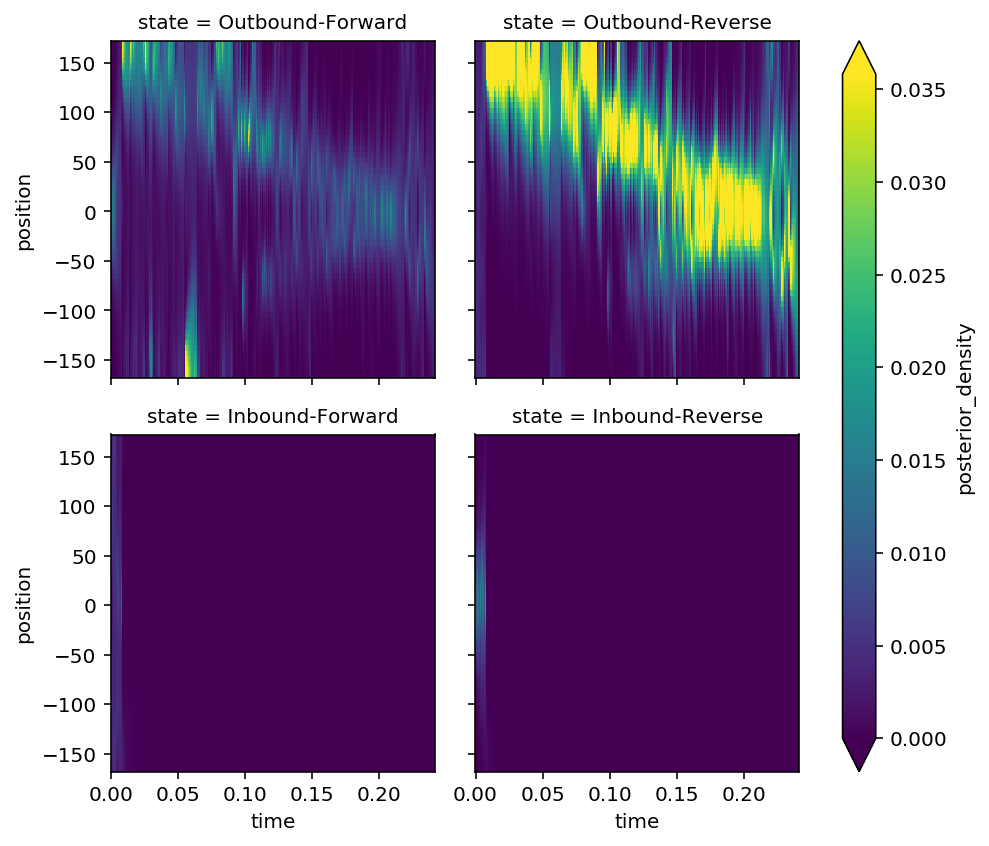

In [30]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=20)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:01<00:00, 13.92it/s]


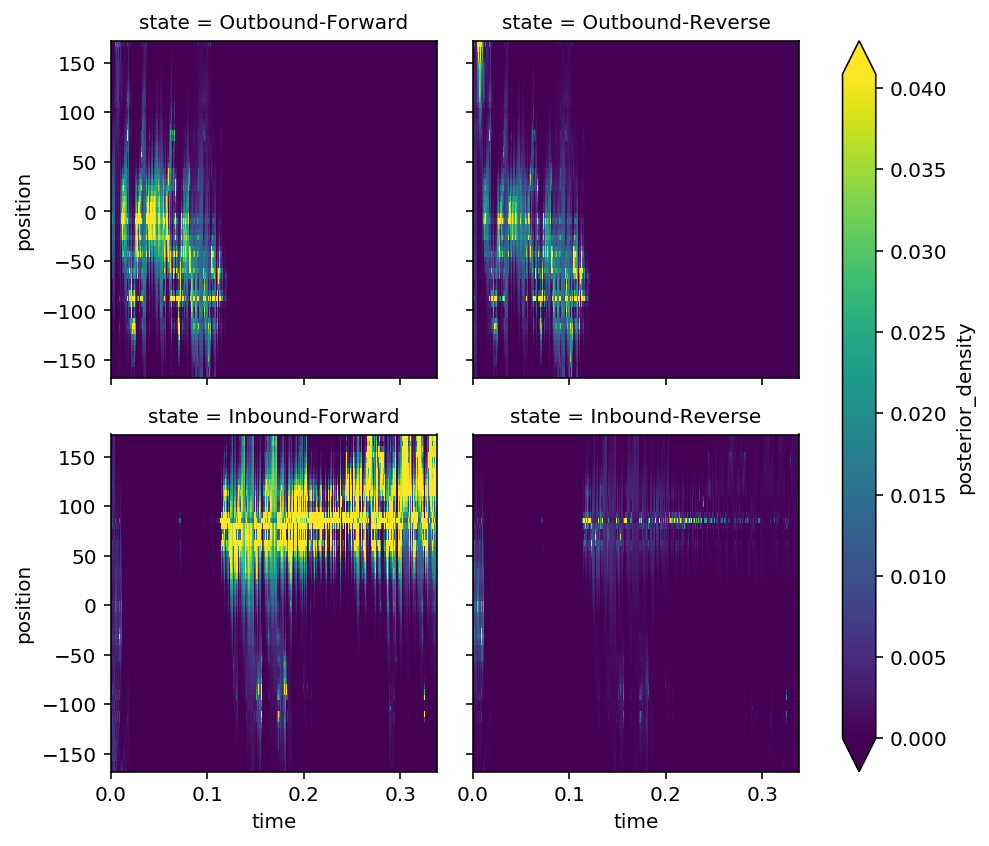

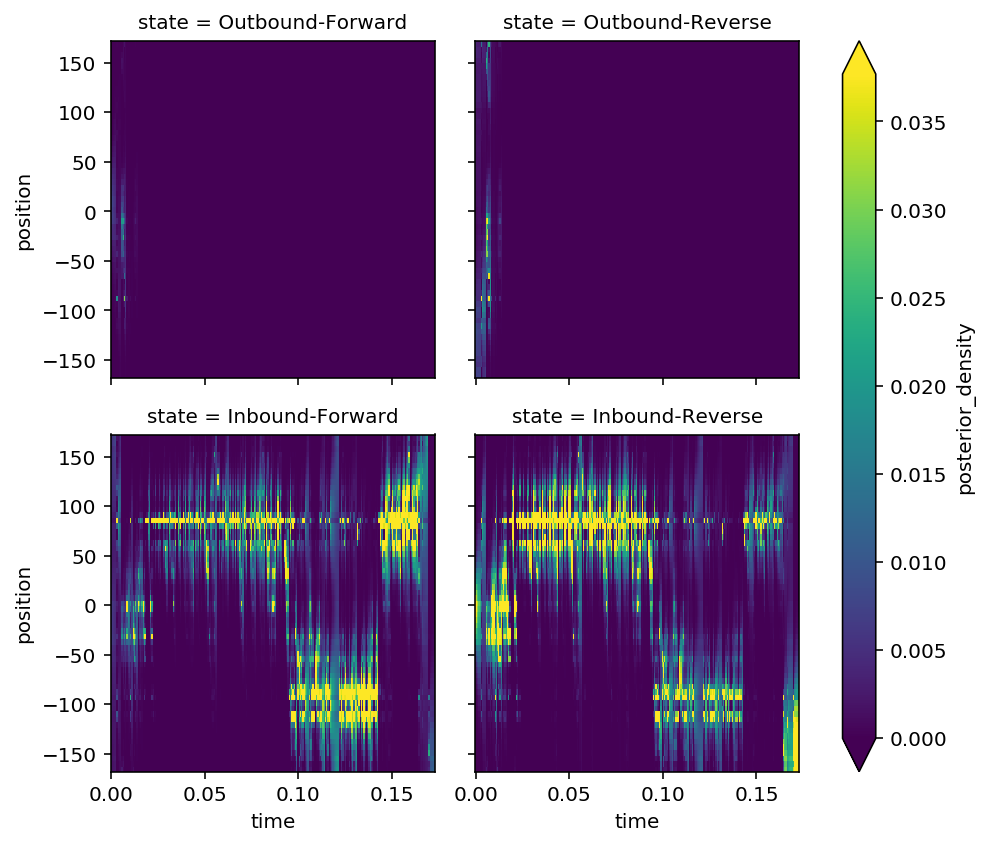

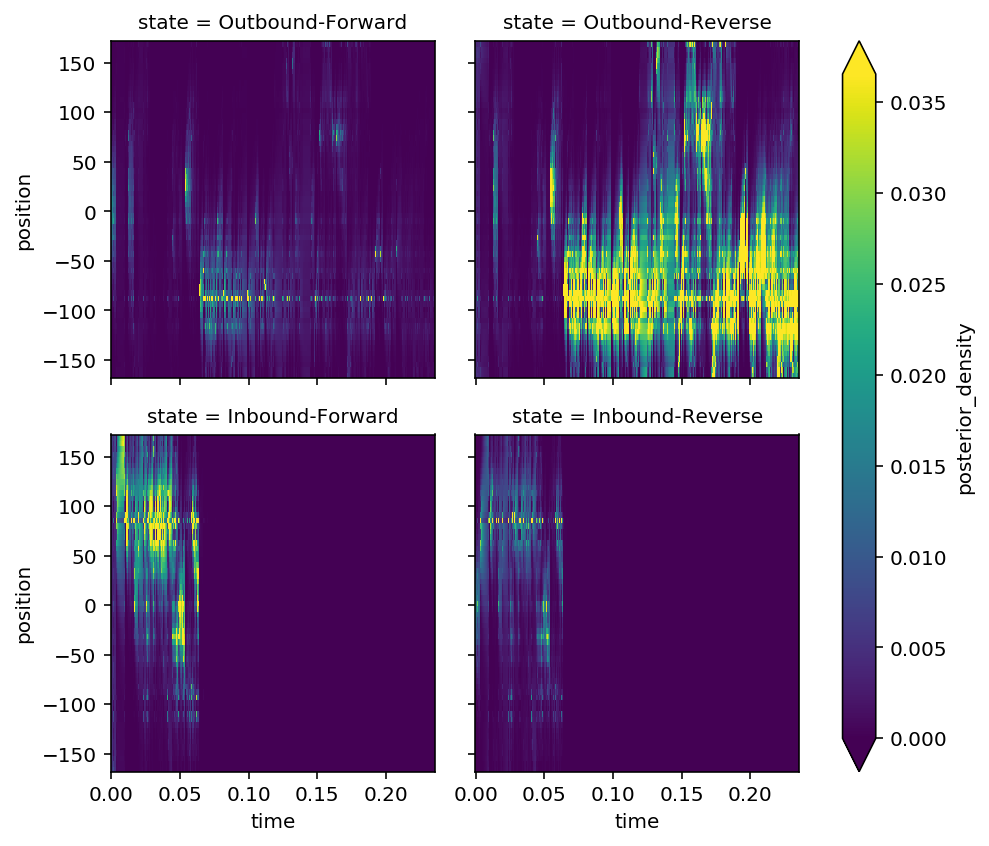

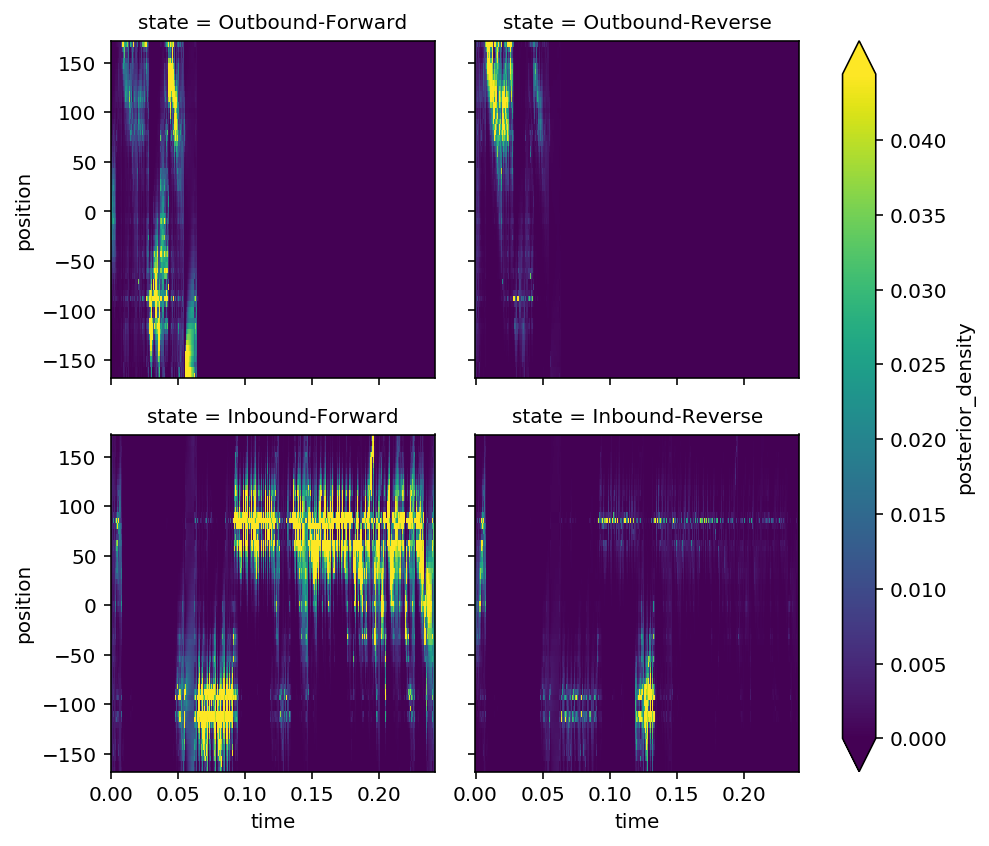

In [31]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=15)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
electrodes:   0%|          | 0/18 [00:00<?, ?it/s]/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate

/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization

/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization

electrodes:  83%|████████▎ | 15/18 [29:14<05:50, 116.98s/it]/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/skl

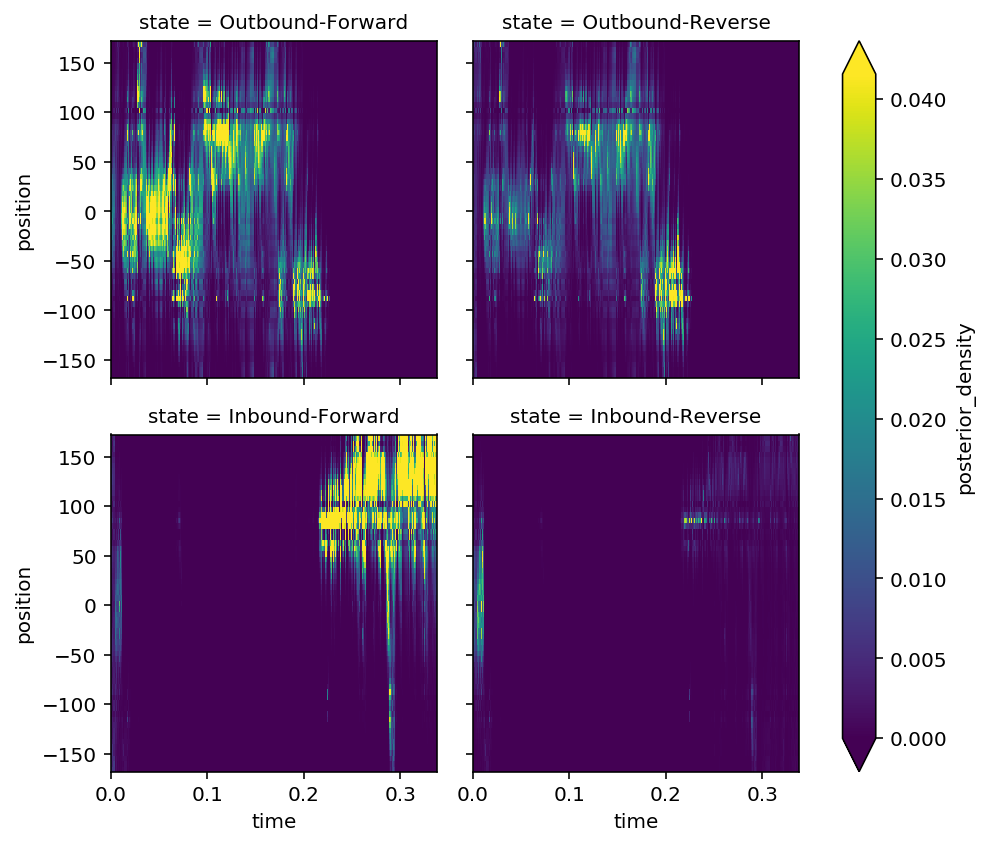

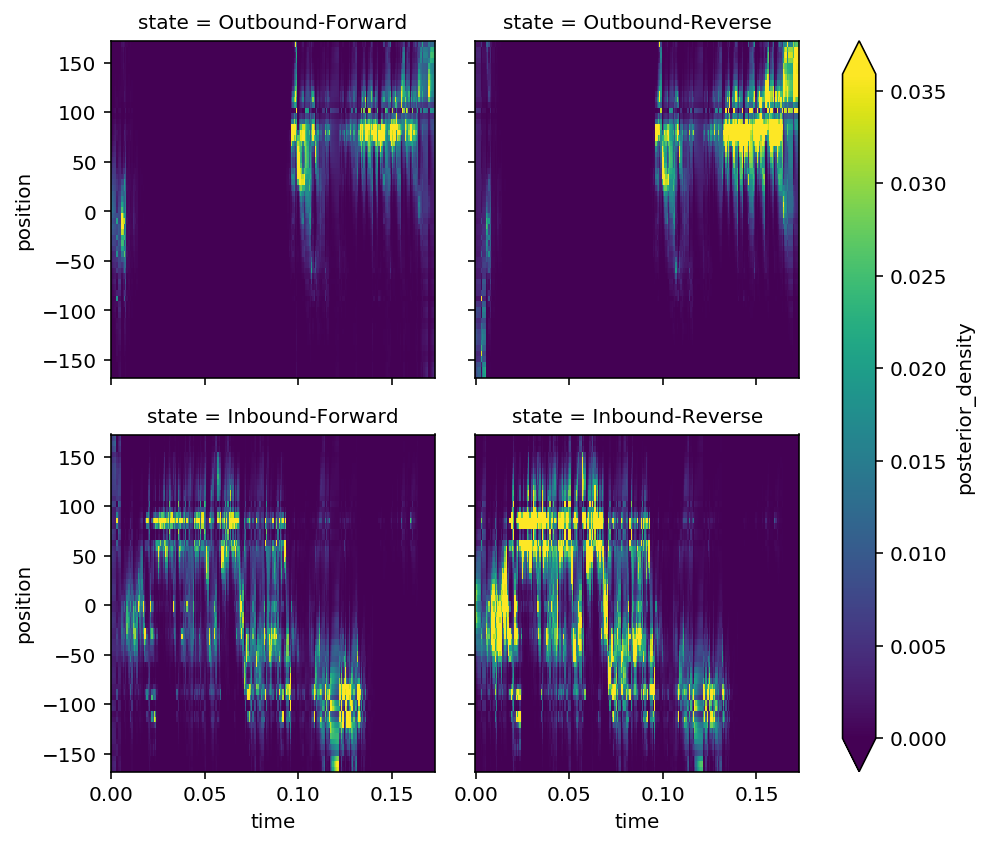

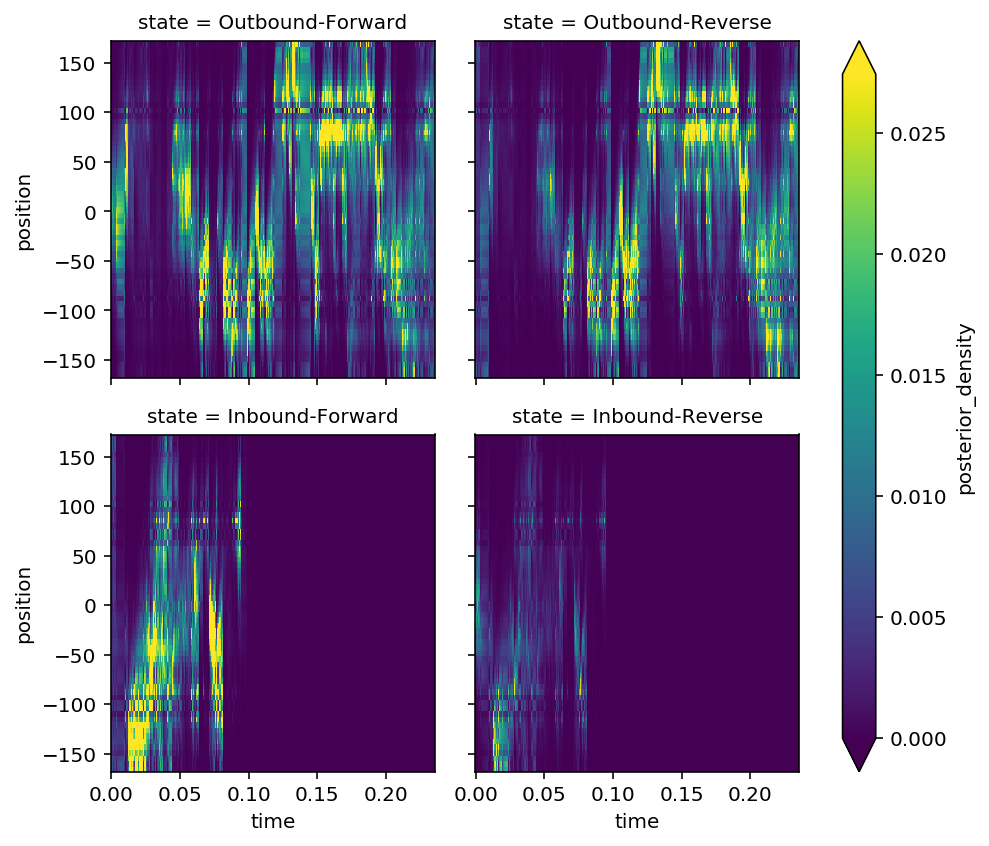

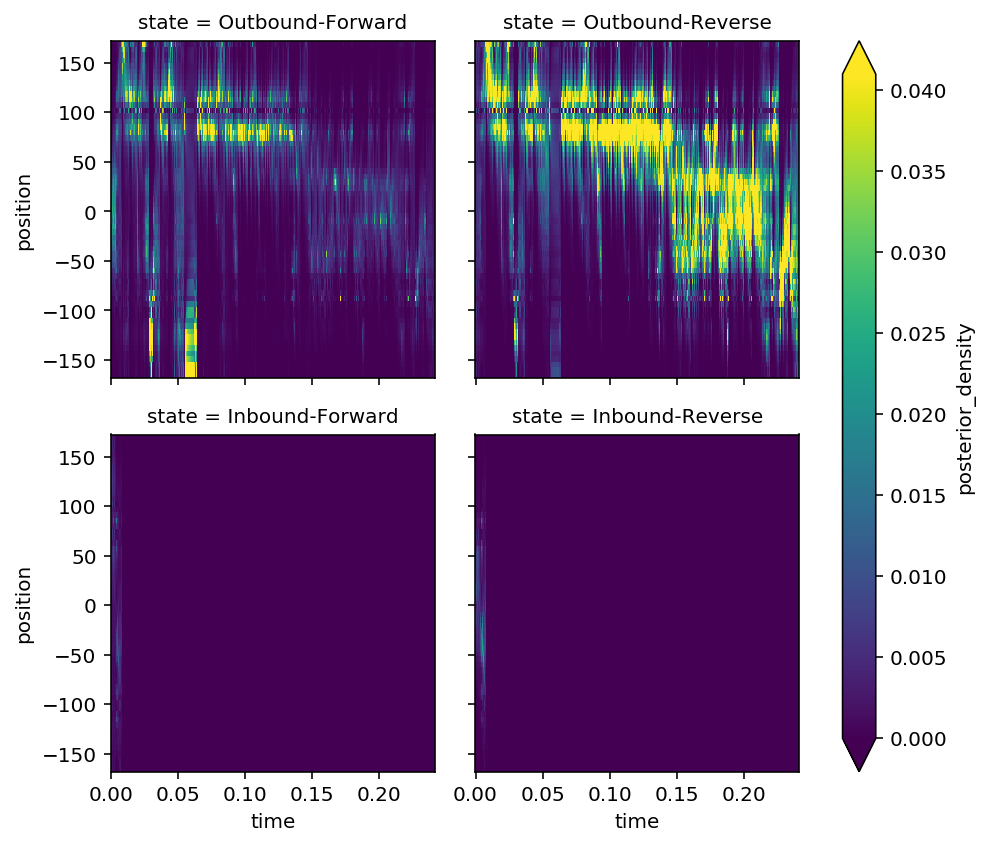

In [32]:
from sklearn.mixture import BayesianGaussianMixture

model = BayesianGaussianMixture
model_kwargs = dict(n_components=15)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:01<00:00,  9.15it/s]


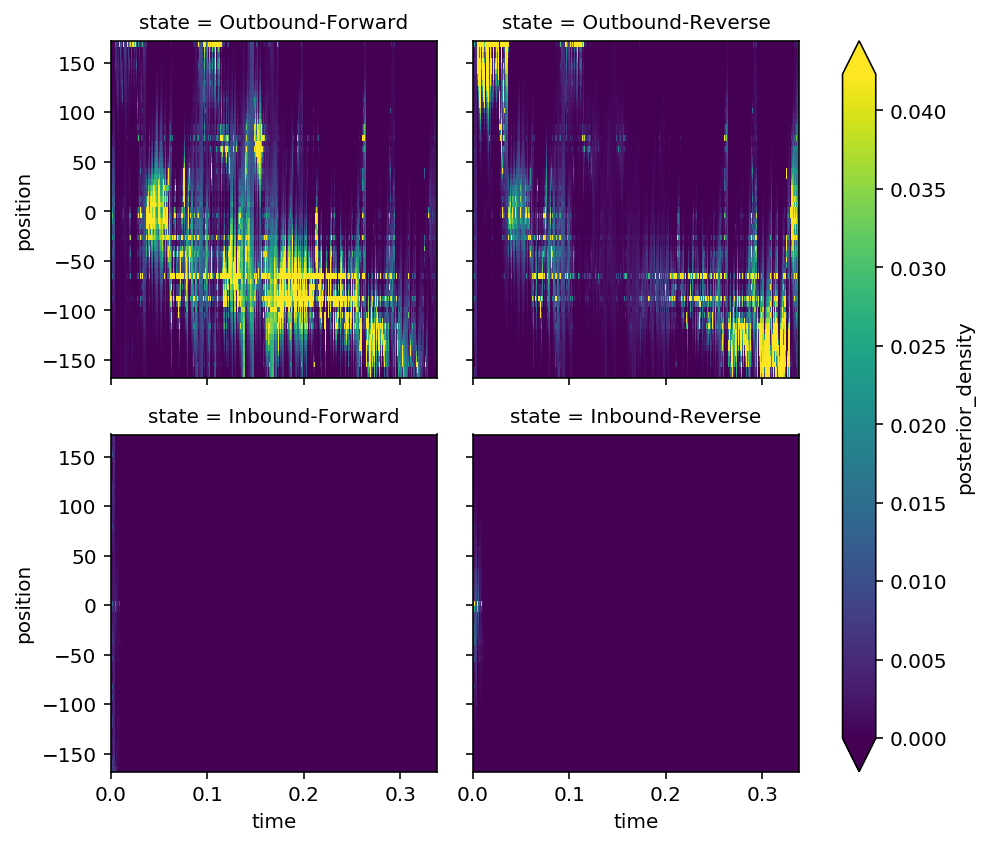

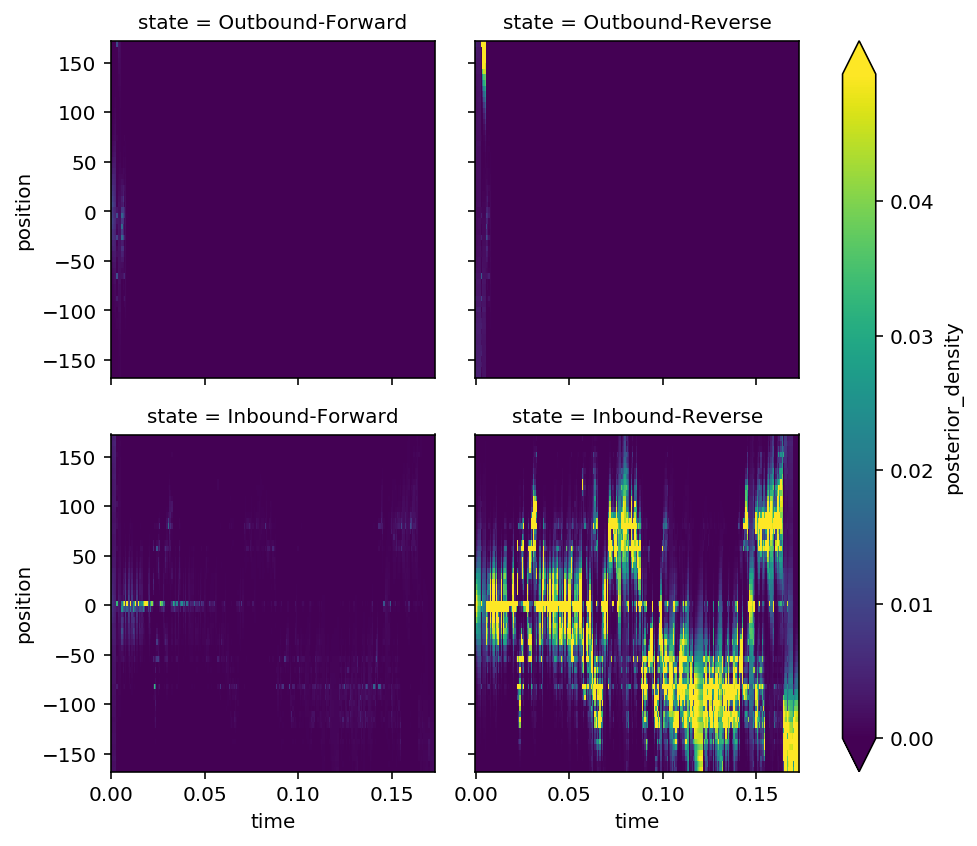

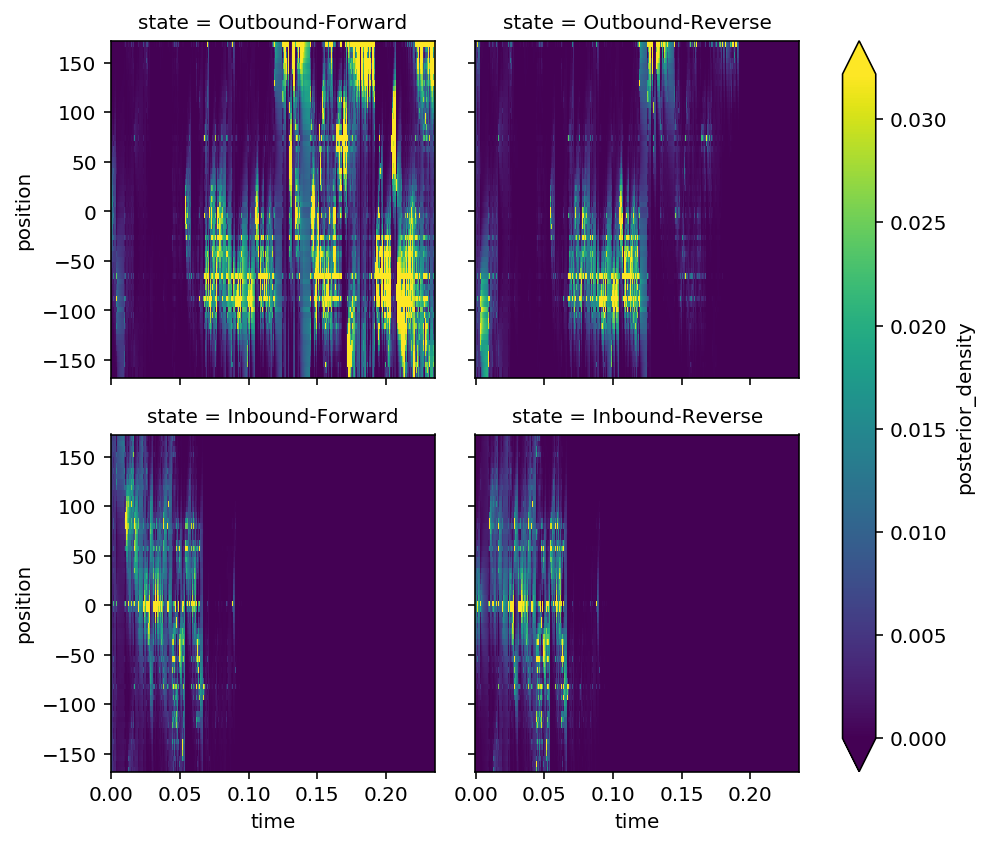

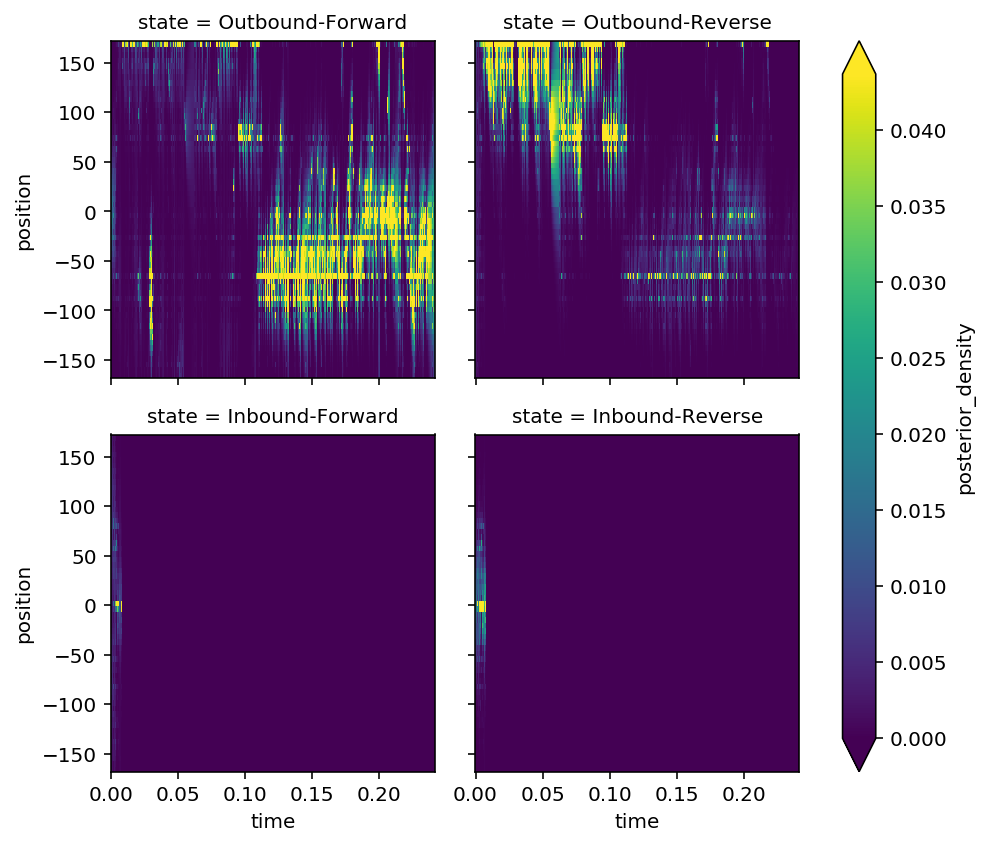

In [33]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=30)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:01<00:00,  9.39it/s]


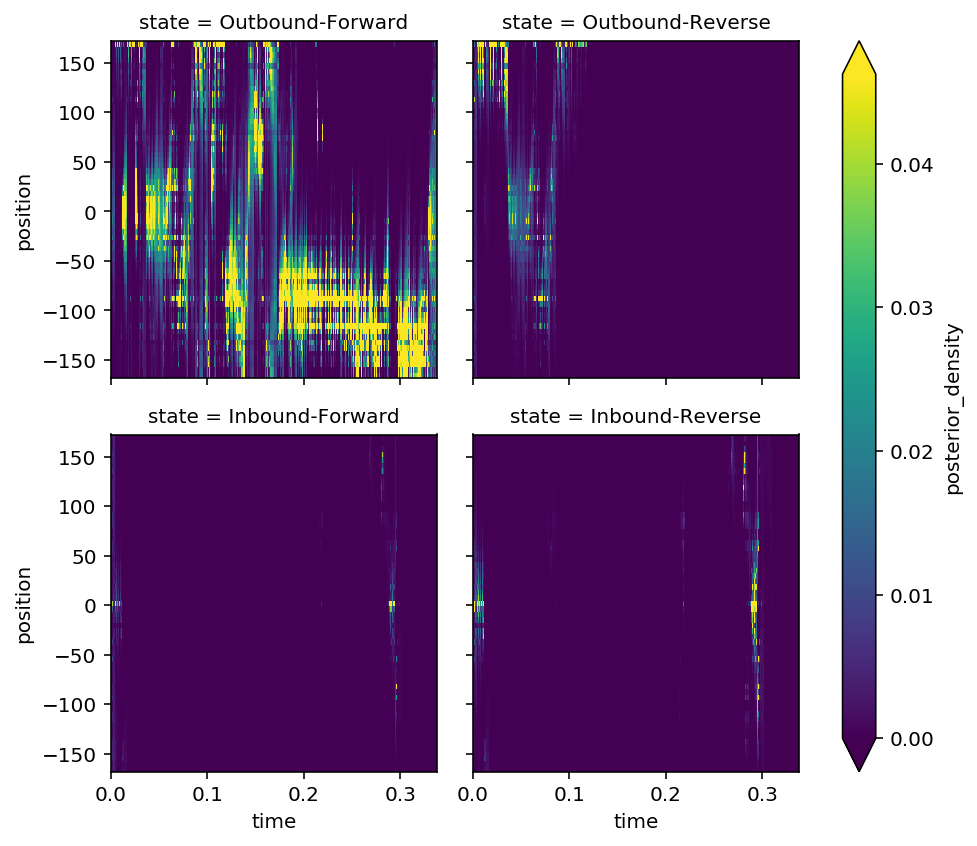

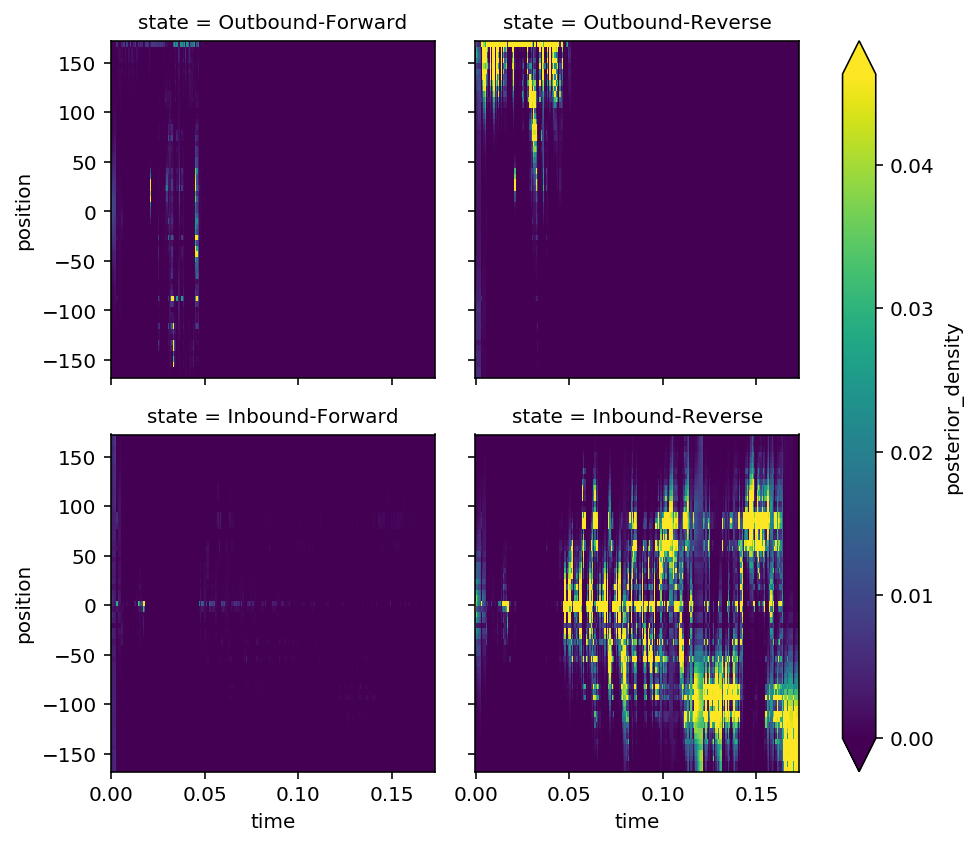

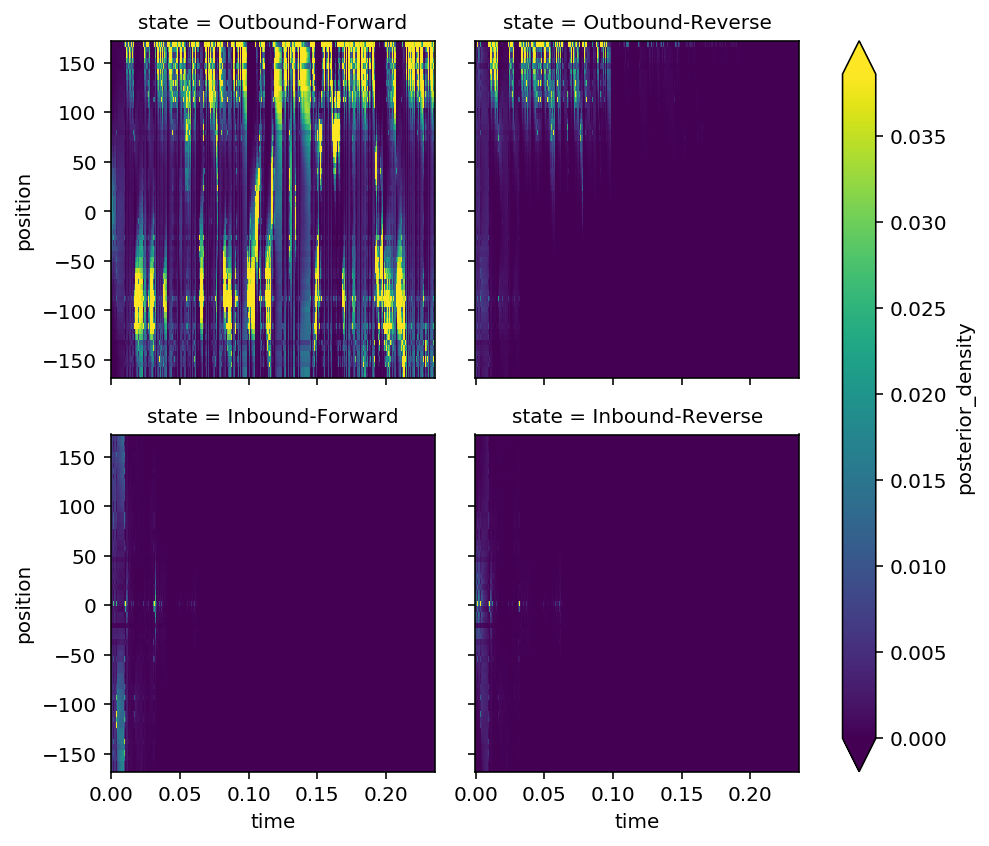

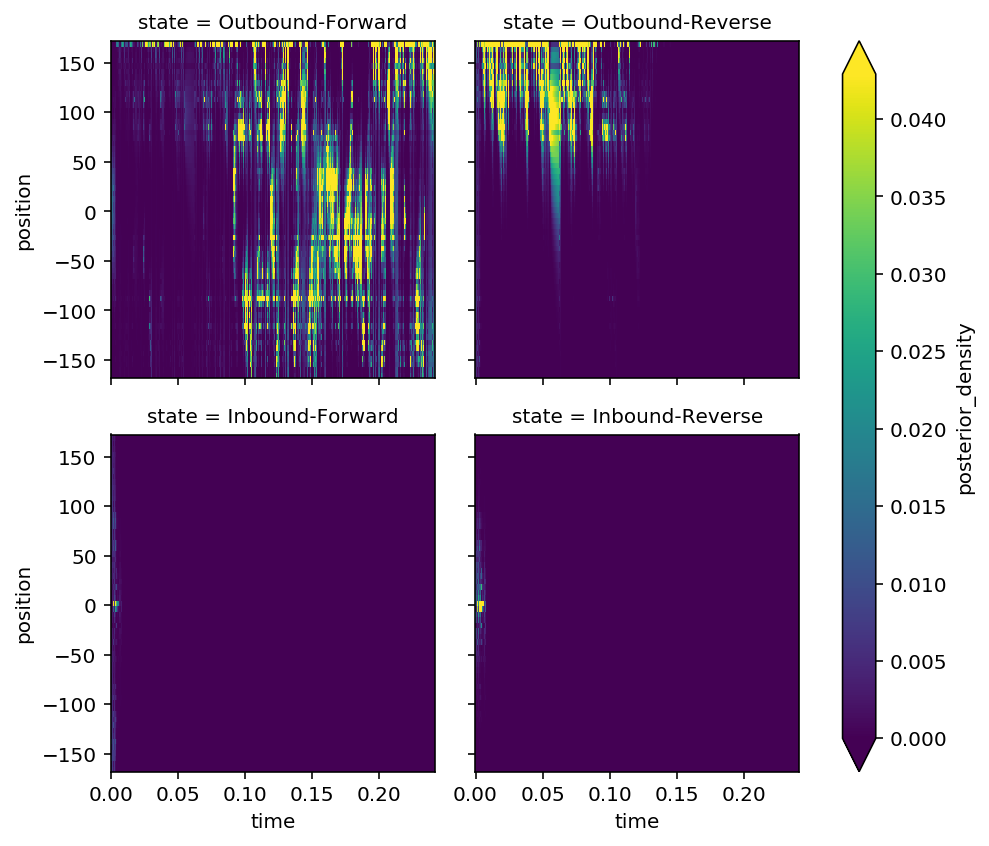

In [34]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=30, covariance_type='tied')

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:00<00:00, 18.11it/s]


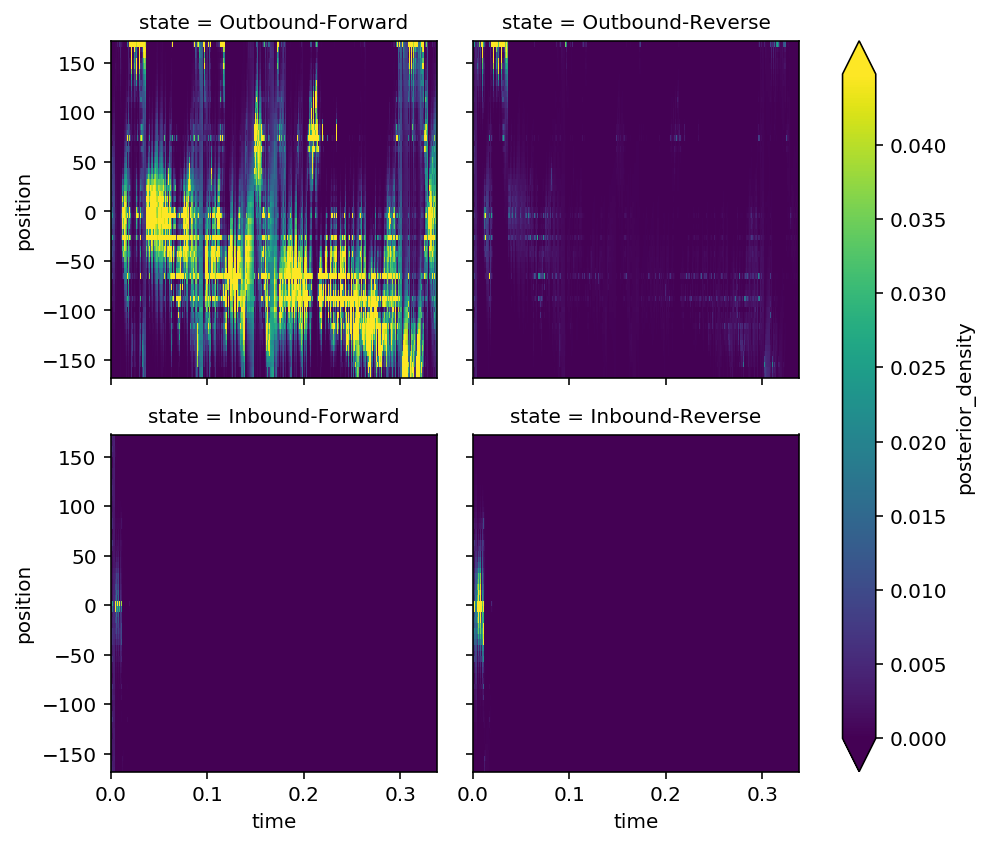

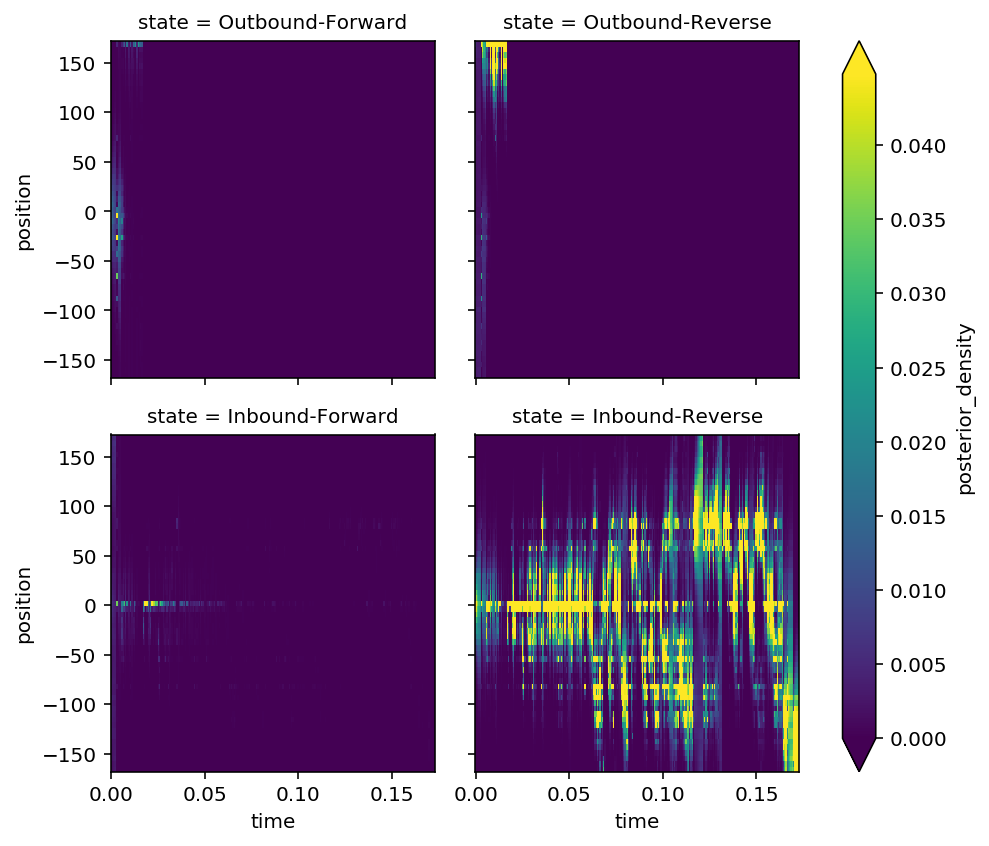

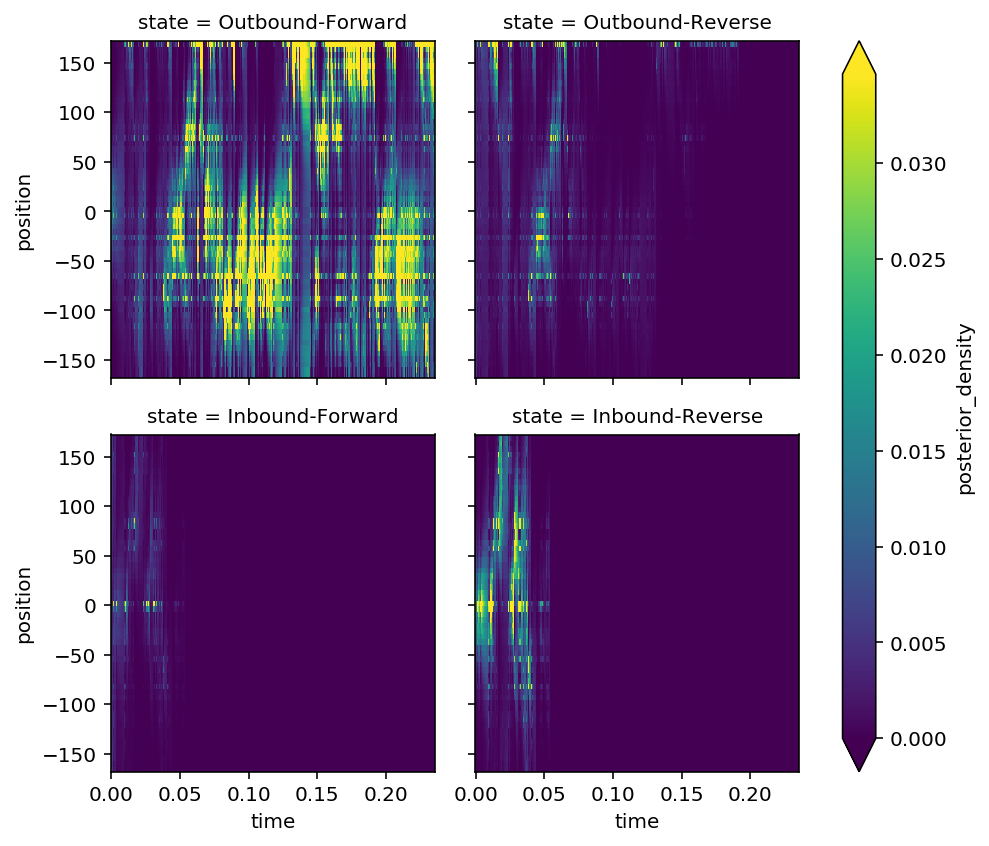

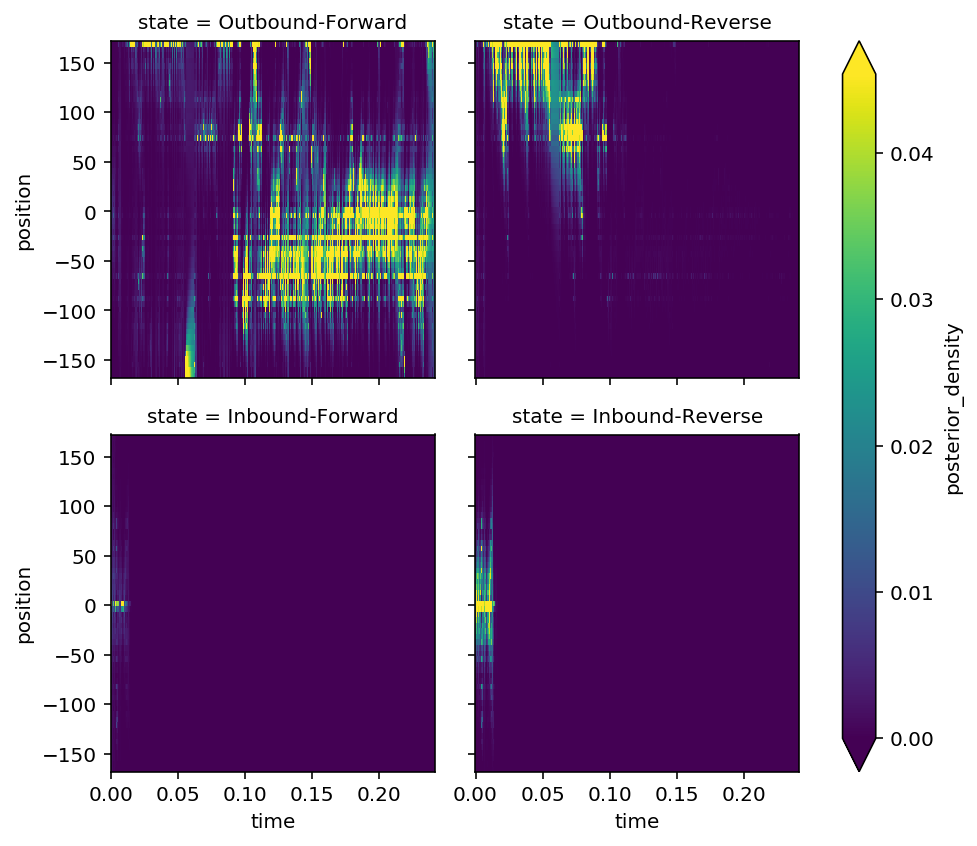

In [35]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=30, covariance_type='diag')

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:01<00:00, 13.49it/s]


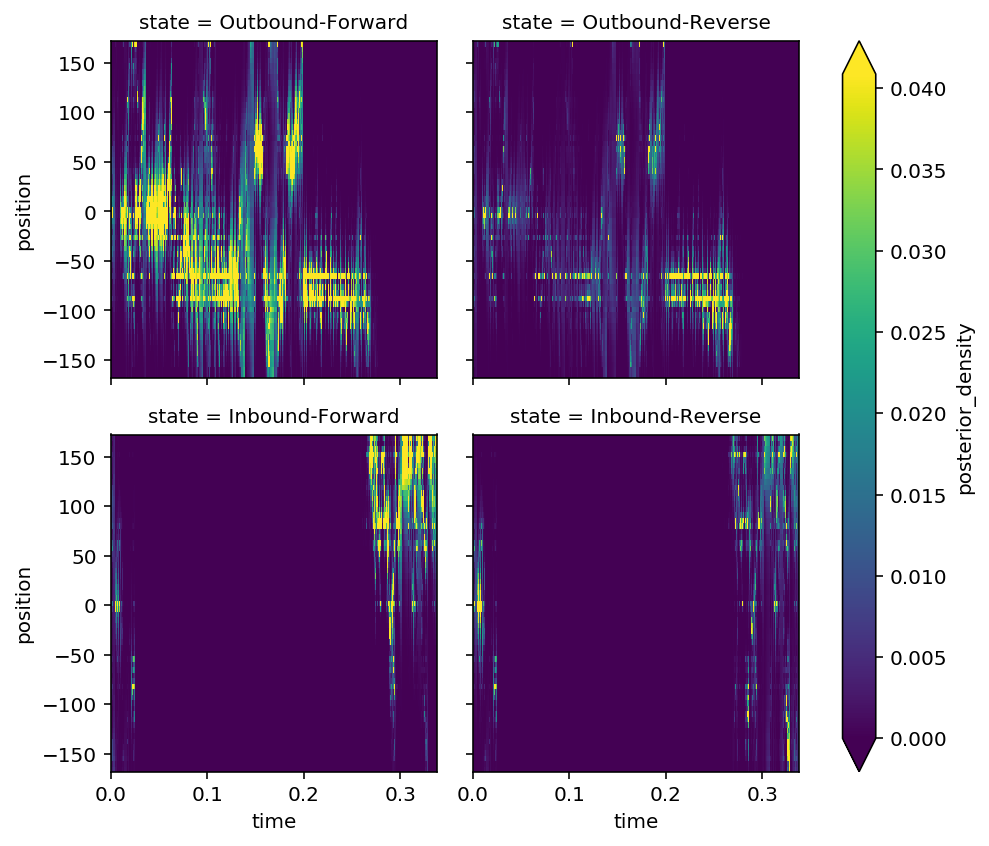

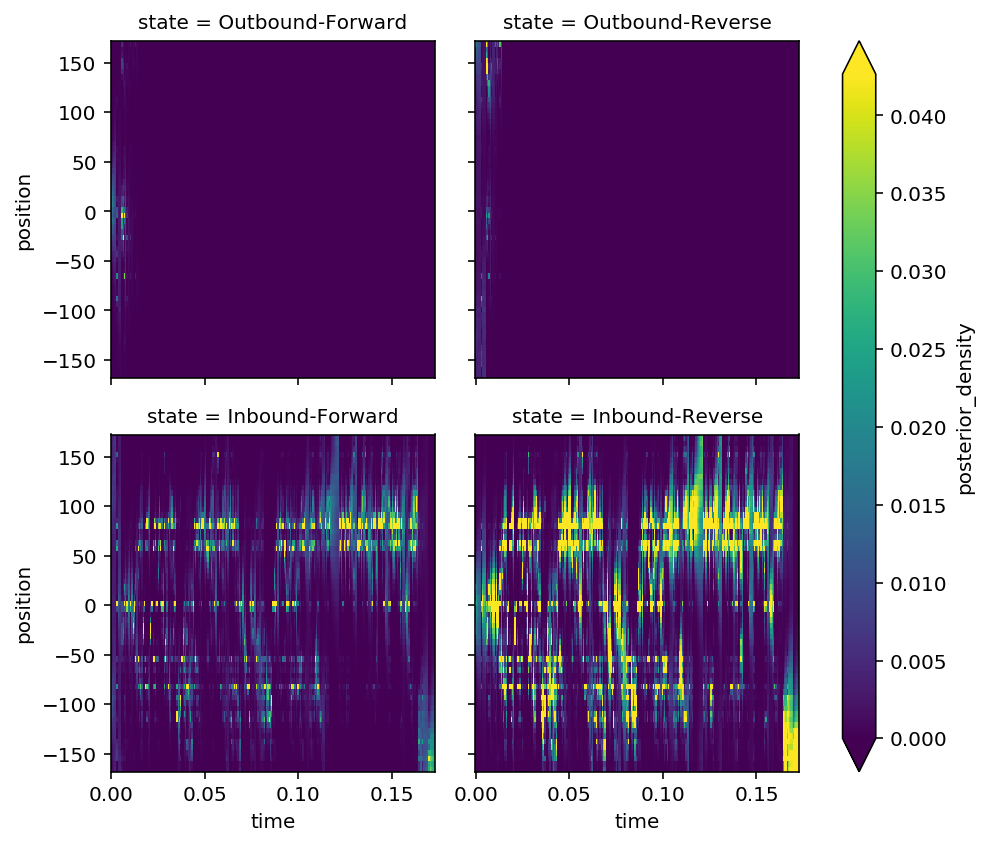

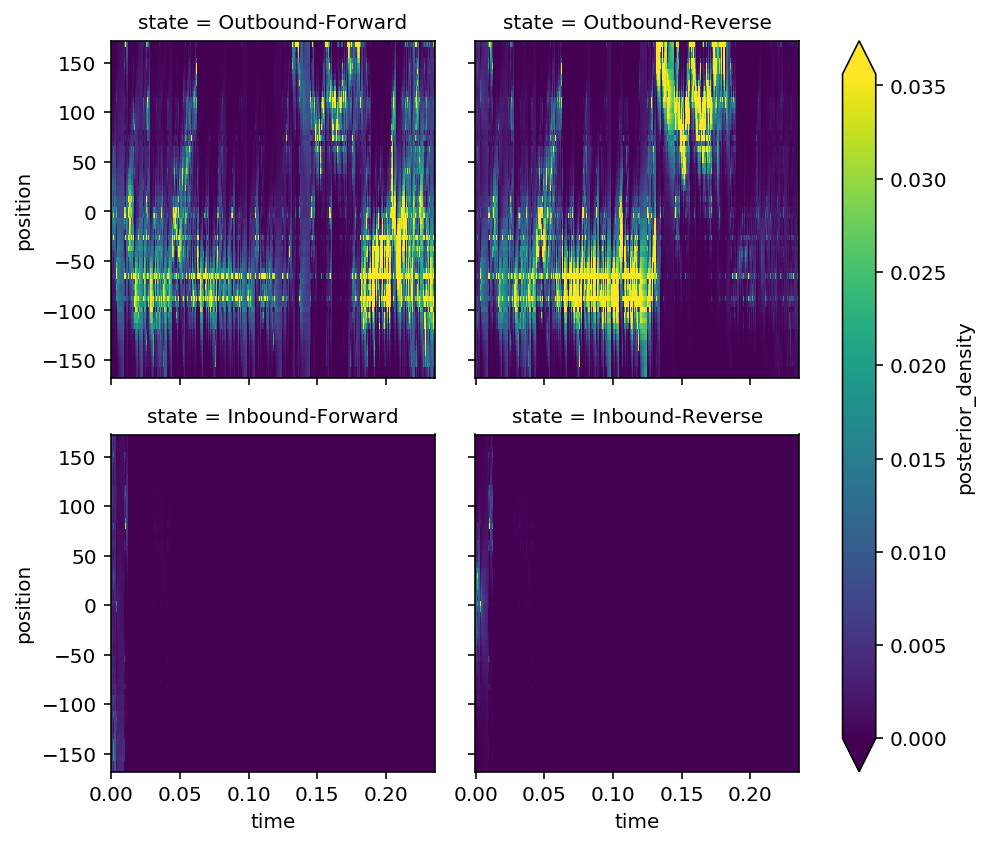

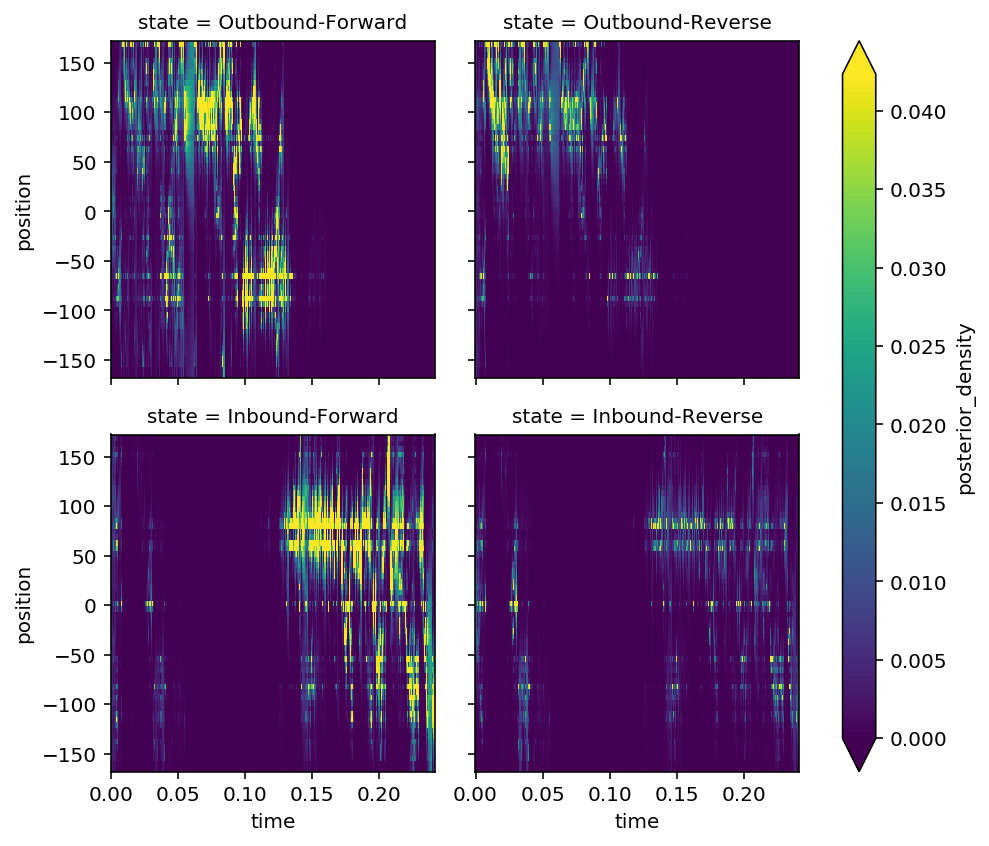

In [36]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=30, covariance_type='spherical')

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:04<00:00,  3.96it/s]


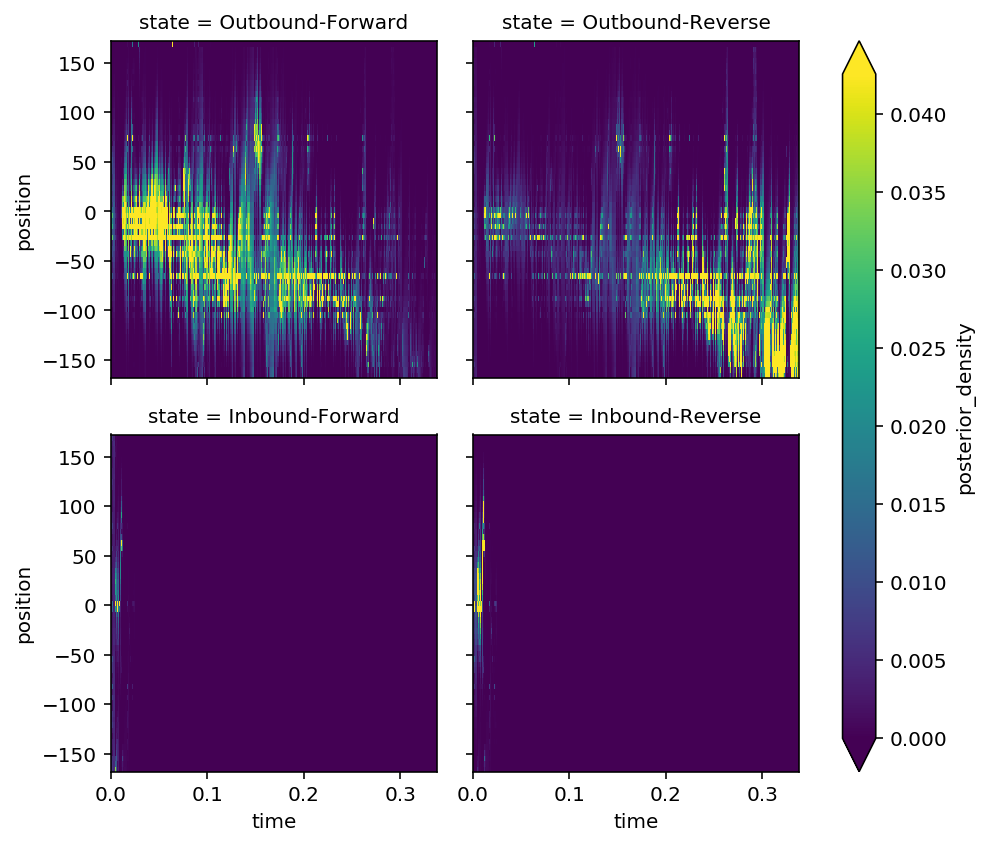

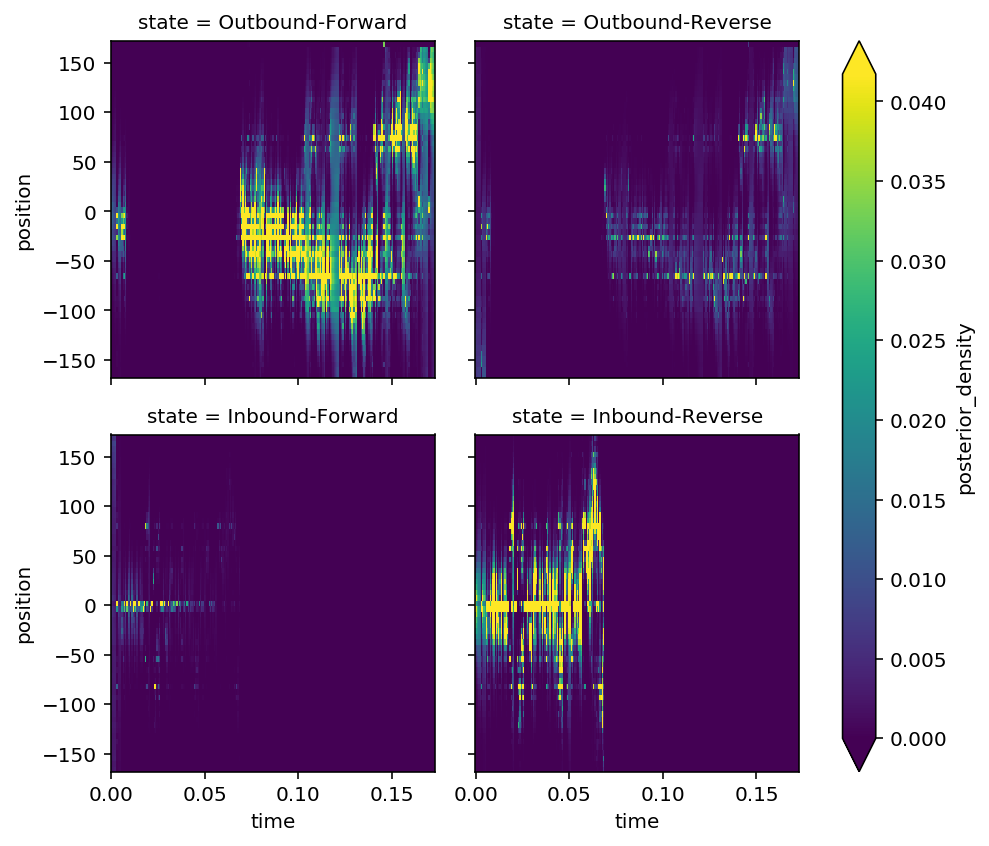

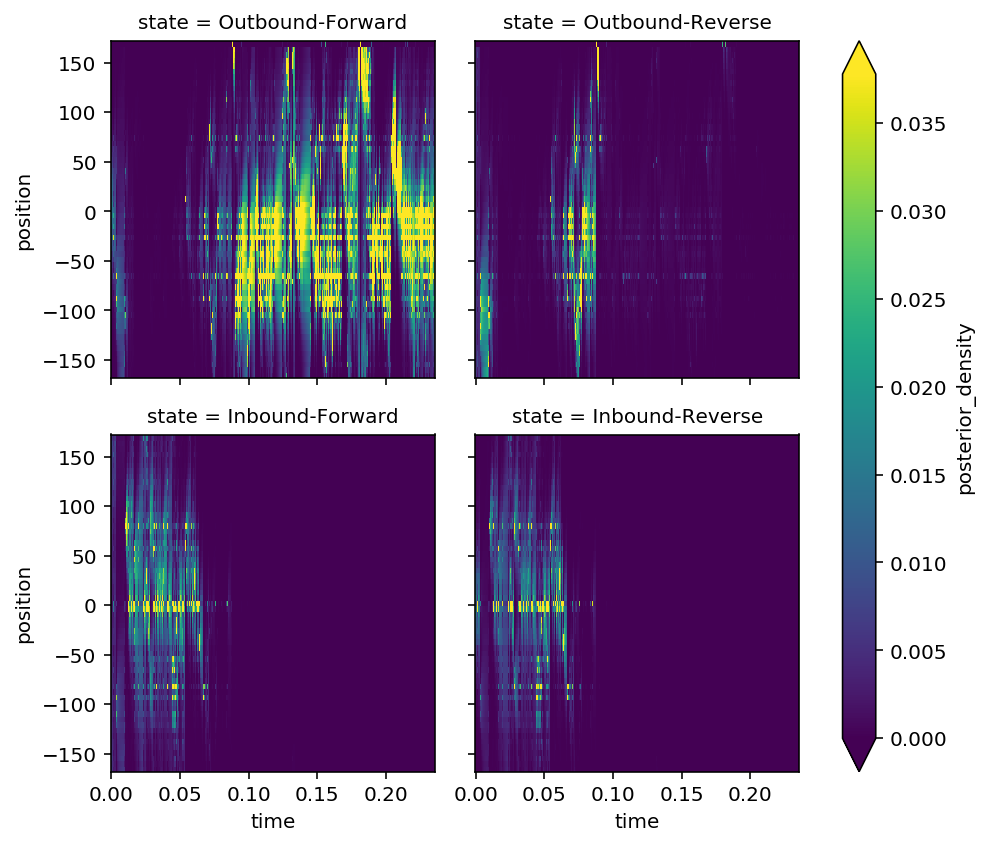

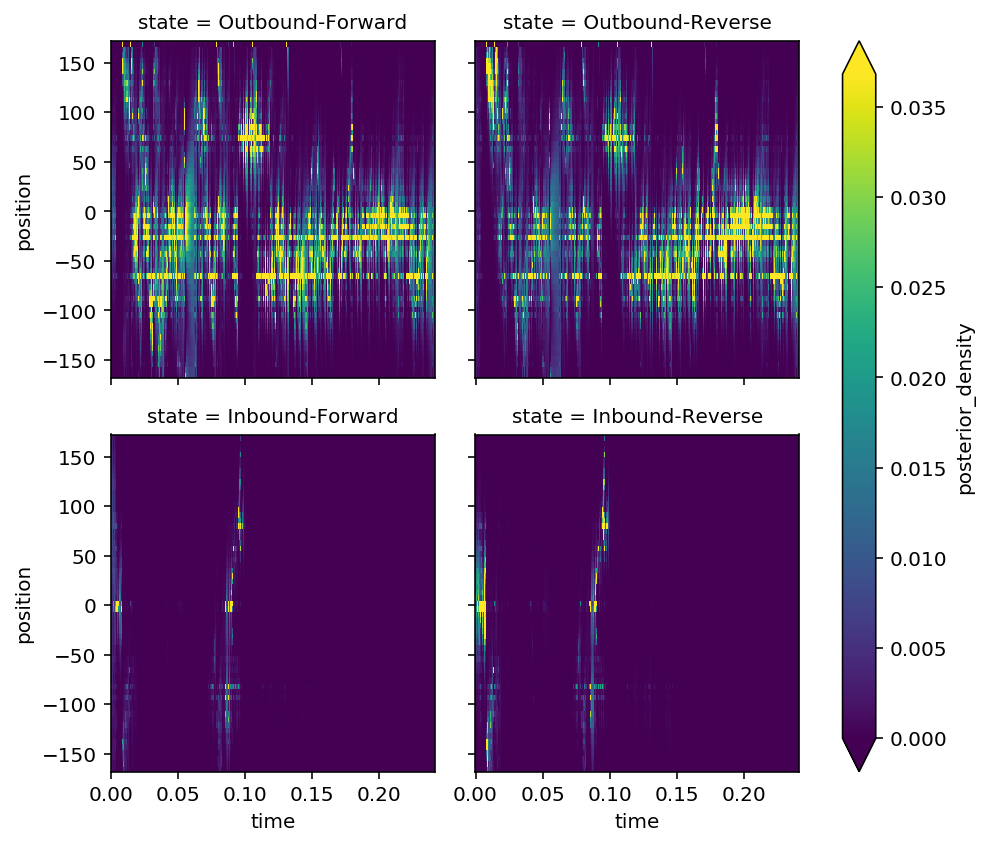

In [37]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture
model_kwargs = dict(n_components=45)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:16<00:00,  1.08it/s]


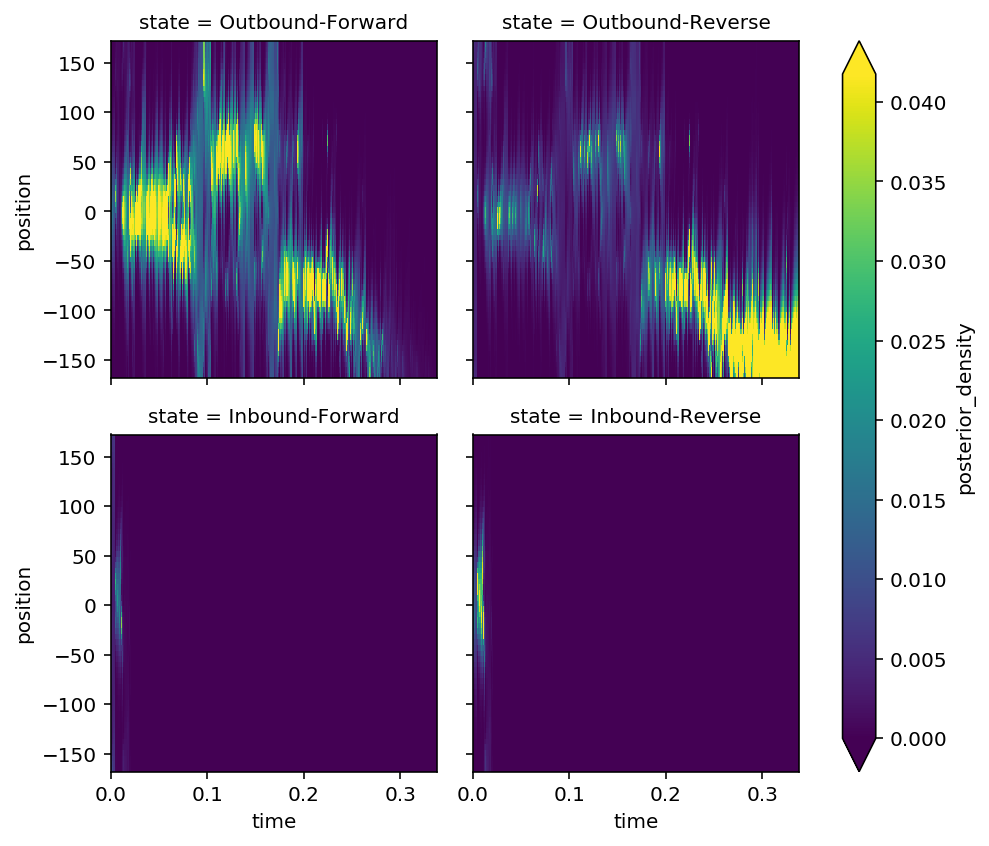

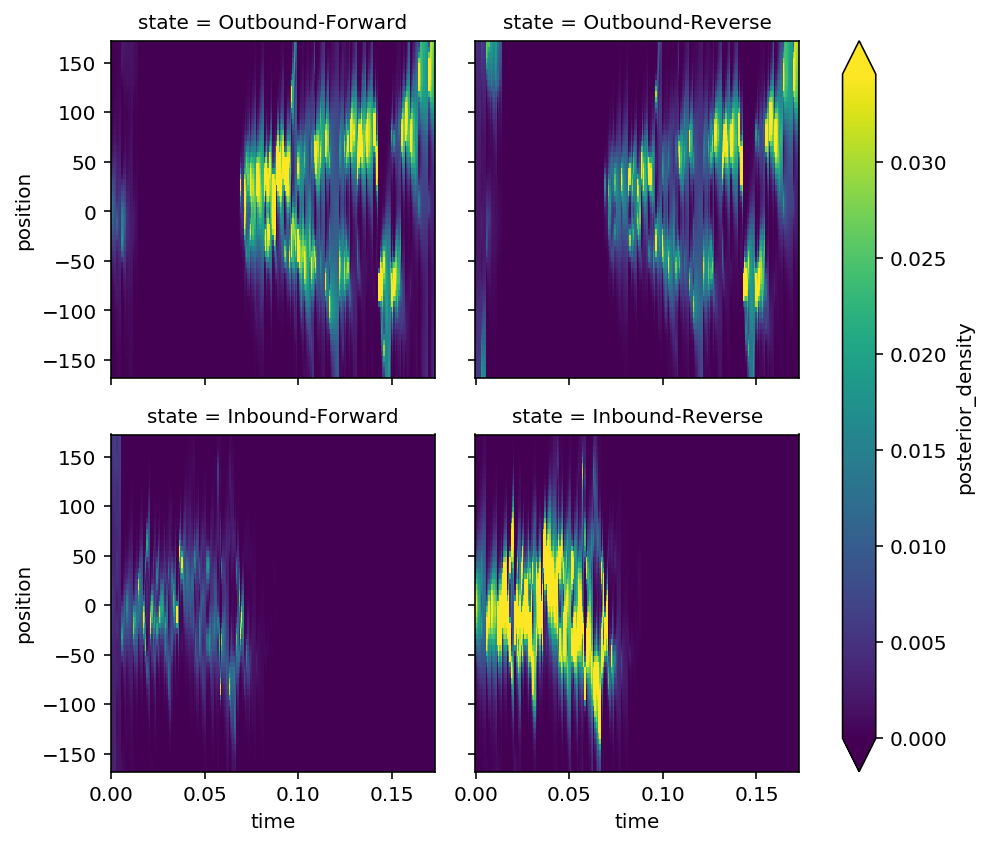

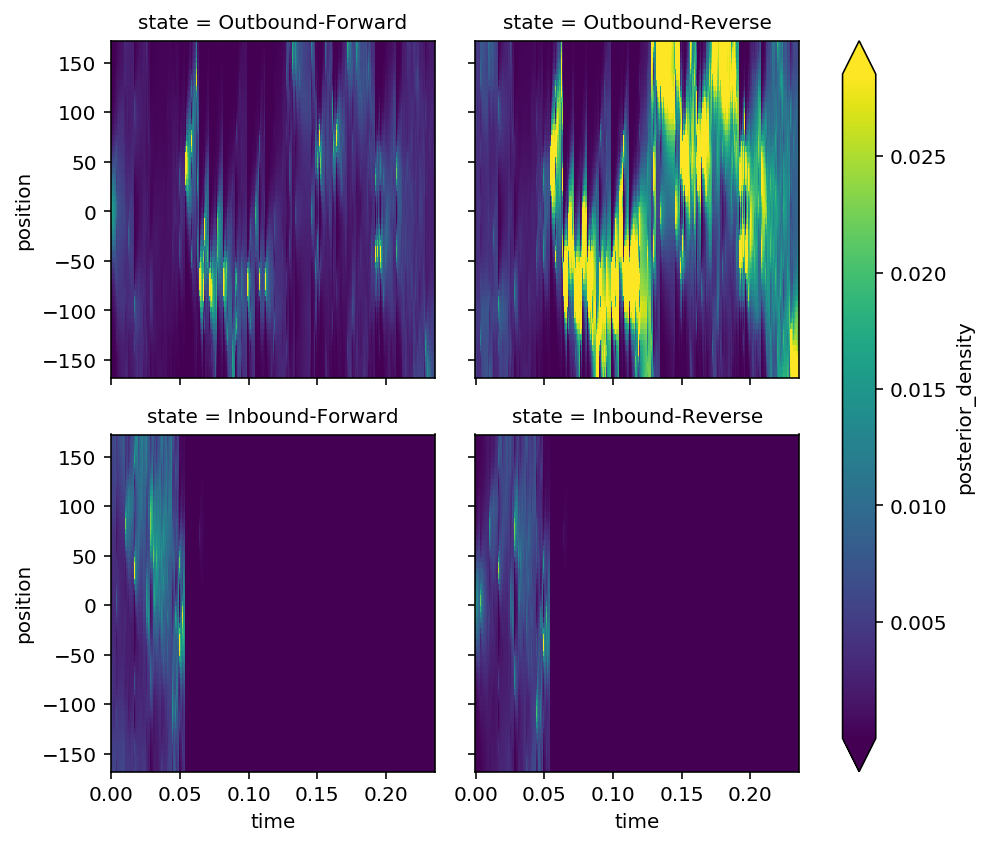

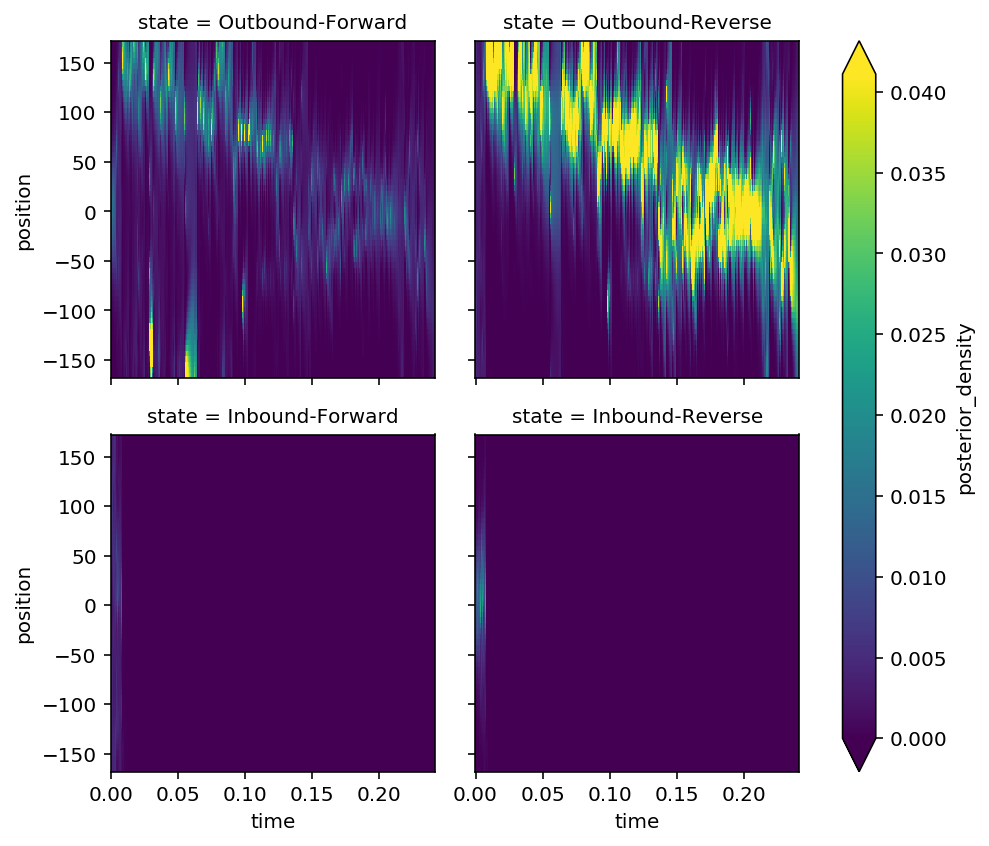

In [38]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=10, rtol=1E-1)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


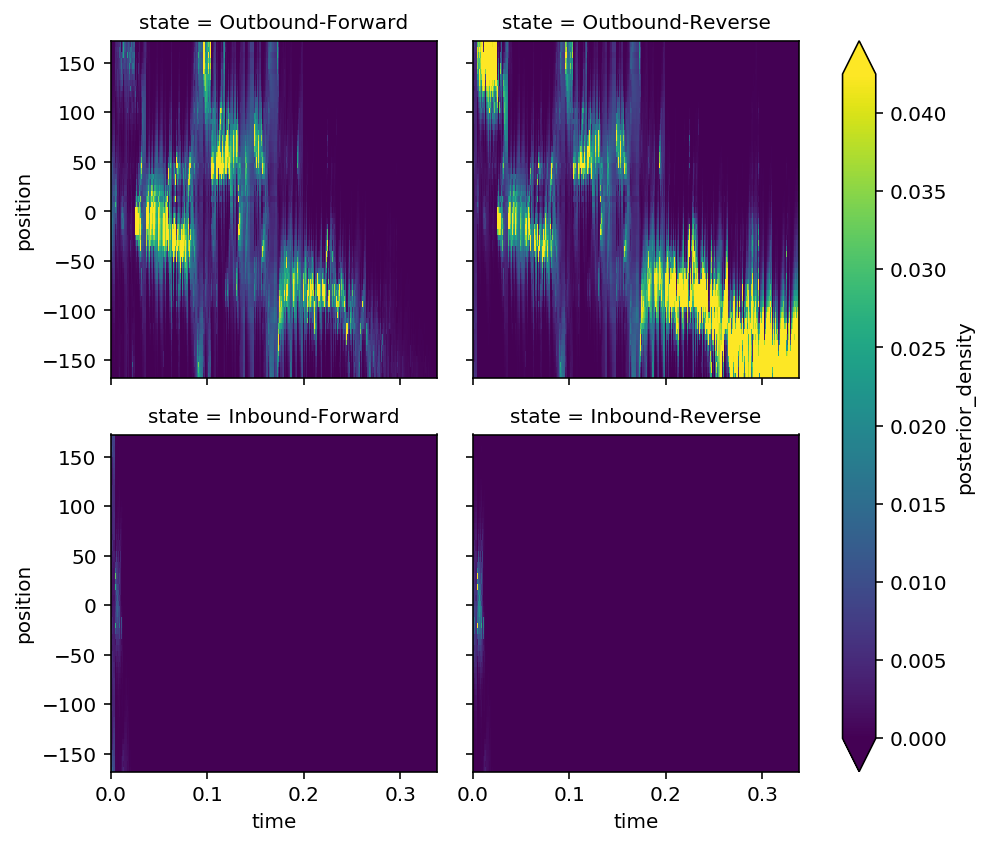

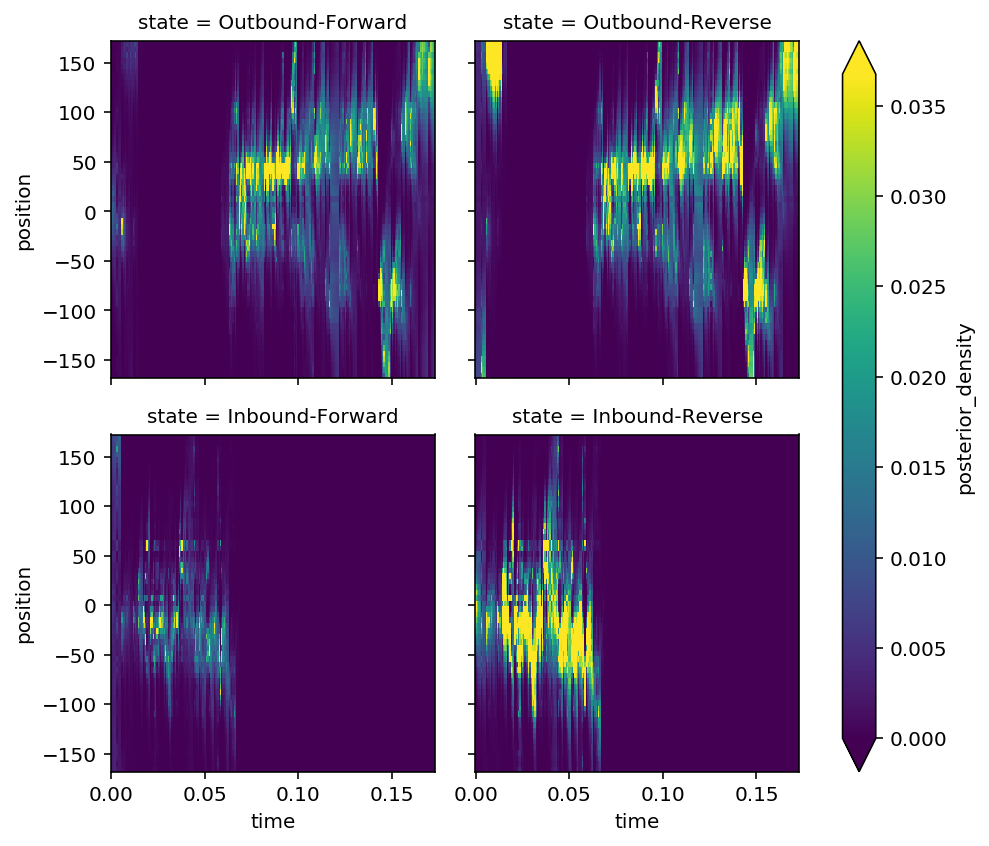

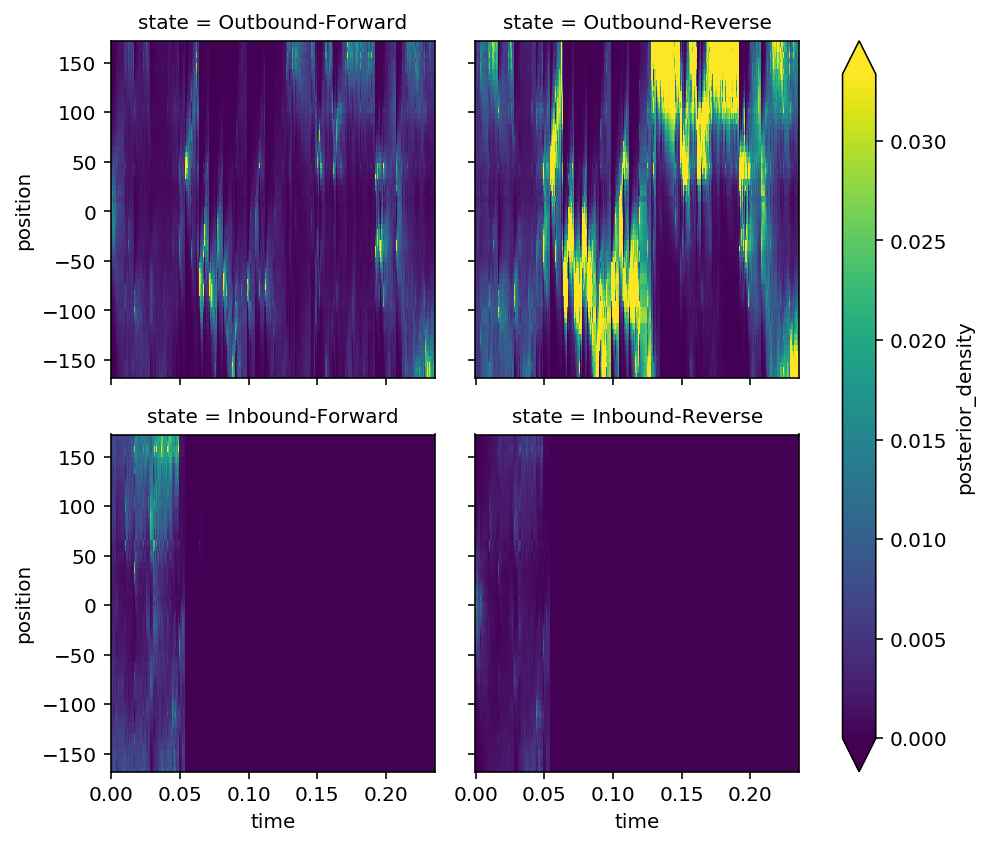

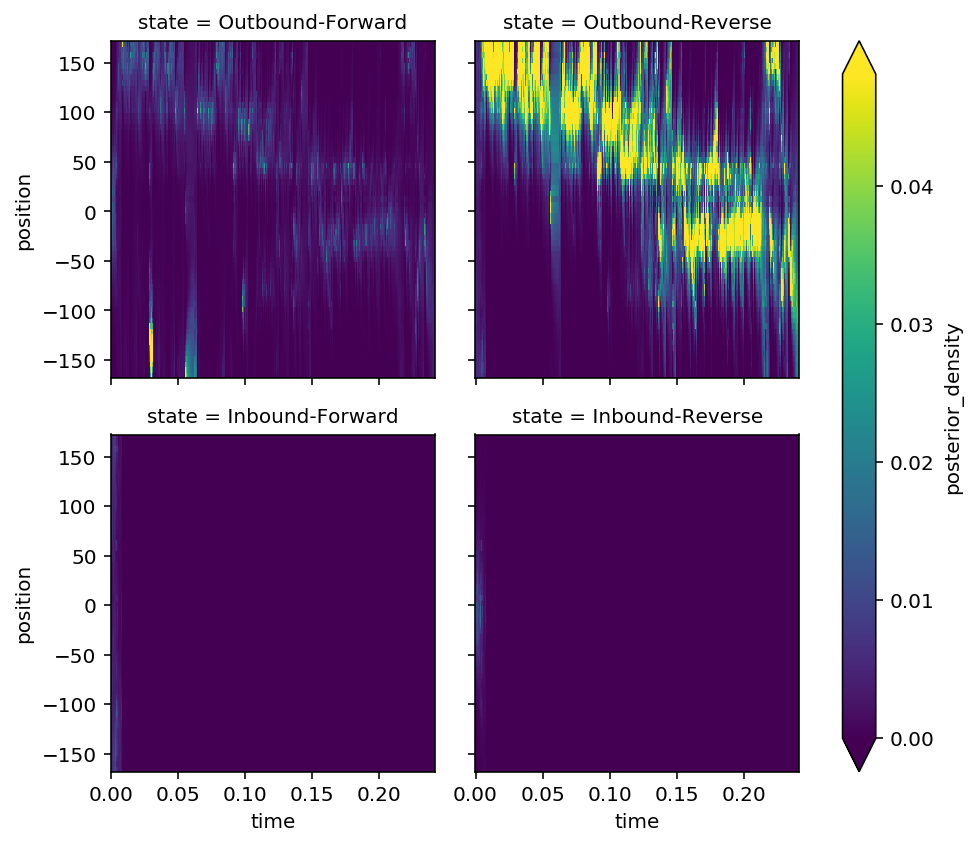

In [39]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=10, rtol=1E1)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:09<00:00,  1.97it/s]


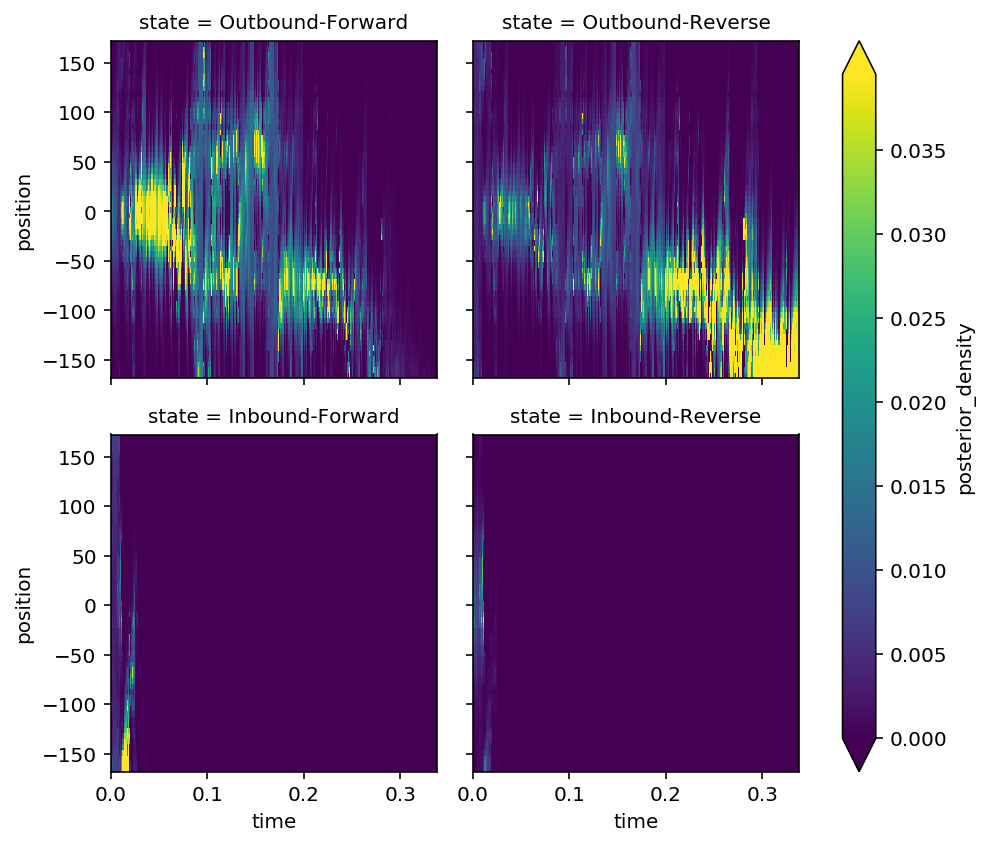

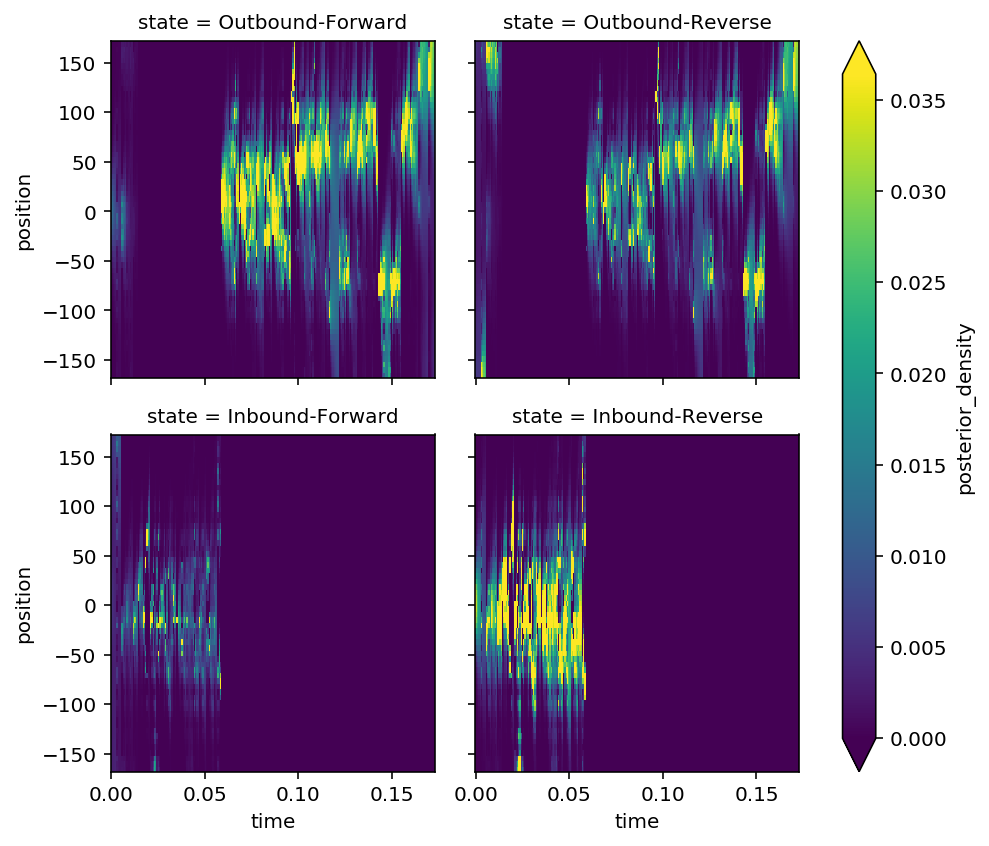

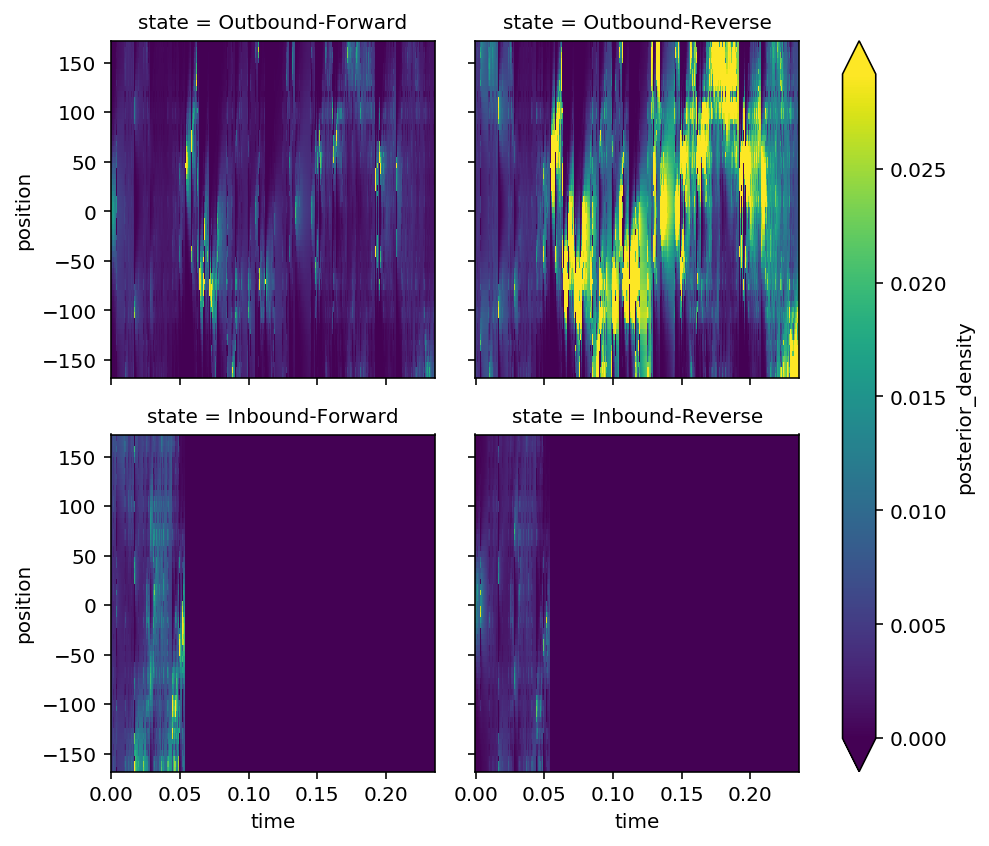

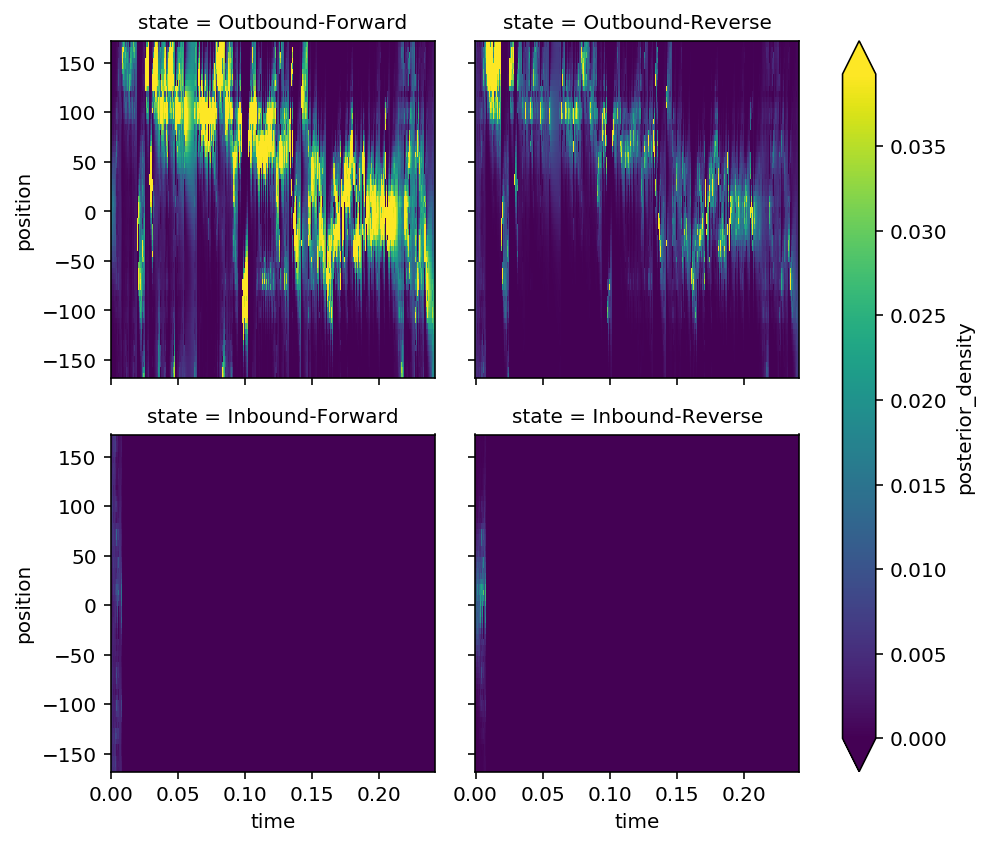

In [40]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=20, kernel='tophat', rtol=1E-1)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:23<00:00,  1.28s/it]


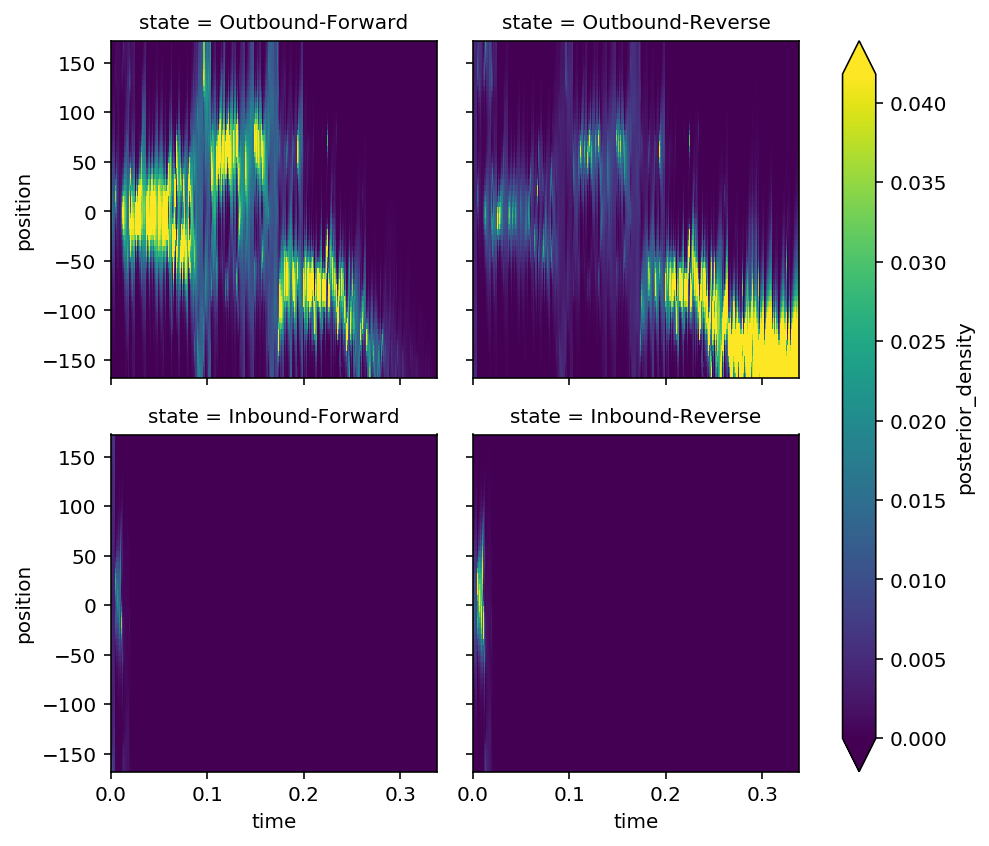

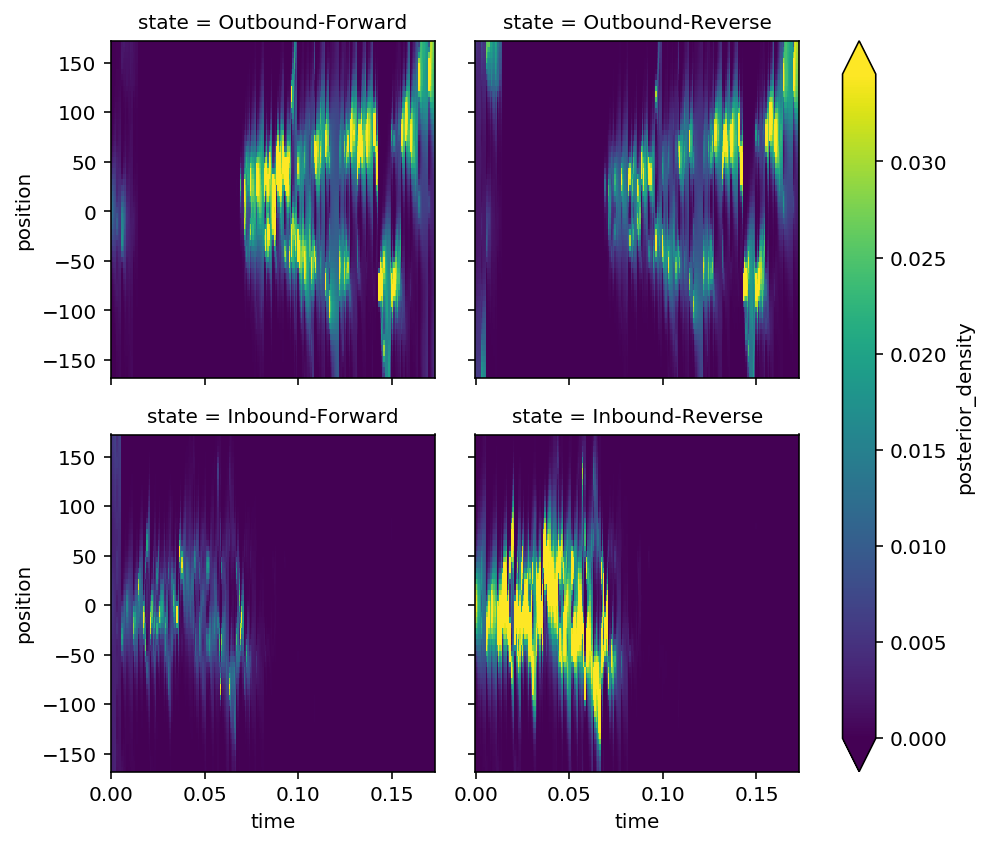

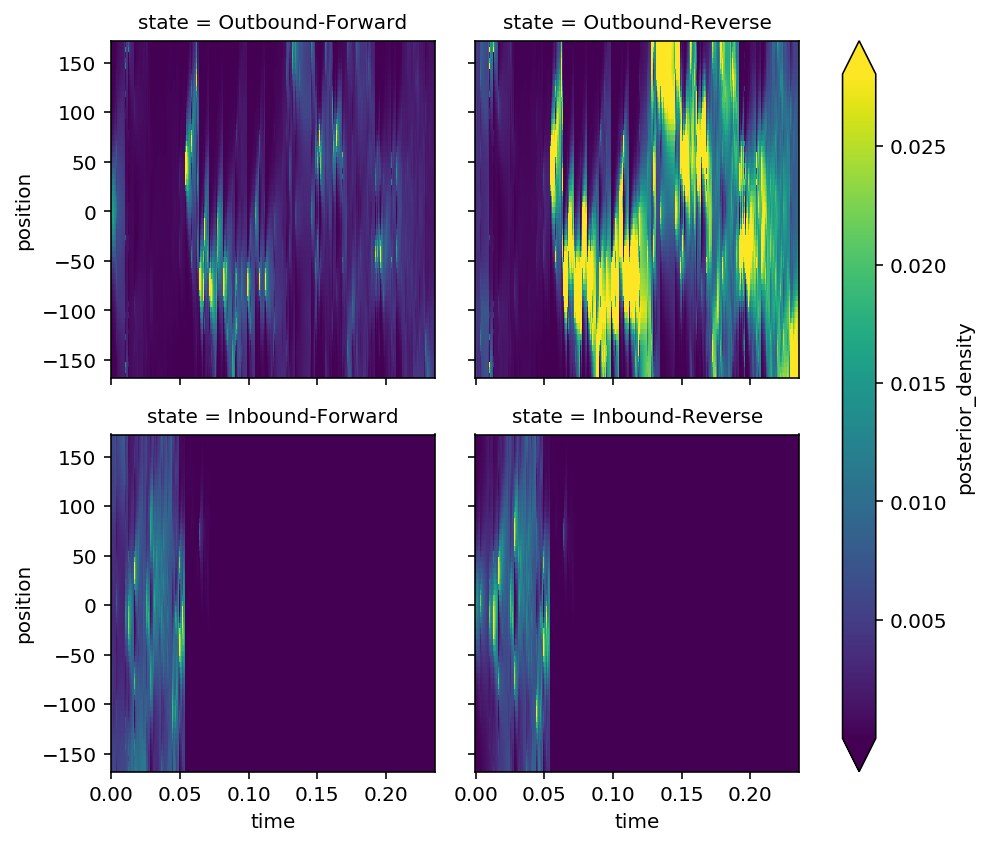

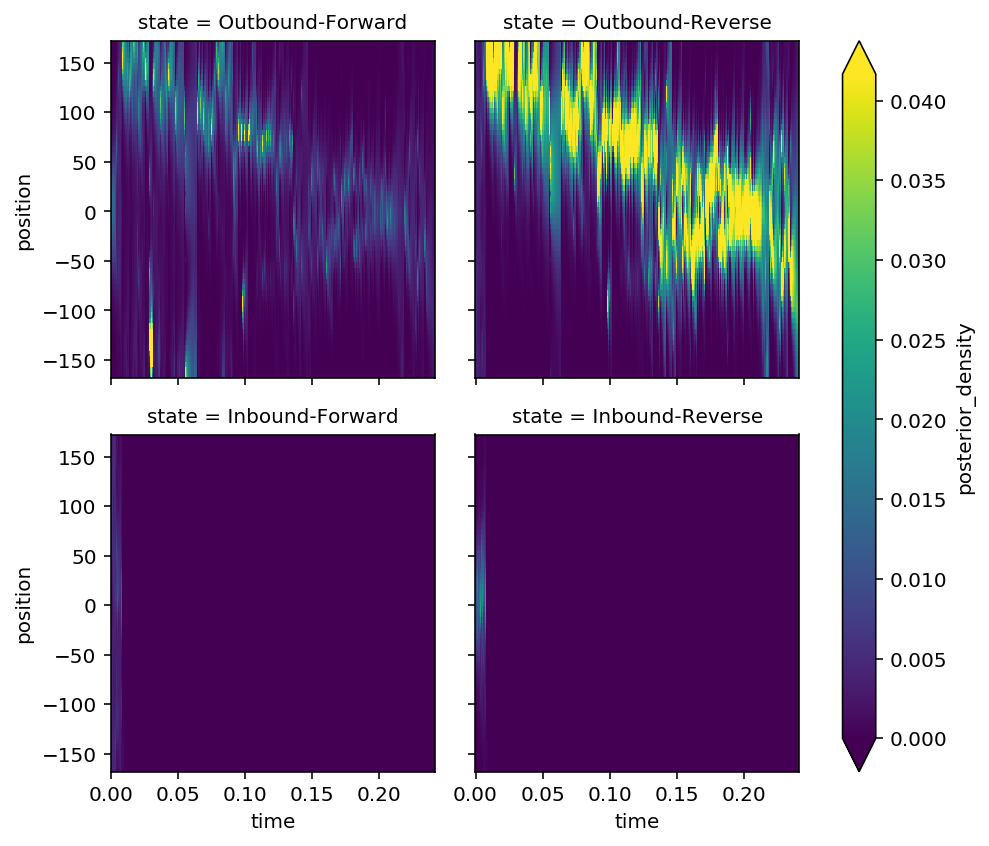

In [42]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=10, atol=1E-15)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


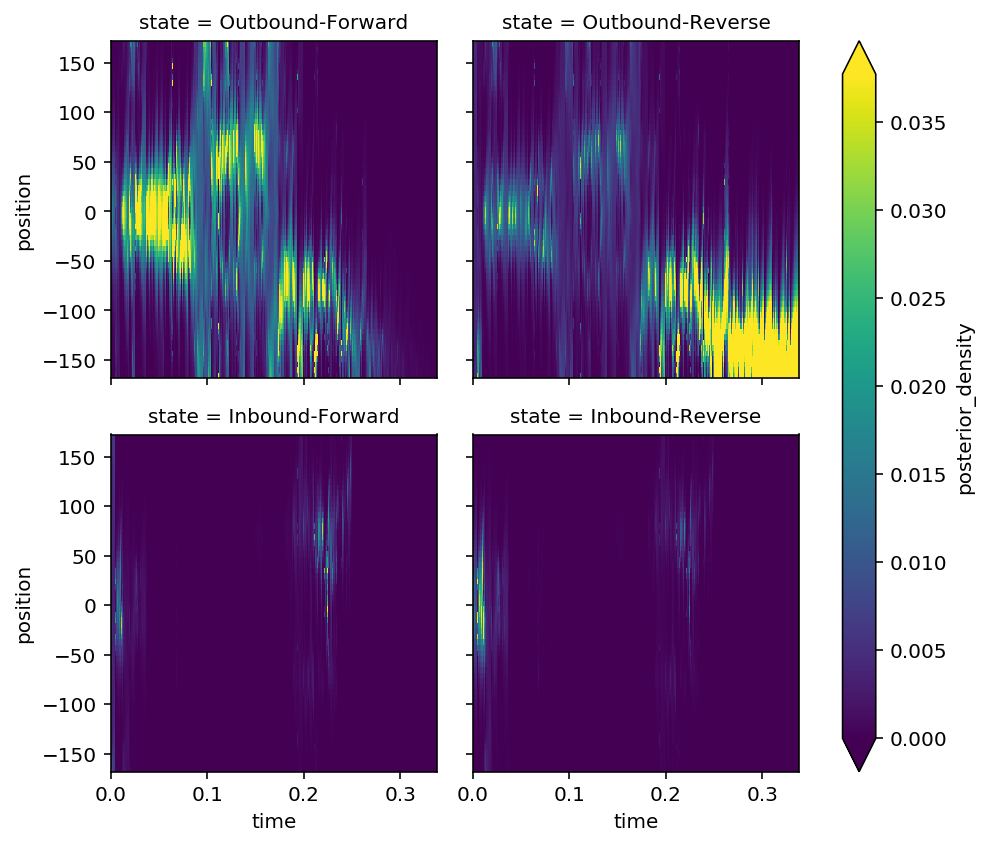

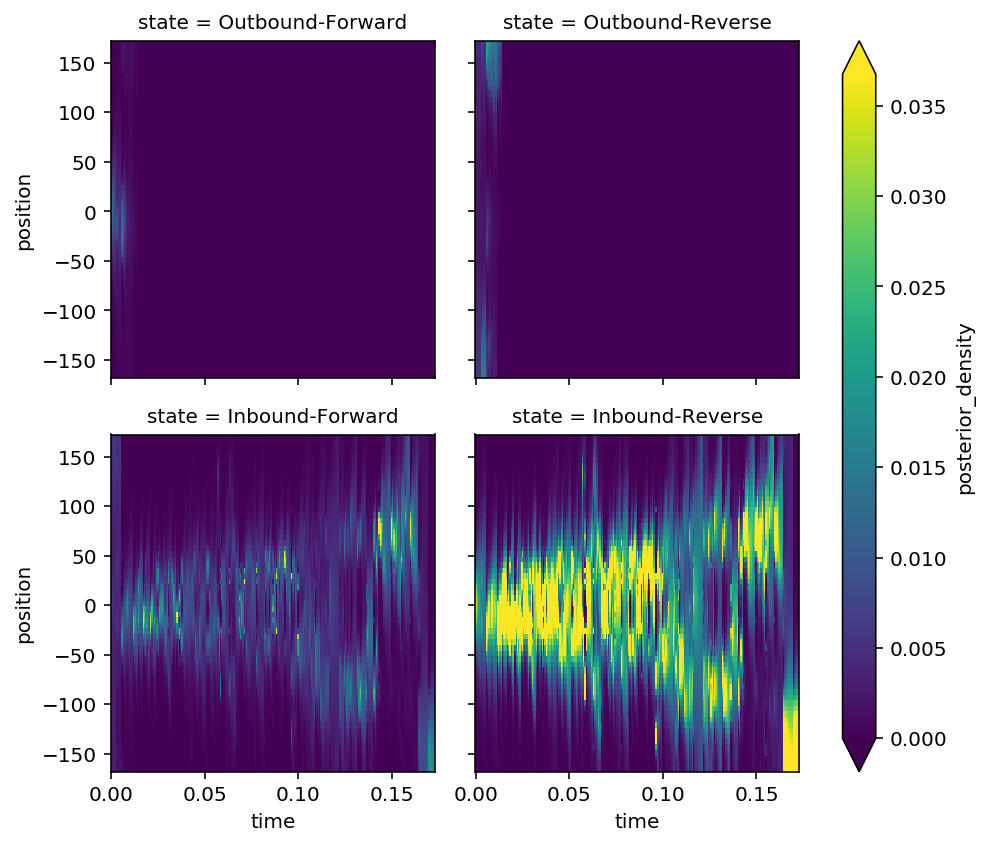

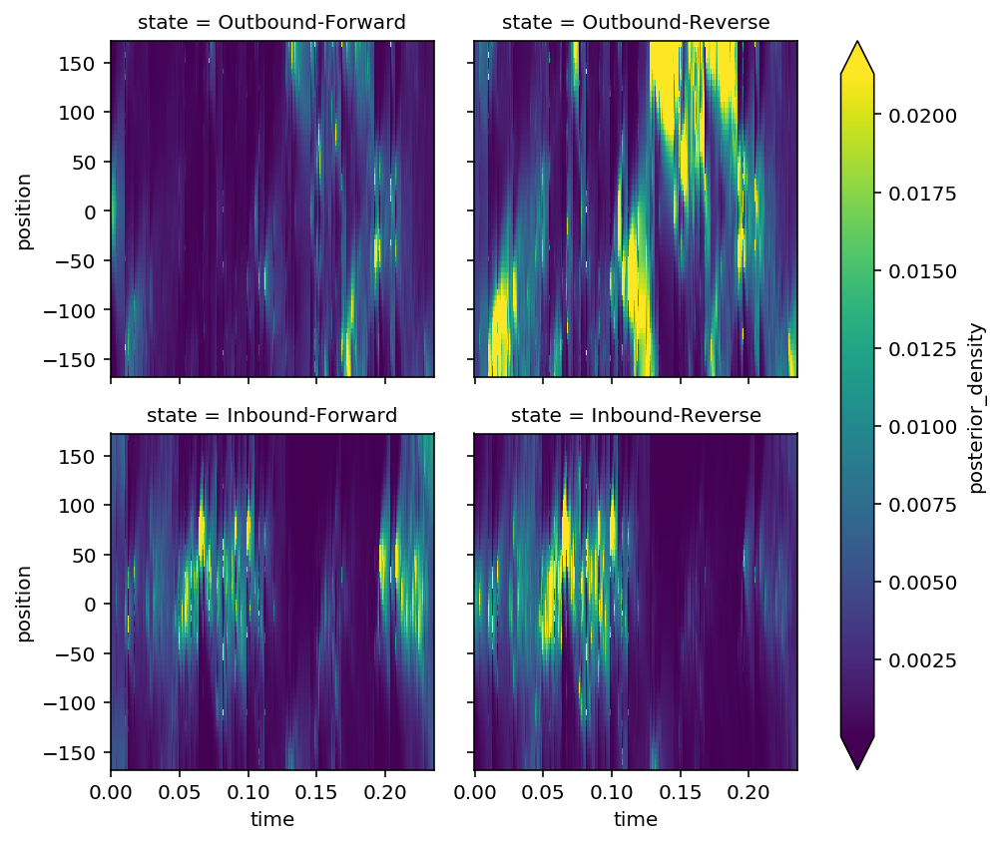

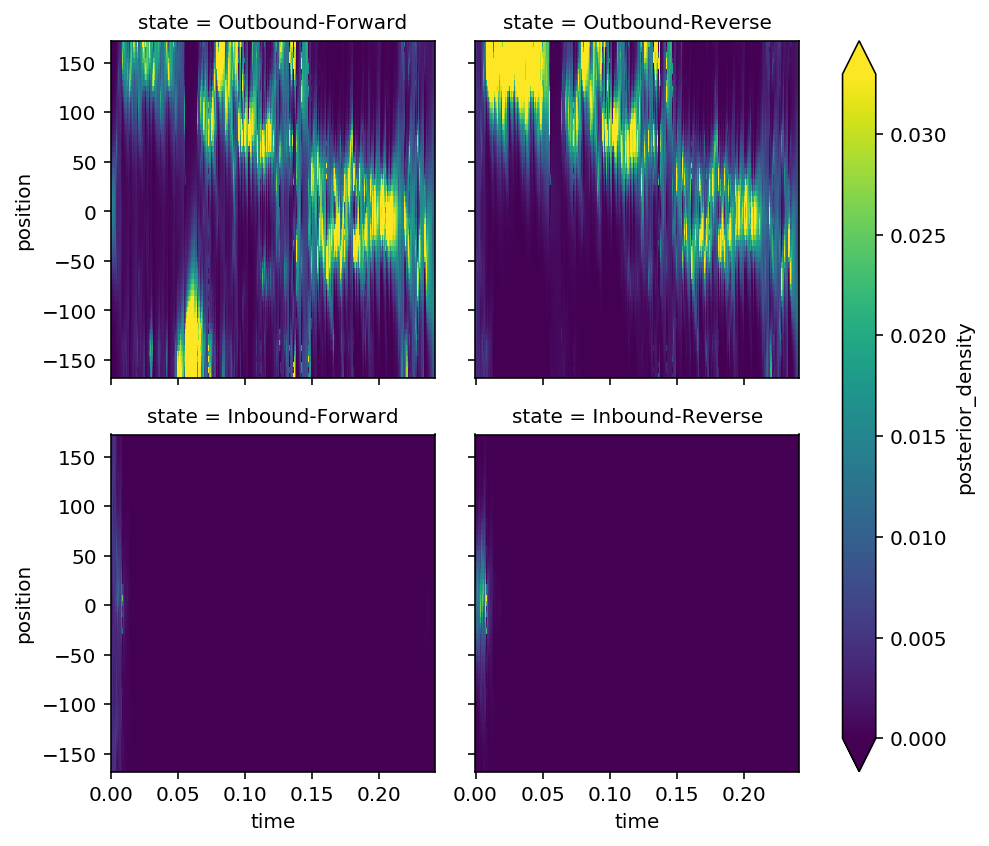

In [48]:
from sklearn.neighbors import KernelDensity

model = KernelDensity
model_kwargs = dict(bandwidth=10, atol=1E-11, rtol=1E-1)

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

In [67]:
from sklearn.base import BaseEstimator
from functools import partial

import numpy as np
from numba import jit

@jit(nogil=True, nopython=True, cache=True)
def _normal_pdf(x, mean=0, std_deviation=1):
    '''Evaluate the normal probability density function at specified points.
    Unlike the `scipy.stats.norm.pdf`, this function is not general and does
    not do any sanity checking of the inputs. As a result it is a much faster
    function, but you should be sure of your inputs before using.
    This function only computes the one-dimensional pdf.
    Parameters
    ----------
    x : array_like
        The normal probability function will be evaluated
    mean : float or array_like, optional
    std_deviation : float or array_like
    Returns
    -------
    probability_density
        The normal probability density function evaluated at `x`
    '''
    return np.exp(-0.5 * ((x - mean) / std_deviation) ** 2) / (np.sqrt(2.0 * np.pi) * std_deviation)


class IsotropicKernelDensity(BaseEstimator):
    def __init__(self, bandwidth):
        self.bandwidth = np.array(bandwidth)

    def fit(self, X, y=None):
        """Fit the Kernel Density model on the data.
        
        Parameters
        ----------
        X : array_like, shape (n_samples, n_features)
            List of n_features-dimensional data points.  Each row
            corresponds to a single data point.
        """
        self.training_data = X
        
        return self
    
    def score_samples(self, X):
        """Evaluate the density model on the data.
        
        Parameters
        ----------
        X : array_like, shape (n_samples, n_features)
            An array of points to query.  Last dimension should match dimension
            of training data (n_features).

        Returns
        -------
        density : ndarray, shape (n_samples,)
            The array of log(density) evaluations.
        """
        bandwidth = self.bandwidth[-X.shape[1]:]
        return np.log(np.mean(np.prod(_normal_pdf(
            X[:, np.newaxis, :], mean=self.training_data[np.newaxis, ...],
            std_deviation=bandwidth), axis=2), axis=1))

    def score(self, X, y=None):
        """Compute the total log probability under the model.
        
        Parameters
        ----------
        X : array_like, shape (n_samples, n_features)
            List of n_features-dimensional data points.  Each row
            corresponds to a single data point.

        Returns
        -------
        logprob : float
            Total log-likelihood of the data in X.
        """
        return np.sum(self.score_samples(X))
    
    def sample(self, n_samples=1, random_state=None):
        """Generate random samples from the model.
        
        Currently, this is implemented only for gaussian and tophat kernels.

        Parameters
        ----------
        n_samples : int, optional
            Number of samples to generate. Defaults to 1.
        random_state : int, RandomState instance or None. default to None
            If int, random_state is the seed used by the random number
            generator; If RandomState instance, random_state is the random
            number generator; If None, the random number generator is the
            RandomState instance used by `np.random`.
            
        Returns
        -------
        X : array_like, shape (n_samples, n_features)
            List of samples.
        """
        raise NotImplementedError()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [01:49<00:00,  6.10s/it]


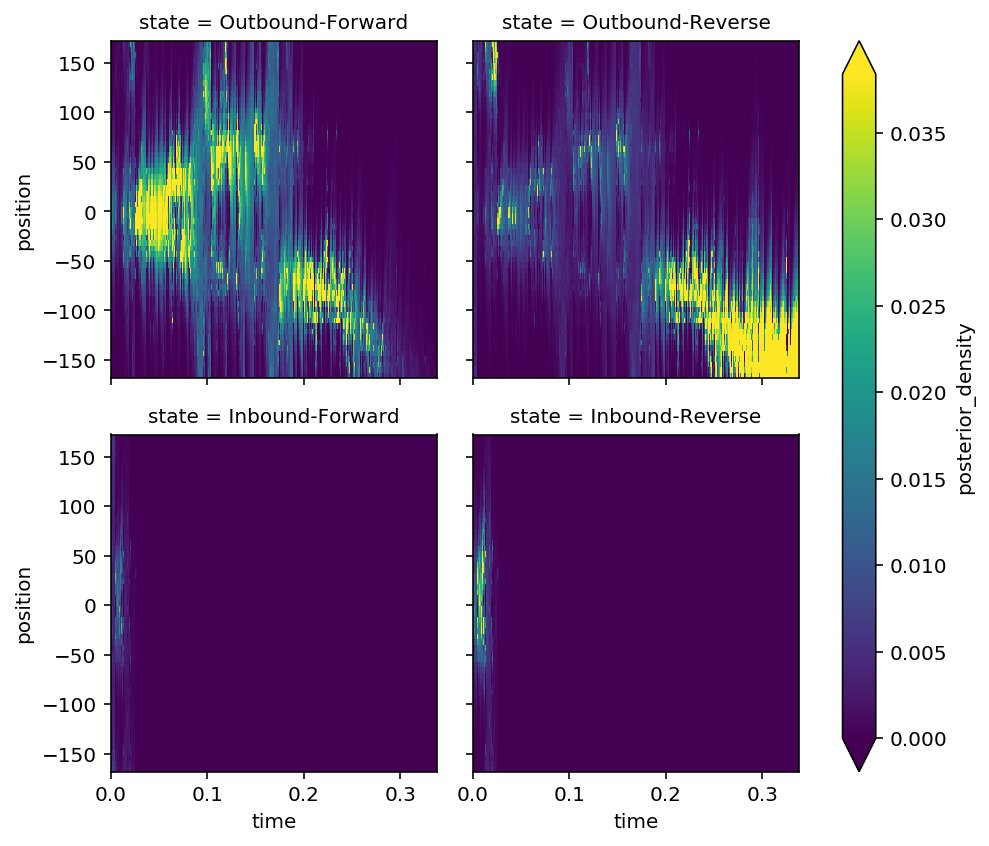

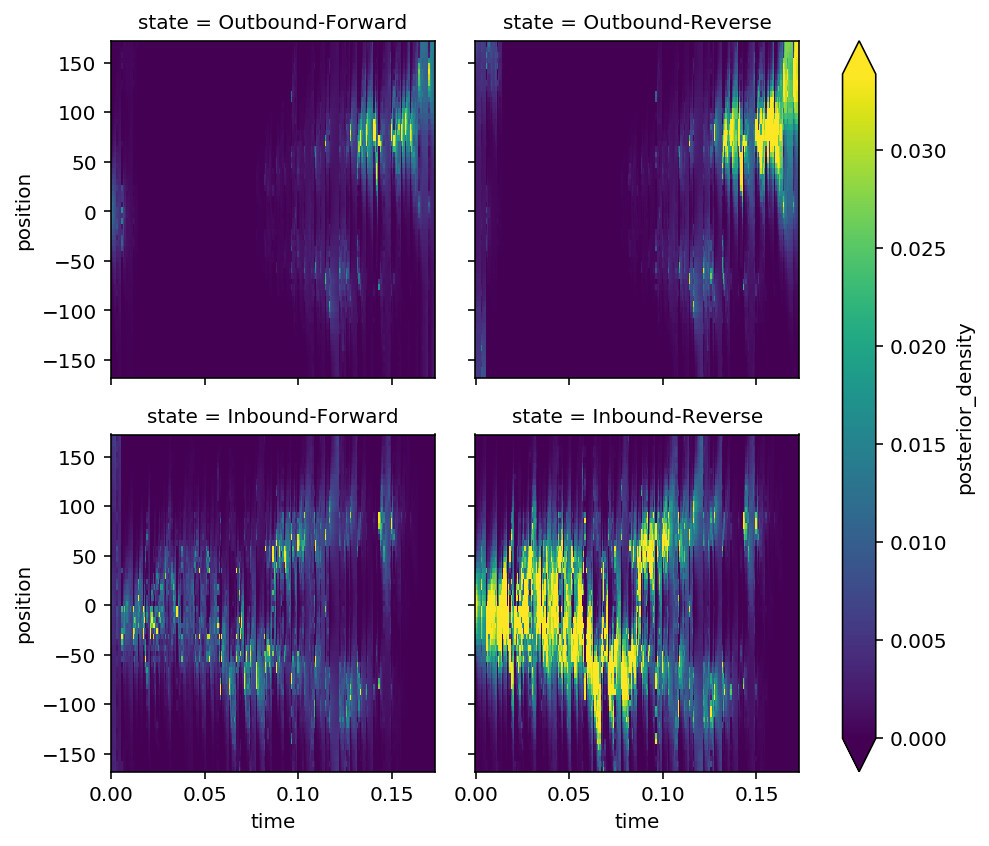

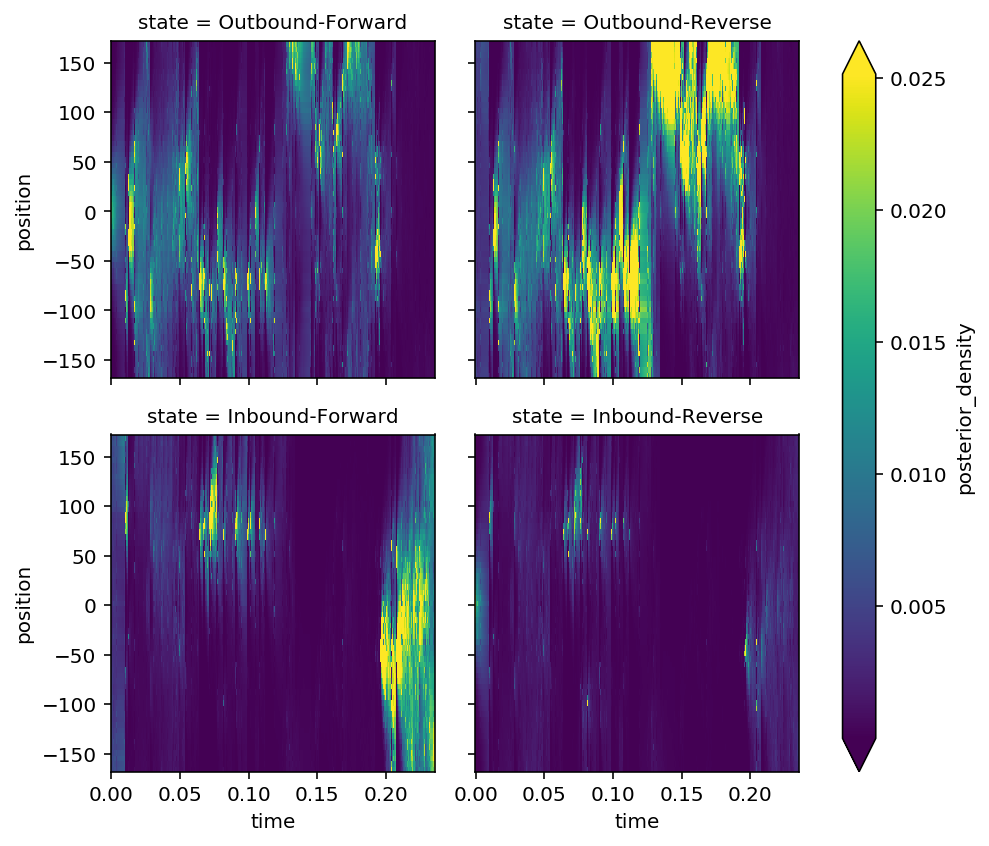

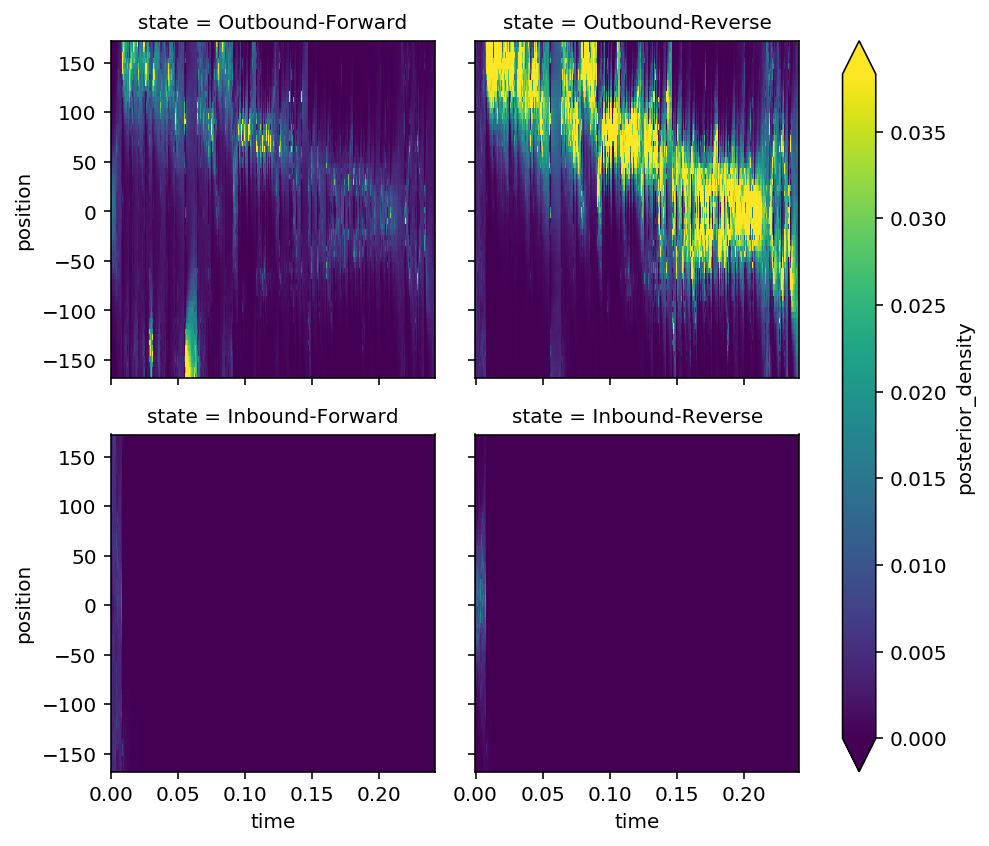

In [63]:
model = IsotropicKernelDensity
model_kwargs = dict(bandwidth=[20, 20, 20, 20, 2.3])

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [01:48<00:00,  6.04s/it]


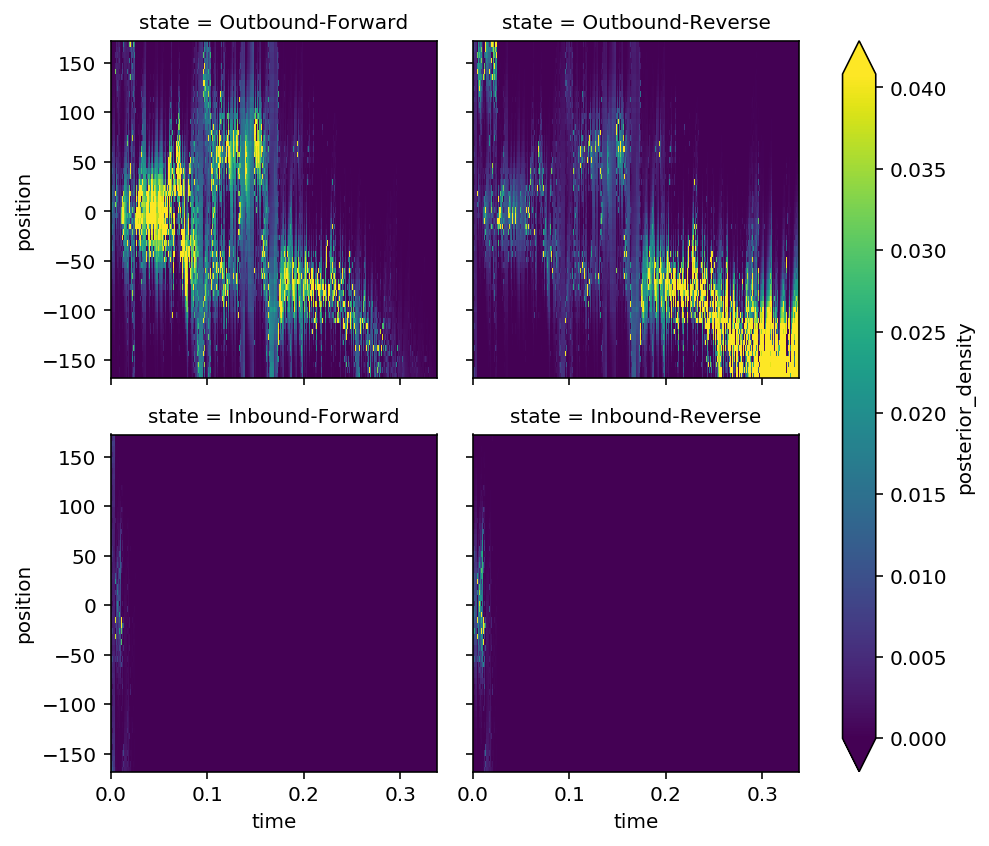

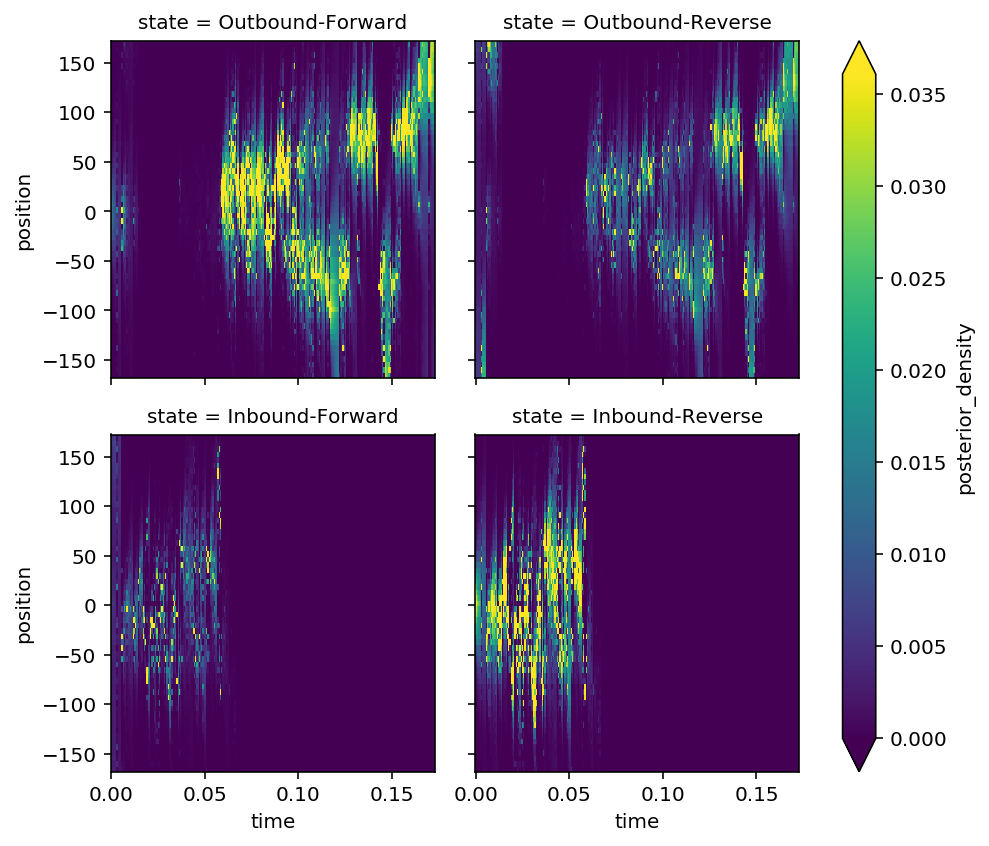

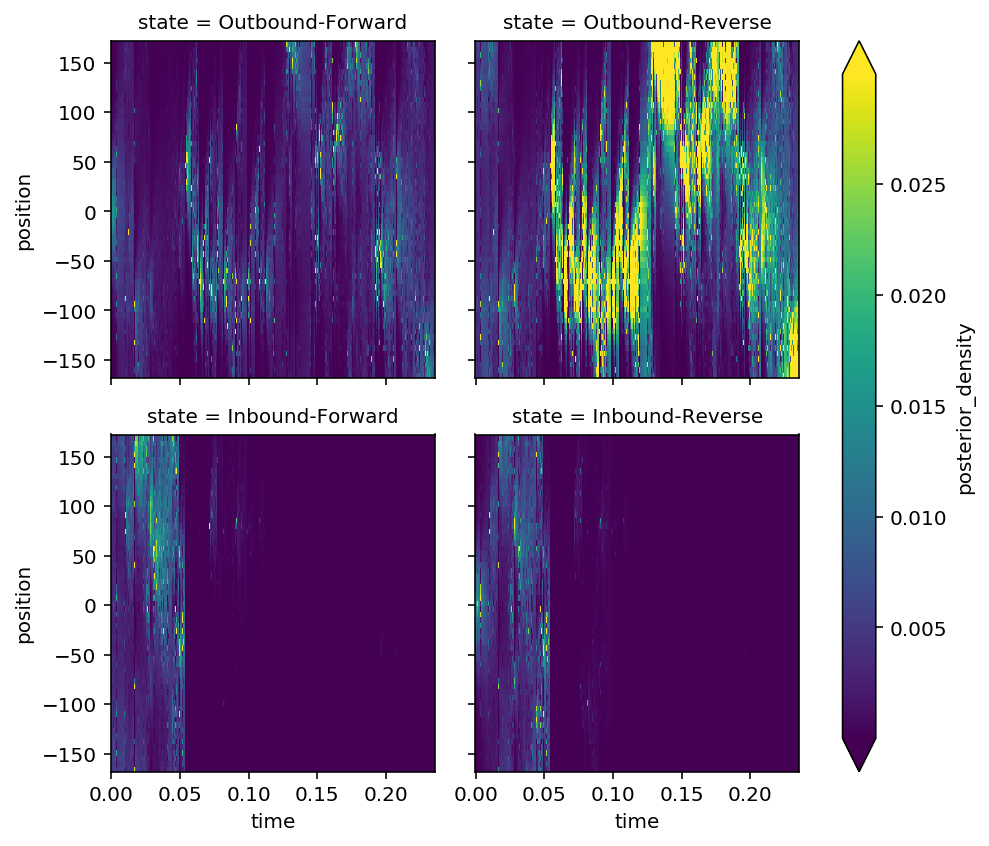

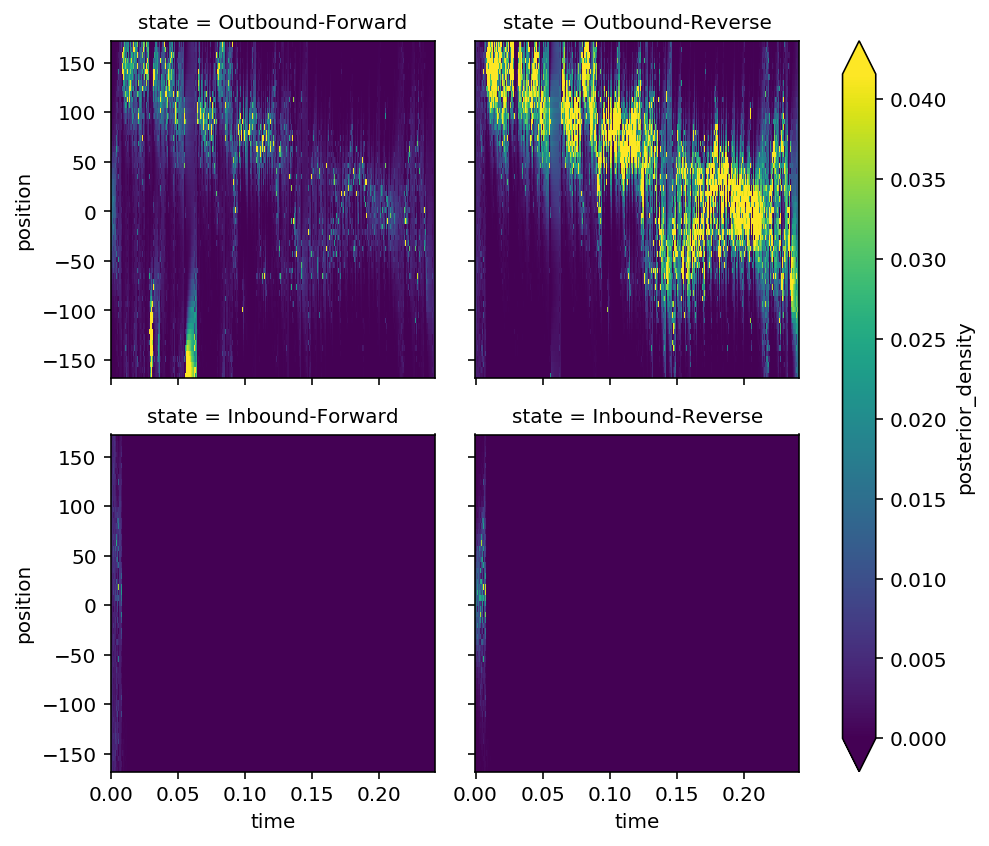

In [64]:
model = IsotropicKernelDensity
model_kwargs = dict(bandwidth=[10, 10, 10, 10, 1.0])

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [01:57<00:00,  6.51s/it]


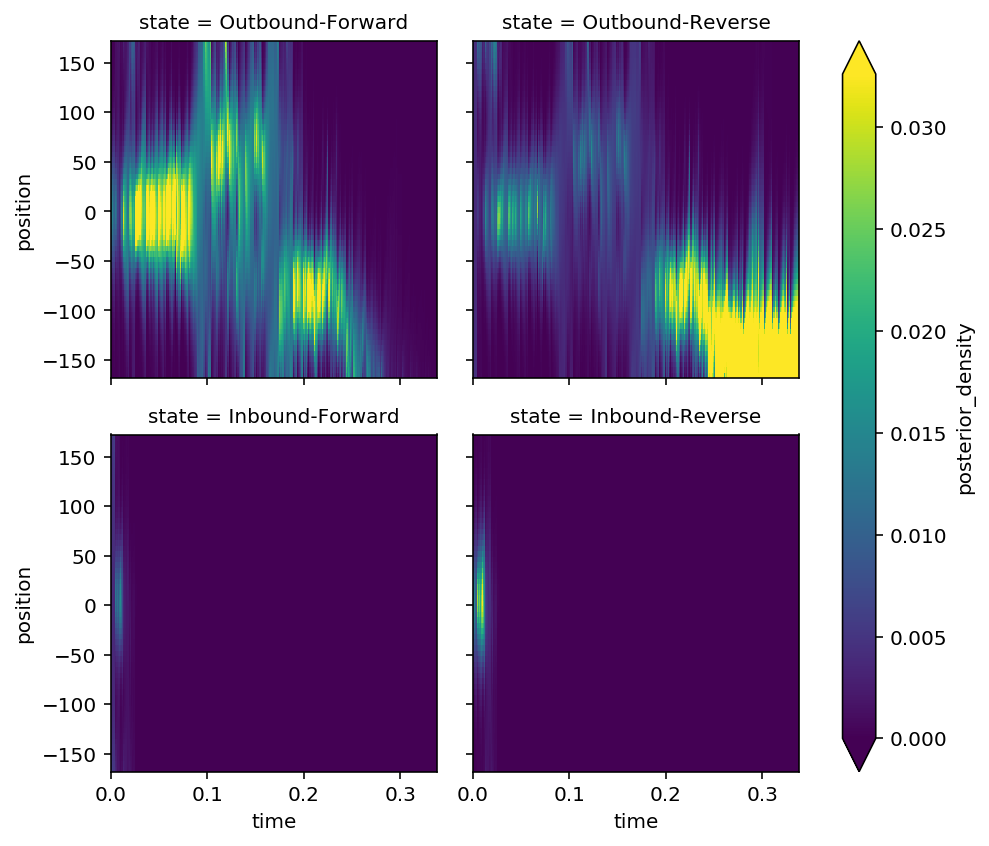

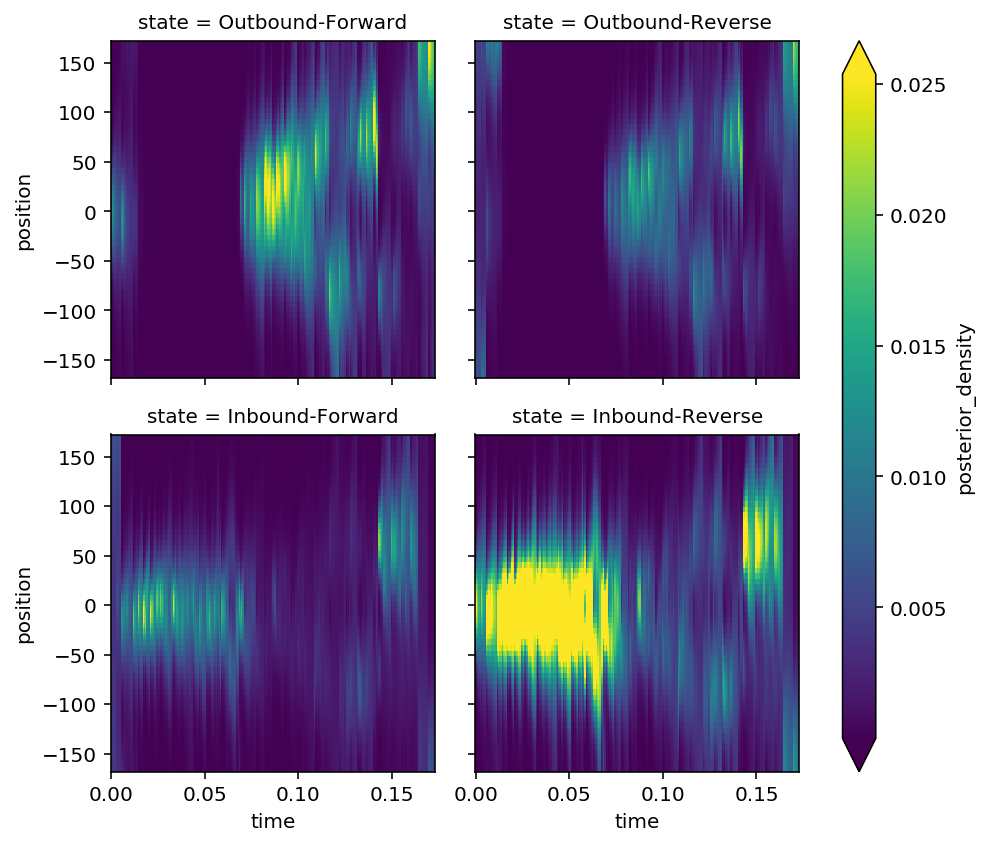

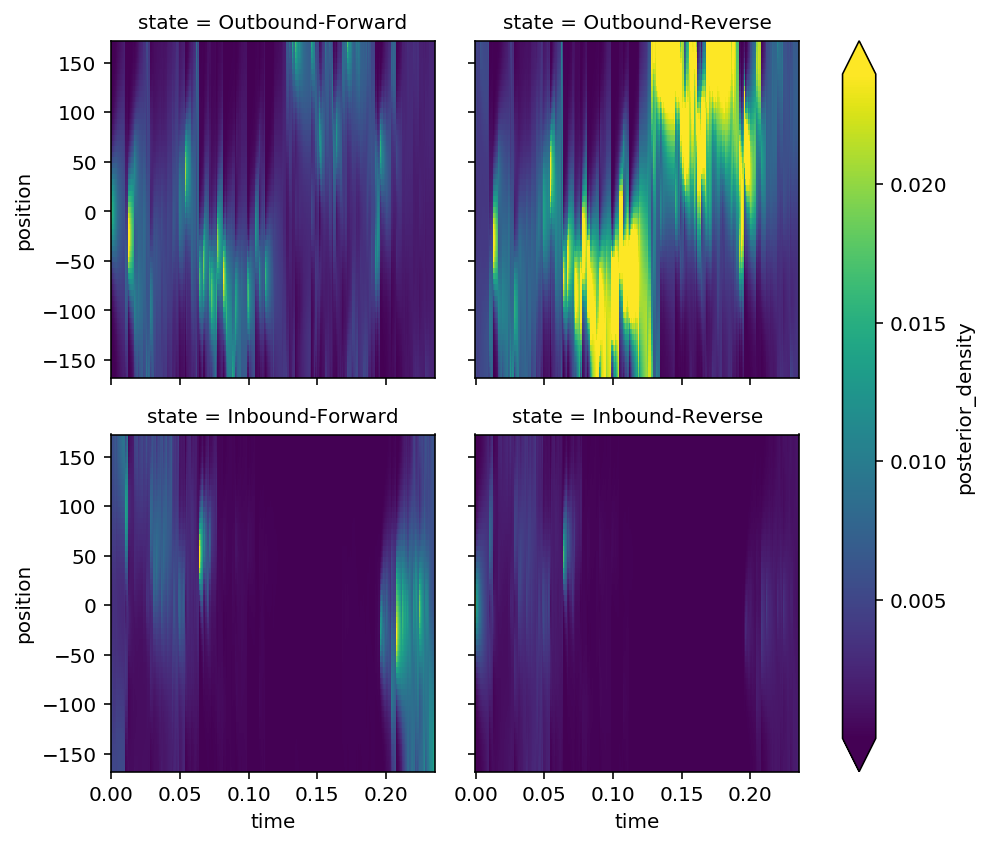

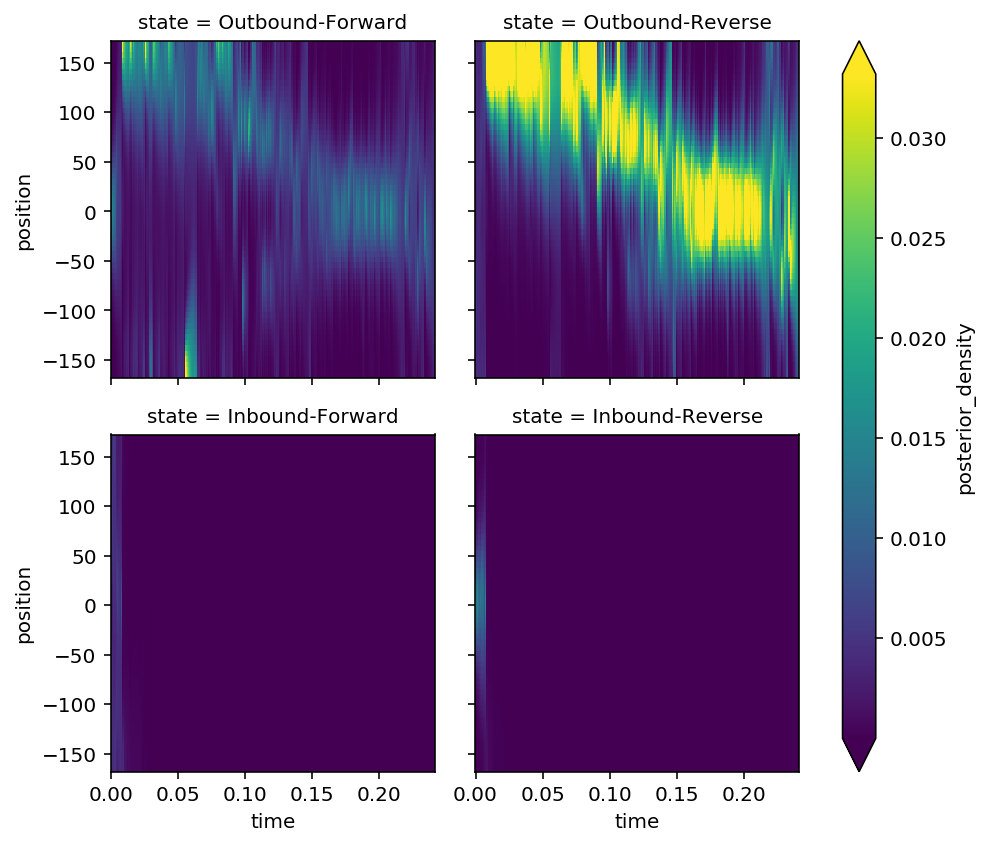

In [65]:
model = IsotropicKernelDensity
model_kwargs = dict(bandwidth=[20, 20, 20, 20, 30])

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
100%|██████████| 18/18 [02:08<00:00,  7.11s/it]


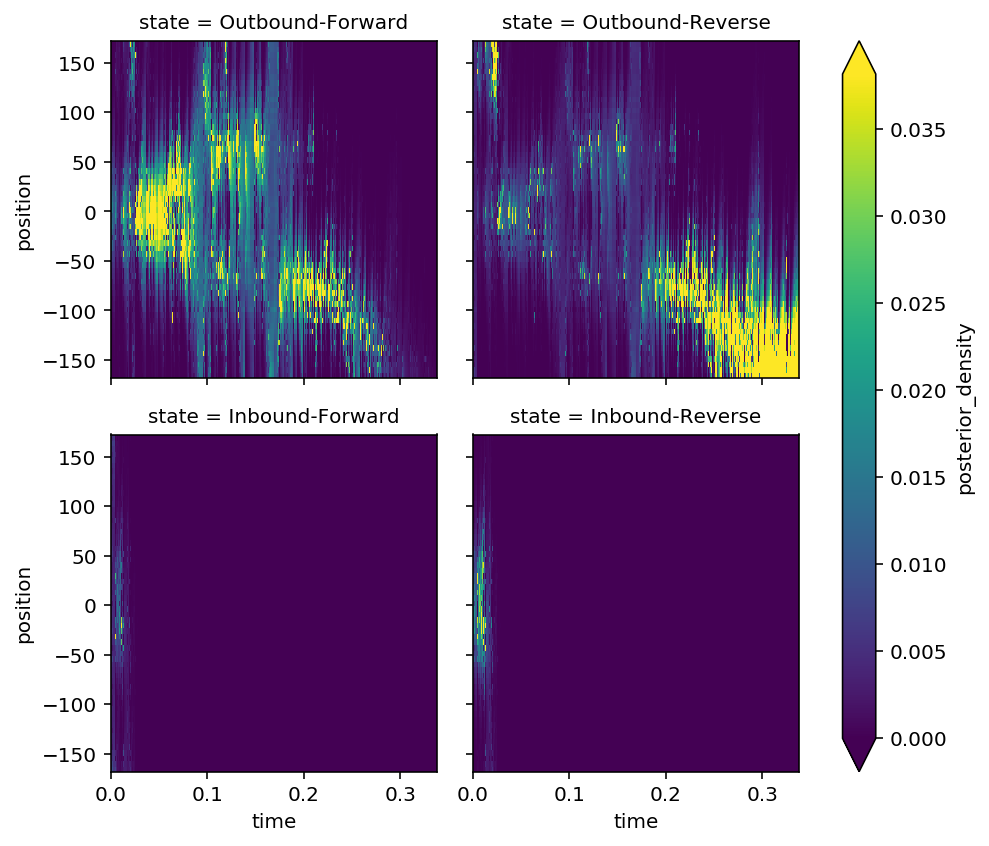

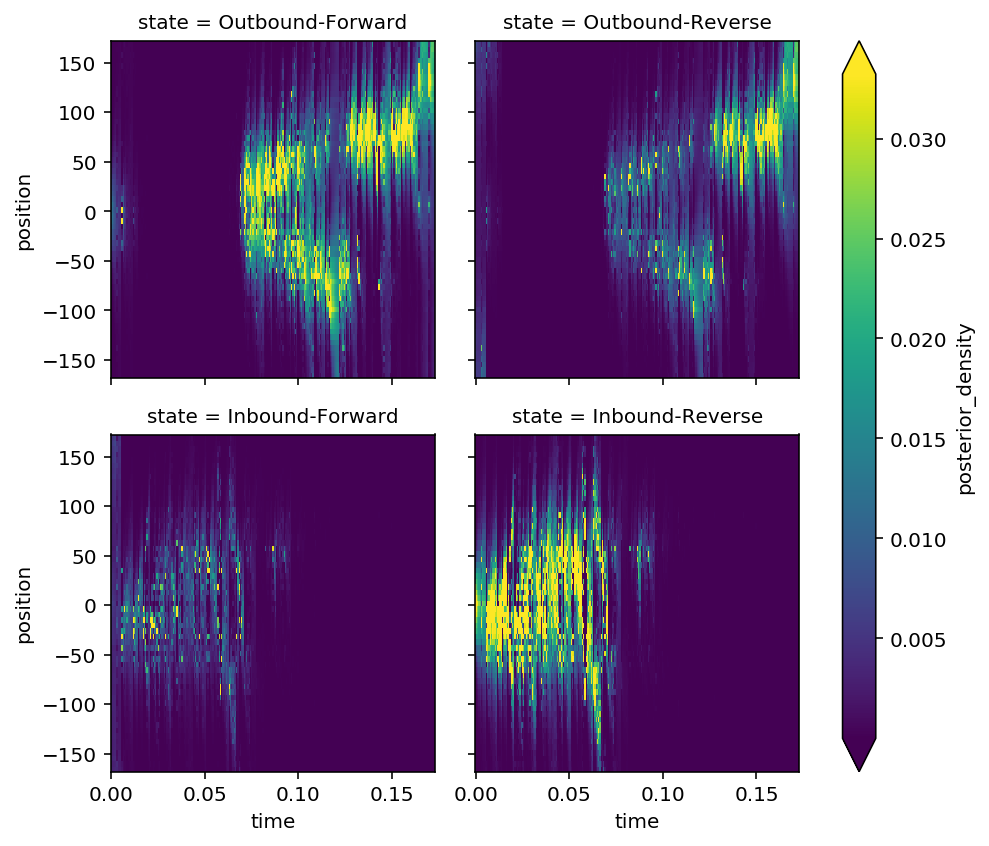

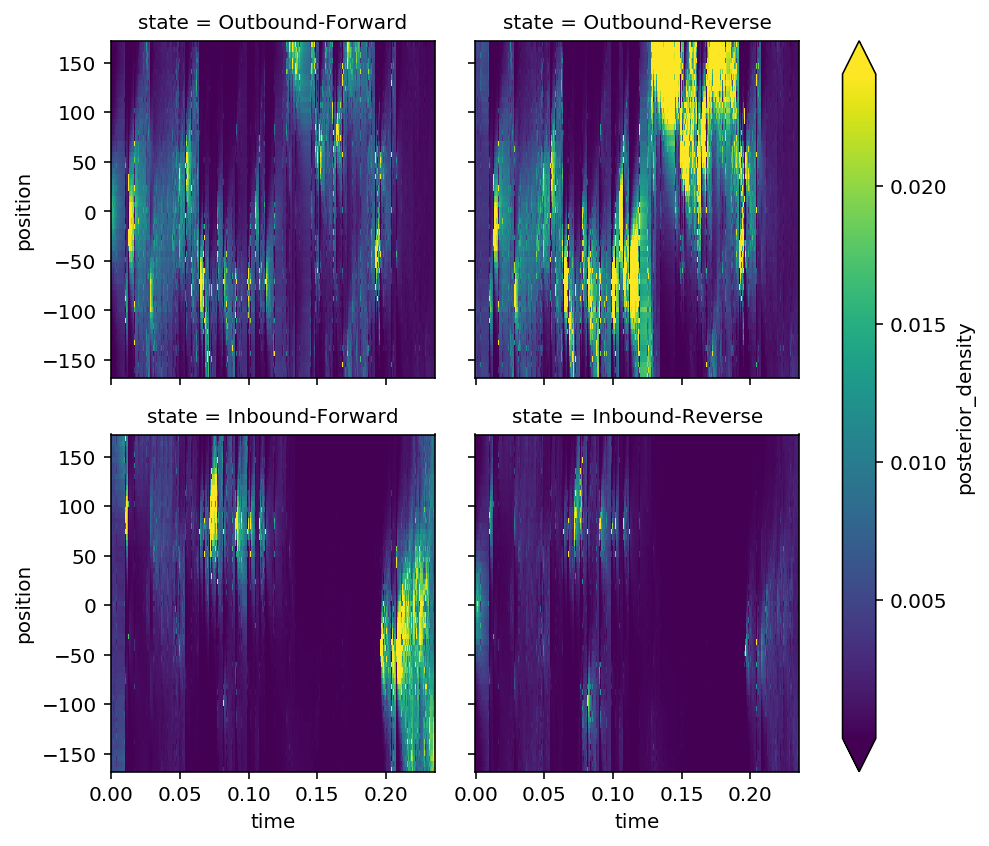

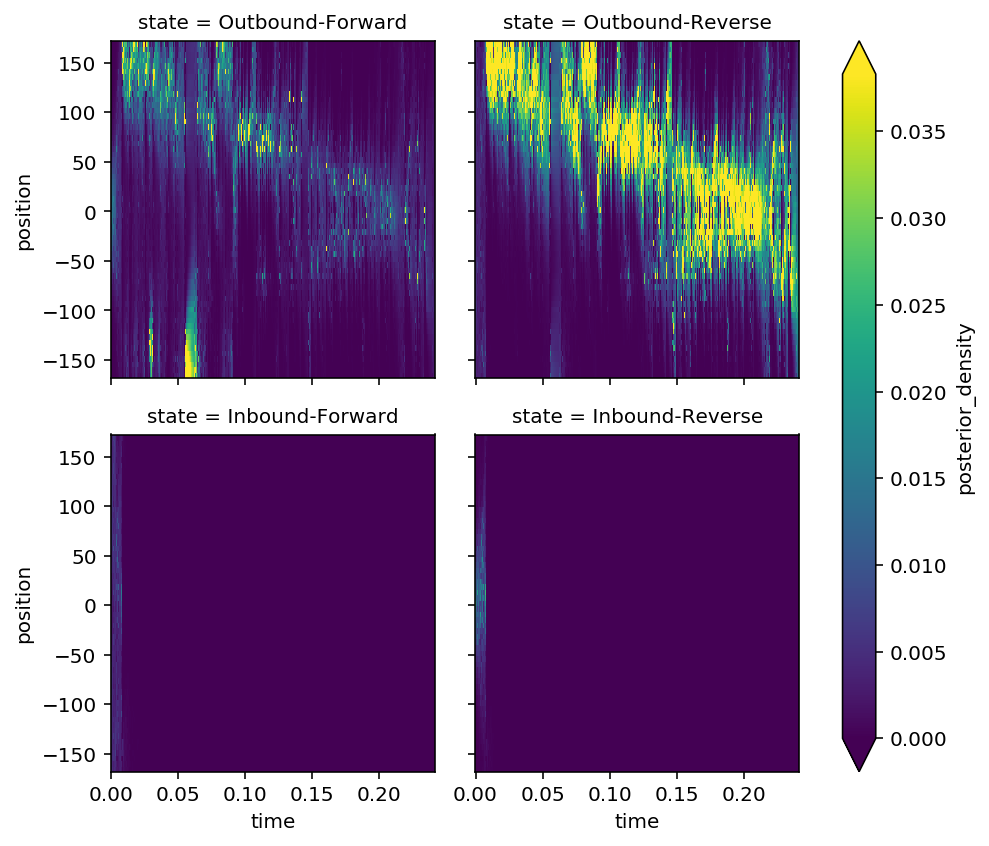

In [68]:
model = IsotropicKernelDensity
model_kwargs = dict(bandwidth=[20, 20, 20, 20, 1.0])

results = decode_ripple_clusterless(epoch_key, ANIMALS, model, model_kwargs,
                                    position_info=position_info)

for r in results:
    r.plot_posterior_density()

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...


INFO:replay_classification.decoders:Predicting replay type...
INFO:replay_classification.decoders:Predicting replay type...


INFO:replay_classification.decoders:Predicting replay type...
INFO:replay_classification.decoders:Predicting replay type...


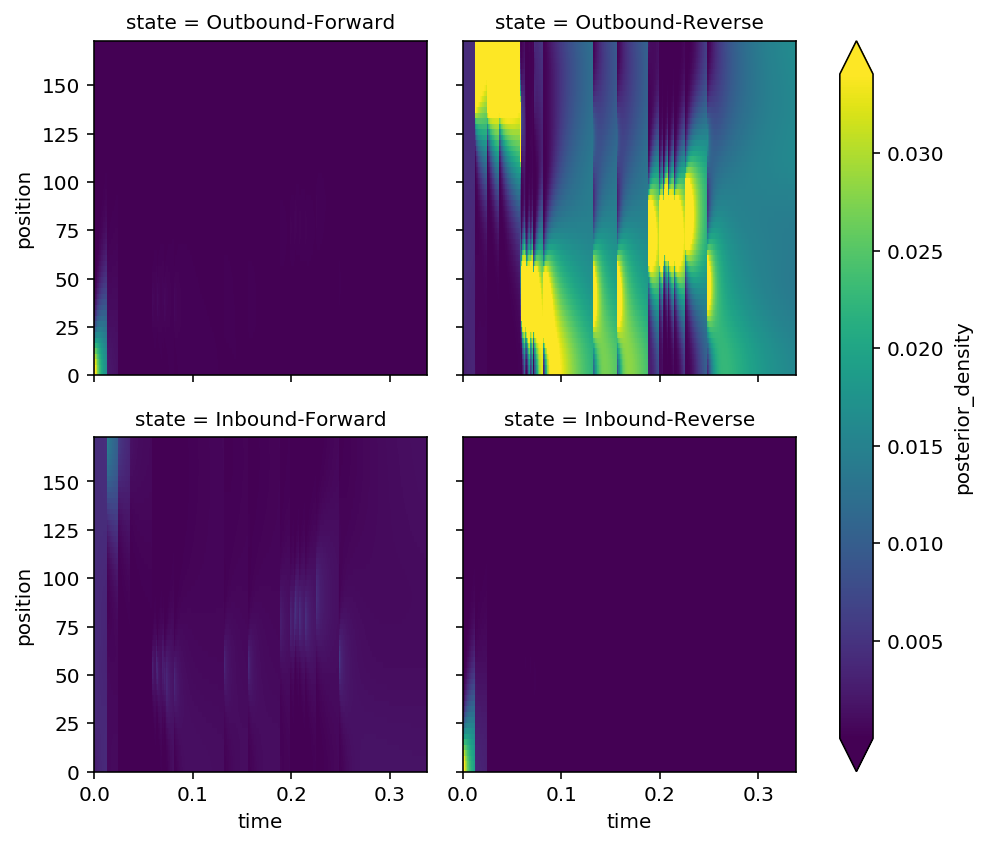

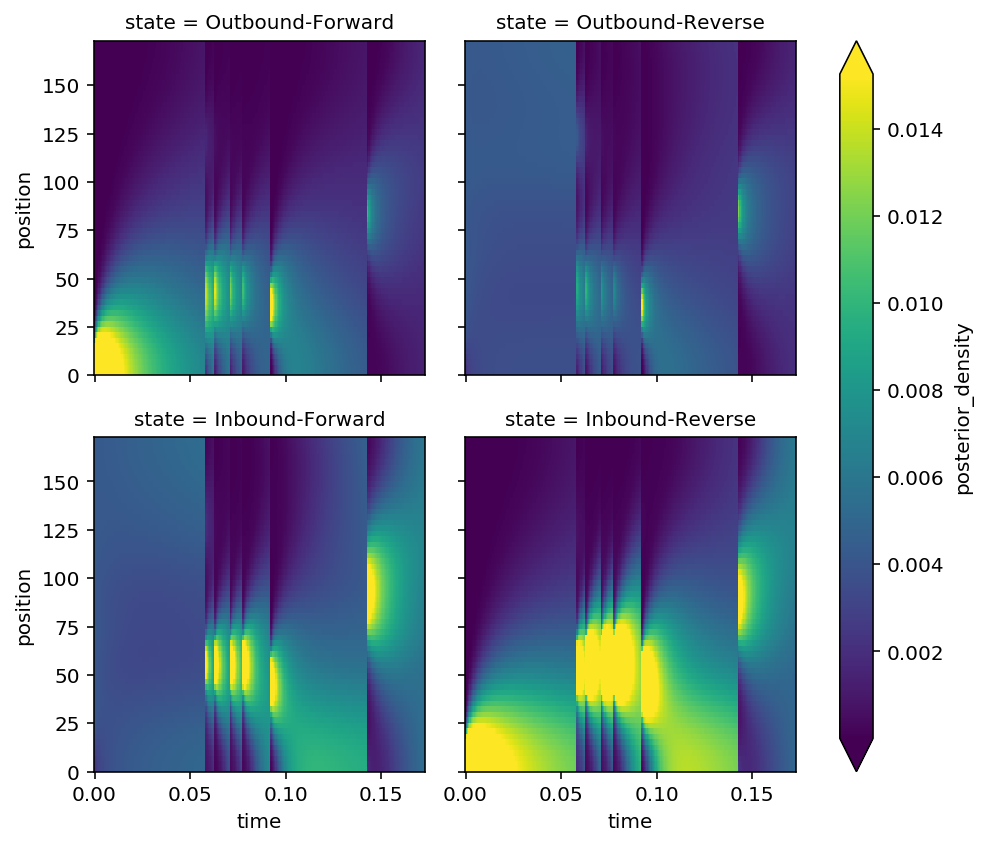

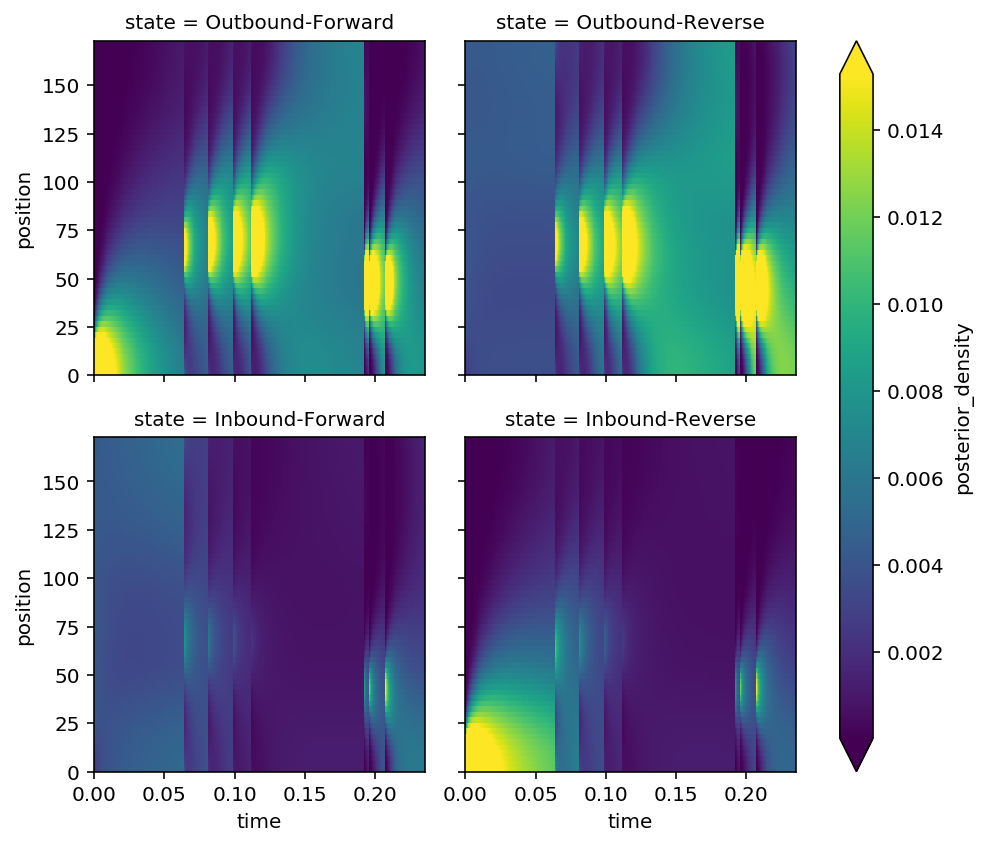

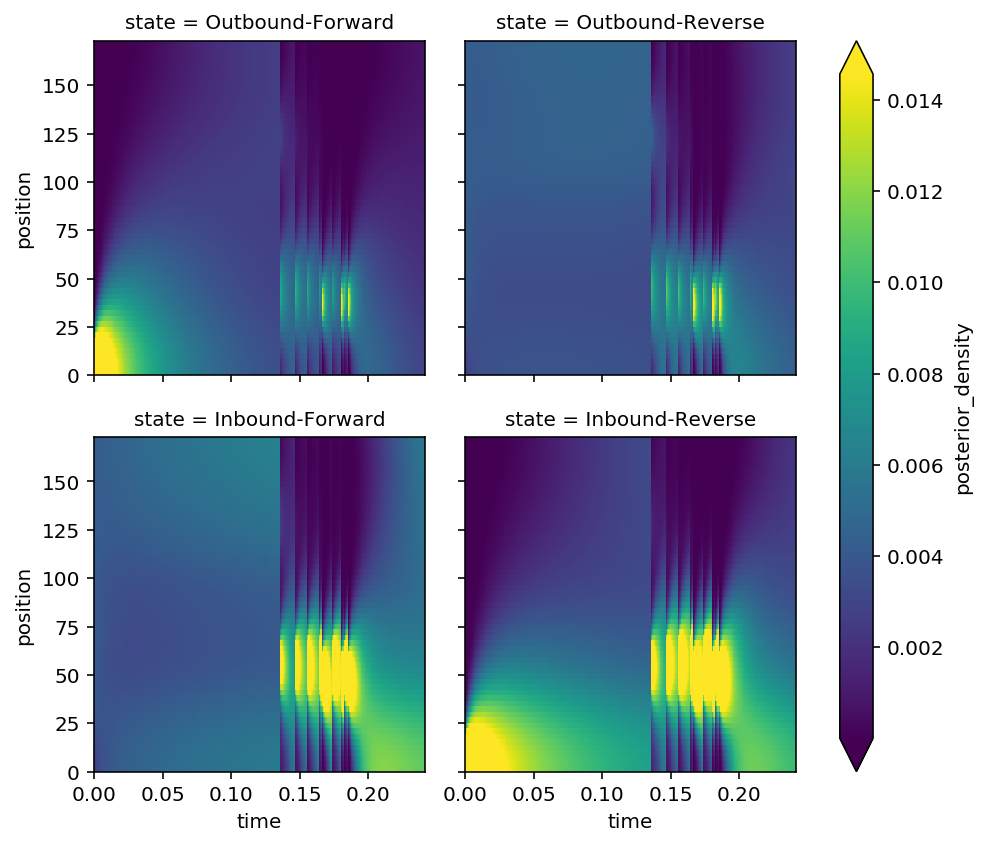

In [91]:
results = decode_ripple_spikes(epoch_key, ANIMALS,
                               position_info=position_info)

for r in results:
    r.plot_posterior_density()